###  Leaf Disease Detection Using CNN

Predicting disease for 4 species of plants :
- Corn 
- Grapes
- Potato 
- Tomato

In [1]:
!pip install tensorflow-macos
!pip install tensorflow-metal

  Obtaining dependency information for tensorflow-macos from https://files.pythonhosted.org/packages/05/c5/47dee312dde75b7f6c04af18287839cbede72418137ad9ed3c1965dad6ae/tensorflow_macos-2.16.2-cp311-cp311-macosx_12_0_arm64.whl.metadata
  Obtaining dependency information for tensorflow==2.16.2 from https://files.pythonhosted.org/packages/9d/72/6f09443493b9df2fd8a9585c9af4d9453762906a8e5735a8a5efa6e3d1e3/tensorflow-2.16.2-cp311-cp311-macosx_12_0_arm64.whl.metadata
  Obtaining dependency information for ml-dtypes~=0.3.1 from https://files.pythonhosted.org/packages/6e/a4/6aabb78f1569550fd77c74d2c1d008b502c8ce72776bd88b14ea6c182c9e/ml_dtypes-0.3.2-cp311-cp311-macosx_10_9_universal2.whl.metadata
  Obtaining dependency information for tensorboard<2.17,>=2.16 from https://files.pythonhosted.org/packages/3a/d0/b97889ffa769e2d1fdebb632084d5e8b53fc299d43a537acee7ec0c021a3/tensorboard-2.16.2-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.0/227.0 MB 9.1 MB/s eta 0:00:00:00

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.8/389.8 kB 4.3 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 18.0 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully uninstalled tensorboard-2.17.1
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.0
    Uninstalling tensorflow-2.17.0:
      Successfully uninstalled tensorflow-2.17.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.16.2 which is incompatible.
  Obtaining dependency information for 

In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
import numpy as np
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import Rescaling
from sklearn.metrics import precision_score, accuracy_score, recall_score, confusion_matrix, ConfusionMatrixDisplay

# Check GPU availability
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)

# Set random seed for reproducibility
np.random.seed(0)


Num GPUs Available:  1


In [4]:
train_gen = image_dataset_from_directory(directory="./train",
                                         image_size=(256, 256))
test_gen = image_dataset_from_directory(directory="./valid",
                                        image_size=(256, 256))

rescale = Rescaling(scale=1.0/255)
train_gen = train_gen.map(lambda image,label:(rescale(image),label))
test_gen  = test_gen.map(lambda image,label:(rescale(image),label))

Found 38585 files belonging to 21 classes.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU

2024-12-22 18:53:55.122837: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-12-22 18:53:55.122869: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-12-22 18:53:55.122878: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-12-22 18:53:55.123291: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-22 18:53:55.123310: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-12-22 18:53:55.146488: I tensorflow/core/common_runtime/placer.cc:125] input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.146689: I tensorflow/core/comm

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SelectV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DummySeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0


2024-12-22 18:53:55.446171: I tensorflow/core/common_runtime/placer.cc:125] condition: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.446180: I tensorflow/core/common_runtime/placer.cc:125] t: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.446183: I tensorflow/core/common_runtime/placer.cc:125] e: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.446186: I tensorflow/core/common_runtime/placer.cc:125] SelectV2: (SelectV2): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.446188: I tensorflow/core/common_runtime/placer.cc:125] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.449987: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.449996: I tensorflow/core/common_runtime/placer.cc:125] DummySeedGenerator: (DummySeedGenerator): /job:localhost/replica:0/task:0/device:CP

Found 9645 files belonging to 21 classes.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SelectV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DummySeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV3 in device /job:localhost/replica:0/task:0/de

2024-12-22 18:53:55.707789: I tensorflow/core/common_runtime/placer.cc:125] components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.707800: I tensorflow/core/common_runtime/placer.cc:125] TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.707803: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.708752: I tensorflow/core/common_runtime/placer.cc:125] components_0: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.708759: I tensorflow/core/common_runtime/placer.cc:125] TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.708763: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:53:55.709391: I tensorflow/core/common_runtime/placer.cc:125] input__datas

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

In [27]:
train_generator = train_datagen.flow_from_directory(
    "./train",
    target_size=(200, 200),
    batch_size=10,
    class_mode='categorical')

Found 38585 images belonging to 21 classes.


In [28]:
imgs, labels = next(train_generator)

In [29]:
from skimage import io

def imshow(image_RGB):
  io.imshow(image_RGB)
  io.show()

10
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


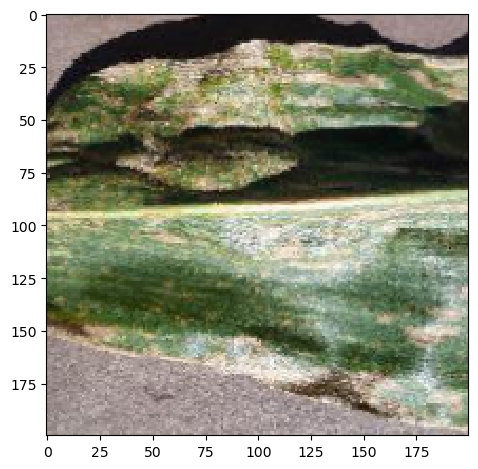

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]


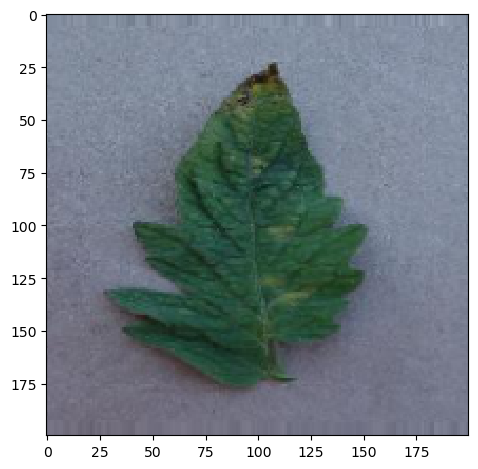

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


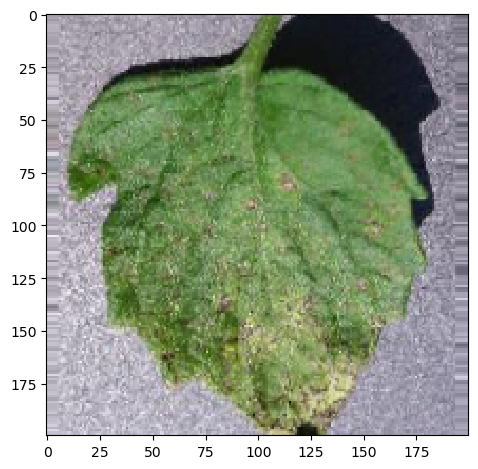

[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


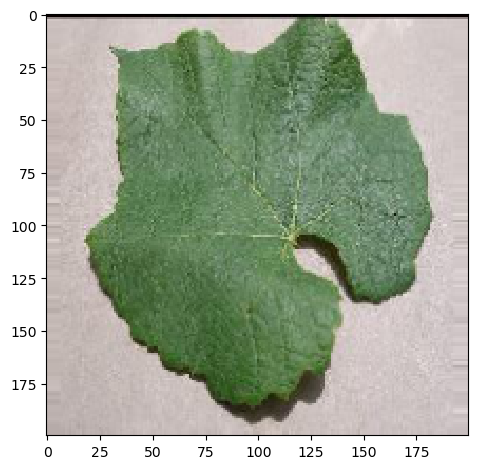

[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


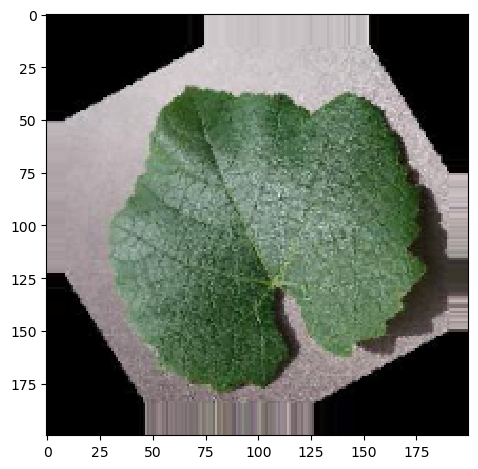

In [35]:
import matplotlib.pyplot as plt
%matplotlib inline
image_batch, label_batch = next(train_generator)

print(len(image_batch))
for i in range(0,len(image_batch)// 2):
    image = image_batch[i]
    print(label_batch[i])
    imshow(image)

In [5]:
model = keras.Sequential()

model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same",input_shape=(256,256,3)))
model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))

model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))

model.add(keras.layers.Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))

model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))

model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(1568,activation="relu"))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(38,activation="softmax"))

model.summary()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op FloorMod in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0


/Users/hemanshu_waghmare/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-12-22 18:54:05.739288: I tensorflow/core/common_runtime/placer.cc:125] x: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:05.739307: I tensorflow/core/common_runtime/placer.cc:125] y: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:05.739317: I tensorflow/core/common_runtime/placer.cc:125] FloorMod: (FloorMod): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:05.739322: I tensorflow/core/common_runtime/placer.cc:125] z_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:05.742447: I tensorflow/core/common_runtime/placer.cc:125] x: (_A

Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op FloorMod in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/de

2024-12-22 18:54:05.952861: I tensorflow/core/common_runtime/placer.cc:125] x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.952870: I tensorflow/core/common_runtime/placer.cc:125] y: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.952874: I tensorflow/core/common_runtime/placer.cc:125] Sub: (Sub): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.952877: I tensorflow/core/common_runtime/placer.cc:125] z_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.996632: I tensorflow/core/common_runtime/placer.cc:125] x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.996641: I tensorflow/core/common_runtime/placer.cc:125] y: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.996644: I tensorflow/core/common_runtime/placer.cc:125] Mul: (Mul): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:05.996646: I tensorflow/core/common_runtime/pla

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op FloorMod in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op FloorMod in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /j

2024-12-22 18:54:06.166919: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.166930: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.167645: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.167650: I tensorflow/core/common_runtime/placer.cc:125] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.167653: I tensorflow/core/common_runtime/placer.cc:125] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.171286: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.171294: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op FloorMod in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op StatelessR

ocalhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): 

2024-12-22 18:54:06.465029: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.465040: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.465887: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.465893: I tensorflow/core/common_runtime/placer.cc:125] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.465907: I tensorflow/core/common_runtime/placer.cc:125] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.468958: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:06.468965: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/

Model: "sequential"

/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replic

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 85, 85, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 85, 85, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 85, 85, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 512)      │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     6,554,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1568)           │    65,029,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │        59,622 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 76,092,966 (290.27 MB)

 Trainable params: 76,092,966 (290.27 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
# setting up the learning rate
opt = keras.optimizers.Adam(learning_rate=0.0001)

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 18:54:10.333975: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.334013: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.338176: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.338194: I tensorflow/core/common_runtime/placer.cc:125] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.338203: I tensorflow/core/common_runtime/placer.cc:125] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.341856: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:10.341875: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/

In [7]:
# compiling the model before fitting 
model.compile(optimizer=opt,loss="sparse_categorical_crossentropy",metrics=['accuracy'])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 18:54:15.749269: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:15.749281: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:15.753439: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:15.753449: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0


In [8]:
history = model.fit(train_gen,
          validation_data=test_gen,
          epochs = 10)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 1/10
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Exe

2024-12-22 18:54:18.255632: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:18.255655: I tensorflow/core/common_runtime/placer.cc:125] DatasetCardinality: (DatasetCardinality): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:18.255660: I tensorflow/core/common_runtime/placer.cc:125] cardinality_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:18.275666: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.275687: I tensorflow/core/common_runtime/placer.cc:125] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.275696: I tensorflow/core/common_runtime/placer.cc:125] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.287565: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:

2024-12-22 18:54:18.480296: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.480307: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.489013: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.489024: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.494115: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.494124: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.499874: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /j

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:

2024-12-22 18:54:18.681917: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.681923: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.688255: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.688260: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.692807: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.692813: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.697183: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /j

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:loc

job:localhost/replica:0/task:0/device:GPU:0
values_8: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_9: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_10: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_11: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_12: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_13: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_14: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_15: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_16: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_17: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_18: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_19: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_20: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_21: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
values_22: (_Arg): /job:localhost/replica:0/task:0/device:GPU:

2024-12-22 18:54:18.884977: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.884984: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.935920: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.935930: I tensorflow/core/common_runtime/placer.cc:125] VarIsInitializedOp: (VarIsInitializedOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.935933: I tensorflow/core/common_runtime/placer.cc:125] is__initialized_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.943214: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:18.943224: I tensorflow/core/common_runtime/placer.cc:125] VarIsInitializedOp: (VarIsIni

ial_conv2d_3_bias_momentum/Initializer/zeros: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_3_bias_velocity/Initializer/zeros: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_kernel_momentum/Initializer/zeros/shape_as_tensor: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_kernel_momentum/Initializer/zeros/Const: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_kernel_velocity/Initializer/zeros/shape_as_tensor: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_kernel_velocity/Initializer/zeros/Const: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_bias_momentum/Initializer/zeros: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_4_bias_velocity/Initializer/zeros: (Const): /job:localhost/replica:0/task:0/device:GPU:0
adam/sequential_conv2d_5_kernel_momentum/Initializer/zeros/shape

2024-12-22 18:54:19.459533: I tensorflow/core/common_runtime/placer.cc:125] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:19.459545: I tensorflow/core/common_runtime/placer.cc:125] unknown: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459549: I tensorflow/core/common_runtime/placer.cc:125] unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459565: I tensorflow/core/common_runtime/placer.cc:125] unknown_1: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459571: I tensorflow/core/common_runtime/placer.cc:125] unknown_2: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459574: I tensorflow/core/common_runtime/placer.cc:125] unknown_3: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459576: I tensorflow/core/common_runtime/placer.cc:125] unknown_4: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:19.459

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 2:08:53 6s/step - accuracy: 0.0000e+00 - loss: 3.6392Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 18:54:24.704102: I tensorflow/core/common_runtime/placer.cc:125] start: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:24.704120: I tensorflow/core/common_runtime/placer.cc:125] limit: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:24.704122: I tensorflow/core/common_runtime/placer.cc:125] delta: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 18:54:24.704125: I tensorflow/core/common_runtime/placer.cc:125] Range: (Range): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:24.704127: I tensorflow/core/common_runtime/placer.cc:125] output_RetVal: (_DeviceRetval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:24.705181: I tensorflow/core/common_runtime/placer.cc:125] input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 18:54:24.705189: I tensorflow/core/common_runtime/placer.cc:125] reduction__indices: (_DeviceArg): /job:localhost/replica:0/task:0/device

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   2/1206 ━━━━━━━━━━━━━━━━━━━━ 10:45 536ms/step - accuracy: 0.0156 - loss: 3.6340   Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 9:13 465ms/step - accuracy: 0.0359 - loss: 3.5460Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  15/1206 ━━━━━━━━━━━━━━━━━━━━ 9:12 464ms/step - accuracy: 0.0363 - loss: 3.5392Executing op __inference_one_step_on_iterator_4353 in

  26/1206 ━━━━━━━━━━━━━━━━━━━━ 9:02 460ms/step - accuracy: 0.0372 - loss: 3.4727Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  27/1206 ━━━━━━━━━━━━━━━━━━━━ 9:02 460ms/step - accuracy: 0.0371 - loss: 3.4677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  39/1206 ━━━━━━━━━━━━━━━━━━━━ 8:54 458ms/step - accuracy: 0.0372 - loss: 3.4203Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 457ms/step - accuracy: 0.0377 - loss: 3.3882Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  52/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 457ms/step - accuracy: 0.0377 - loss: 3.3860Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in

  63/1206 ━━━━━━━━━━━━━━━━━━━━ 8:42 457ms/step - accuracy: 0.0382 - loss: 3.3645Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  64/1206 ━━━━━━━━━━━━━━━━━━━━ 8:42 458ms/step - accuracy: 0.0382 - loss: 3.3628Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  75/1206 ━━━━━━━━━━━━━━━━━━━━ 8:42 462ms/step - accuracy: 0.0383 - loss: 3.3462Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  76/1206 ━━━━━━━━━━━━━━━━━━━━ 8:42 462ms/step - accuracy: 0.0383 - loss: 3.3448Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  87/1206 ━━━━━━━━━━━━━━━━━━━━ 8:36 462ms/step - accuracy: 0.0383 - loss: 3.3312Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  88/1206 ━━━━━━━━━━━━━━━━━━━━ 8:36 462ms/step - accuracy: 0.0383 - loss: 3.3301Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  99/1206 ━━━━━━━━━━━━━━━━━━━━ 8:34 465ms/step - accuracy: 0.0387 - loss: 3.3184Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 100/1206 ━━━━━━━━━━━━━━━━━━━━ 8:33 465ms/step - accuracy: 0.0388 - loss: 3.3174Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 111/1206 ━━━━━━━━━━━━━━━━━━━━ 8:28 464ms/step - accuracy: 0.0397 - loss: 3.3060Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 112/1206 ━━━━━━━━━━━━━━━━━━━━ 8:27 464ms/step - accuracy: 0.0398 - loss: 3.3049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 123/1206 ━━━━━━━━━━━━━━━━━━━━ 8:22 464ms/step - accuracy: 0.0412 - loss: 3.2925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 124/1206 ━━━━━━━━━━━━━━━━━━━━ 8:22 464ms/step - accuracy: 0.0414 - loss: 3.2914Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 135/1206 ━━━━━━━━━━━━━━━━━━━━ 8:16 464ms/step - accuracy: 0.0431 - loss: 3.2779Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 136/1206 ━━━━━━━━━━━━━━━━━━━━ 8:16 464ms/step - accuracy: 0.0433 - loss: 3.2767Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 147/1206 ━━━━━━━━━━━━━━━━━━━━ 8:11 464ms/step - accuracy: 0.0454 - loss: 3.2622Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 148/1206 ━━━━━━━━━━━━━━━━━━━━ 8:10 464ms/step - accuracy: 0.0456 - loss: 3.2608Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 159/1206 ━━━━━━━━━━━━━━━━━━━━ 8:05 463ms/step - accuracy: 0.0483 - loss: 3.2452Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 160/1206 ━━━━━━━━━━━━━━━━━━━━ 8:04 463ms/step - accuracy: 0.0485 - loss: 3.2437Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 171/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 463ms/step - accuracy: 0.0515 - loss: 3.2274Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 172/1206 ━━━━━━━━━━━━━━━━━━━━ 7:58 463ms/step - accuracy: 0.0518 - loss: 3.2259Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 183/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 462ms/step - accuracy: 0.0550 - loss: 3.2091Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 184/1206 ━━━━━━━━━━━━━━━━━━━━ 7:52 462ms/step - accuracy: 0.0553 - loss: 3.2075Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 195/1206 ━━━━━━━━━━━━━━━━━━━━ 7:47 462ms/step - accuracy: 0.0587 - loss: 3.1902Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 196/1206 ━━━━━━━━━━━━━━━━━━━━ 7:46 462ms/step - accuracy: 0.0590 - loss: 3.1886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 207/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 462ms/step - accuracy: 0.0626 - loss: 3.1708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 208/1206 ━━━━━━━━━━━━━━━━━━━━ 7:40 462ms/step - accuracy: 0.0630 - loss: 3.1691Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 219/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 462ms/step - accuracy: 0.0668 - loss: 3.1509Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 220/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 462ms/step - accuracy: 0.0672 - loss: 3.1493Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 231/1206 ━━━━━━━━━━━━━━━━━━━━ 7:30 462ms/step - accuracy: 0.0711 - loss: 3.1311Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 232/1206 ━━━━━━━━━━━━━━━━━━━━ 7:29 462ms/step - accuracy: 0.0715 - loss: 3.1295Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 243/1206 ━━━━━━━━━━━━━━━━━━━━ 7:24 462ms/step - accuracy: 0.0754 - loss: 3.1117Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 244/1206 ━━━━━━━━━━━━━━━━━━━━ 7:24 462ms/step - accuracy: 0.0758 - loss: 3.1101Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 255/1206 ━━━━━━━━━━━━━━━━━━━━ 7:20 463ms/step - accuracy: 0.0799 - loss: 3.0921Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 256/1206 ━━━━━━━━━━━━━━━━━━━━ 7:19 463ms/step - accuracy: 0.0803 - loss: 3.0905Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 267/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 463ms/step - accuracy: 0.0844 - loss: 3.0725Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 268/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 463ms/step - accuracy: 0.0848 - loss: 3.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:09 464ms/step - accuracy: 0.0890 - loss: 3.0528Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 280/1206 ━━━━━━━━━━━━━━━━━━━━ 7:09 463ms/step - accuracy: 0.0894 - loss: 3.0512Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:04 464ms/step - accuracy: 0.0937 - loss: 3.0333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 292/1206 ━━━━━━━━━━━━━━━━━━━━ 7:03 464ms/step - accuracy: 0.0941 - loss: 3.0317Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 303/1206 ━━━━━━━━━━━━━━━━━━━━ 6:58 463ms/step - accuracy: 0.0984 - loss: 3.0138Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 304/1206 ━━━━━━━━━━━━━━━━━━━━ 6:58 463ms/step - accuracy: 0.0988 - loss: 3.0122Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 315/1206 ━━━━━━━━━━━━━━━━━━━━ 6:53 464ms/step - accuracy: 0.1032 - loss: 2.9944Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 316/1206 ━━━━━━━━━━━━━━━━━━━━ 6:53 464ms/step - accuracy: 0.1036 - loss: 2.9929Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 327/1206 ━━━━━━━━━━━━━━━━━━━━ 6:48 465ms/step - accuracy: 0.1079 - loss: 2.9754Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 328/1206 ━━━━━━━━━━━━━━━━━━━━ 6:48 465ms/step - accuracy: 0.1083 - loss: 2.9738Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 339/1206 ━━━━━━━━━━━━━━━━━━━━ 6:44 467ms/step - accuracy: 0.1126 - loss: 2.9567Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 340/1206 ━━━━━━━━━━━━━━━━━━━━ 6:44 467ms/step - accuracy: 0.1130 - loss: 2.9552Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 351/1206 ━━━━━━━━━━━━━━━━━━━━ 6:40 468ms/step - accuracy: 0.1172 - loss: 2.9384Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 352/1206 ━━━━━━━━━━━━━━━━━━━━ 6:40 468ms/step - accuracy: 0.1176 - loss: 2.9369Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 363/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 470ms/step - accuracy: 0.1218 - loss: 2.9203Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 364/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 470ms/step - accuracy: 0.1222 - loss: 2.9188Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 375/1206 ━━━━━━━━━━━━━━━━━━━━ 6:31 472ms/step - accuracy: 0.1264 - loss: 2.9024Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 376/1206 ━━━━━━━━━━━━━━━━━━━━ 6:31 472ms/step - accuracy: 0.1267 - loss: 2.9009Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 387/1206 ━━━━━━━━━━━━━━━━━━━━ 6:26 473ms/step - accuracy: 0.1309 - loss: 2.8847Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 388/1206 ━━━━━━━━━━━━━━━━━━━━ 6:26 473ms/step - accuracy: 0.1313 - loss: 2.8832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 399/1206 ━━━━━━━━━━━━━━━━━━━━ 6:22 474ms/step - accuracy: 0.1355 - loss: 2.8671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 400/1206 ━━━━━━━━━━━━━━━━━━━━ 6:21 474ms/step - accuracy: 0.1359 - loss: 2.8657Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 476ms/step - accuracy: 0.1400 - loss: 2.8497Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 412/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 476ms/step - accuracy: 0.1404 - loss: 2.8483Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:15 480ms/step - accuracy: 0.1445 - loss: 2.8325Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 424/1206 ━━━━━━━━━━━━━━━━━━━━ 6:15 480ms/step - accuracy: 0.1449 - loss: 2.8311Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 483ms/step - accuracy: 0.1490 - loss: 2.8156Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 436/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 483ms/step - accuracy: 0.1494 - loss: 2.8142Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:08 486ms/step - accuracy: 0.1535 - loss: 2.7989Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 448/1206 ━━━━━━━━━━━━━━━━━━━━ 6:08 486ms/step - accuracy: 0.1539 - loss: 2.7976Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 491ms/step - accuracy: 0.1579 - loss: 2.7826Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 460/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 491ms/step - accuracy: 0.1582 - loss: 2.7812Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:02 494ms/step - accuracy: 0.1622 - loss: 2.7664Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 472/1206 ━━━━━━━━━━━━━━━━━━━━ 6:02 494ms/step - accuracy: 0.1625 - loss: 2.7651Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 483/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 497ms/step - accuracy: 0.1665 - loss: 2.7504Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 484/1206 ━━━━━━━━━━━━━━━━━━━━ 5:58 497ms/step - accuracy: 0.1668 - loss: 2.7491Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 495/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 500ms/step - accuracy: 0.1707 - loss: 2.7346Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 496/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 501ms/step - accuracy: 0.1711 - loss: 2.7333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 507/1206 ━━━━━━━━━━━━━━━━━━━━ 5:52 504ms/step - accuracy: 0.1749 - loss: 2.7191Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 508/1206 ━━━━━━━━━━━━━━━━━━━━ 5:51 504ms/step - accuracy: 0.1752 - loss: 2.7178Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 519/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 506ms/step - accuracy: 0.1790 - loss: 2.7037Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 520/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 507ms/step - accuracy: 0.1794 - loss: 2.7025Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:42 508ms/step - accuracy: 0.1832 - loss: 2.6886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 532/1206 ━━━━━━━━━━━━━━━━━━━━ 5:42 508ms/step - accuracy: 0.1835 - loss: 2.6874Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:37 510ms/step - accuracy: 0.1872 - loss: 2.6737Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 544/1206 ━━━━━━━━━━━━━━━━━━━━ 5:37 510ms/step - accuracy: 0.1876 - loss: 2.6725Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:32 510ms/step - accuracy: 0.1912 - loss: 2.6590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 556/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 510ms/step - accuracy: 0.1916 - loss: 2.6578Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:26 511ms/step - accuracy: 0.1952 - loss: 2.6445Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 568/1206 ━━━━━━━━━━━━━━━━━━━━ 5:26 511ms/step - accuracy: 0.1956 - loss: 2.6433Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:21 513ms/step - accuracy: 0.1992 - loss: 2.6302Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 580/1206 ━━━━━━━━━━━━━━━━━━━━ 5:20 513ms/step - accuracy: 0.1995 - loss: 2.6290Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:15 514ms/step - accuracy: 0.2030 - loss: 2.6162Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 592/1206 ━━━━━━━━━━━━━━━━━━━━ 5:15 514ms/step - accuracy: 0.2034 - loss: 2.6150Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 515ms/step - accuracy: 0.2069 - loss: 2.6023Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 604/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 515ms/step - accuracy: 0.2072 - loss: 2.6012Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 515ms/step - accuracy: 0.2106 - loss: 2.5887Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 616/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 515ms/step - accuracy: 0.2110 - loss: 2.5876Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 627/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 515ms/step - accuracy: 0.2143 - loss: 2.5754Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 628/1206 ━━━━━━━━━━━━━━━━━━━━ 4:57 515ms/step - accuracy: 0.2147 - loss: 2.5743Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:52 515ms/step - accuracy: 0.2180 - loss: 2.5622Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 640/1206 ━━━━━━━━━━━━━━━━━━━━ 4:51 515ms/step - accuracy: 0.2183 - loss: 2.5611Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:45 515ms/step - accuracy: 0.2216 - loss: 2.5493Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 652/1206 ━━━━━━━━━━━━━━━━━━━━ 4:45 515ms/step - accuracy: 0.2219 - loss: 2.5482Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:39 515ms/step - accuracy: 0.2251 - loss: 2.5365Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 664/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 515ms/step - accuracy: 0.2254 - loss: 2.5354Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:33 515ms/step - accuracy: 0.2287 - loss: 2.5239Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 676/1206 ━━━━━━━━━━━━━━━━━━━━ 4:33 515ms/step - accuracy: 0.2289 - loss: 2.5229Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:27 516ms/step - accuracy: 0.2321 - loss: 2.5115Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 688/1206 ━━━━━━━━━━━━━━━━━━━━ 4:27 516ms/step - accuracy: 0.2324 - loss: 2.5105Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:21 516ms/step - accuracy: 0.2355 - loss: 2.4993Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 700/1206 ━━━━━━━━━━━━━━━━━━━━ 4:21 516ms/step - accuracy: 0.2358 - loss: 2.4983Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:15 516ms/step - accuracy: 0.2389 - loss: 2.4873Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 712/1206 ━━━━━━━━━━━━━━━━━━━━ 4:15 516ms/step - accuracy: 0.2392 - loss: 2.4863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:09 516ms/step - accuracy: 0.2422 - loss: 2.4754Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 724/1206 ━━━━━━━━━━━━━━━━━━━━ 4:08 516ms/step - accuracy: 0.2425 - loss: 2.4744Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 517ms/step - accuracy: 0.2455 - loss: 2.4637Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 736/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 517ms/step - accuracy: 0.2458 - loss: 2.4628Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 747/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 518ms/step - accuracy: 0.2488 - loss: 2.4522Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 748/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 518ms/step - accuracy: 0.2490 - loss: 2.4512Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 519ms/step - accuracy: 0.2520 - loss: 2.4408Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 760/1206 ━━━━━━━━━━━━━━━━━━━━ 3:51 519ms/step - accuracy: 0.2523 - loss: 2.4399Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:46 520ms/step - accuracy: 0.2552 - loss: 2.4296Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 772/1206 ━━━━━━━━━━━━━━━━━━━━ 3:45 520ms/step - accuracy: 0.2554 - loss: 2.4286Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:39 520ms/step - accuracy: 0.2583 - loss: 2.4185Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 784/1206 ━━━━━━━━━━━━━━━━━━━━ 3:39 520ms/step - accuracy: 0.2586 - loss: 2.4176Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:33 520ms/step - accuracy: 0.2614 - loss: 2.4075Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 796/1206 ━━━━━━━━━━━━━━━━━━━━ 3:33 520ms/step - accuracy: 0.2617 - loss: 2.4066Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 521ms/step - accuracy: 0.2645 - loss: 2.3967Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 808/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 521ms/step - accuracy: 0.2647 - loss: 2.3958Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:22 523ms/step - accuracy: 0.2675 - loss: 2.3860Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 820/1206 ━━━━━━━━━━━━━━━━━━━━ 3:21 523ms/step - accuracy: 0.2678 - loss: 2.3852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:16 524ms/step - accuracy: 0.2705 - loss: 2.3755Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 832/1206 ━━━━━━━━━━━━━━━━━━━━ 3:16 524ms/step - accuracy: 0.2708 - loss: 2.3746Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 526ms/step - accuracy: 0.2735 - loss: 2.3651Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 844/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 526ms/step - accuracy: 0.2737 - loss: 2.3642Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:04 527ms/step - accuracy: 0.2764 - loss: 2.3548Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 856/1206 ━━━━━━━━━━━━━━━━━━━━ 3:04 527ms/step - accuracy: 0.2766 - loss: 2.3540Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:59 528ms/step - accuracy: 0.2793 - loss: 2.3447Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 868/1206 ━━━━━━━━━━━━━━━━━━━━ 2:58 528ms/step - accuracy: 0.2795 - loss: 2.3439Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:52 529ms/step - accuracy: 0.2821 - loss: 2.3347Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 880/1206 ━━━━━━━━━━━━━━━━━━━━ 2:52 529ms/step - accuracy: 0.2824 - loss: 2.3339Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:46 529ms/step - accuracy: 0.2850 - loss: 2.3248Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 892/1206 ━━━━━━━━━━━━━━━━━━━━ 2:46 529ms/step - accuracy: 0.2852 - loss: 2.3240Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:40 529ms/step - accuracy: 0.2878 - loss: 2.3151Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 904/1206 ━━━━━━━━━━━━━━━━━━━━ 2:39 529ms/step - accuracy: 0.2880 - loss: 2.3143Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:34 529ms/step - accuracy: 0.2905 - loss: 2.3055Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 916/1206 ━━━━━━━━━━━━━━━━━━━━ 2:33 529ms/step - accuracy: 0.2908 - loss: 2.3047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:27 530ms/step - accuracy: 0.2933 - loss: 2.2959Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 928/1206 ━━━━━━━━━━━━━━━━━━━━ 2:27 530ms/step - accuracy: 0.2935 - loss: 2.2952Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 530ms/step - accuracy: 0.2960 - loss: 2.2865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 940/1206 ━━━━━━━━━━━━━━━━━━━━ 2:20 530ms/step - accuracy: 0.2962 - loss: 2.2858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:15 530ms/step - accuracy: 0.2986 - loss: 2.2772Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 952/1206 ━━━━━━━━━━━━━━━━━━━━ 2:14 530ms/step - accuracy: 0.2989 - loss: 2.2765Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:08 529ms/step - accuracy: 0.3013 - loss: 2.2681Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 964/1206 ━━━━━━━━━━━━━━━━━━━━ 2:08 529ms/step - accuracy: 0.3015 - loss: 2.2673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:02 529ms/step - accuracy: 0.3039 - loss: 2.2590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 976/1206 ━━━━━━━━━━━━━━━━━━━━ 2:01 529ms/step - accuracy: 0.3041 - loss: 2.2582Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:55 529ms/step - accuracy: 0.3065 - loss: 2.2500Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 988/1206 ━━━━━━━━━━━━━━━━━━━━ 1:55 529ms/step - accuracy: 0.3067 - loss: 2.2493Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:49 529ms/step - accuracy: 0.3090 - loss: 2.2412Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1000/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 529ms/step - accuracy: 0.3093 - loss: 2.2404Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:43 529ms/step - accuracy: 0.3116 - loss: 2.2324Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1012/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 529ms/step - accuracy: 0.3118 - loss: 2.2317Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 528ms/step - accuracy: 0.3141 - loss: 2.2238Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1024/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 528ms/step - accuracy: 0.3143 - loss: 2.2230Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:30 528ms/step - accuracy: 0.3166 - loss: 2.2152Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1036/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 528ms/step - accuracy: 0.3168 - loss: 2.2145Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 528ms/step - accuracy: 0.3190 - loss: 2.2068Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1048/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 528ms/step - accuracy: 0.3192 - loss: 2.2061Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 528ms/step - accuracy: 0.3214 - loss: 2.1984Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1060/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 527ms/step - accuracy: 0.3216 - loss: 2.1977Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:11 527ms/step - accuracy: 0.3238 - loss: 2.1901Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1072/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 527ms/step - accuracy: 0.3240 - loss: 2.1894Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 527ms/step - accuracy: 0.3262 - loss: 2.1819Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1084/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 527ms/step - accuracy: 0.3264 - loss: 2.1812Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1095/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 527ms/step - accuracy: 0.3286 - loss: 2.1738Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1096/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 527ms/step - accuracy: 0.3288 - loss: 2.1731Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1108/1206 ━━━━━━━━━━━━━━━━━━━━ 51s 527ms/step - accuracy: 0.3311 - loss: 2.1651Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 527ms/step - accuracy: 0.3334 - loss: 2.1571Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1121/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 527ms/step - accuracy: 0.3

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 527ms/step - accuracy: 0.3357 - loss: 2.1493Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1133/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 527ms/step - accuracy: 0.3359 - loss: 2.1486Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1144/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 527ms/step - accuracy: 0.3380 - loss: 2.1415Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1145/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 527ms/step - accuracy: 0.3382 - loss: 2.1408Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1157/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 527ms/step - accuracy: 0.3404 - loss: 2.1331Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 526ms/step - accuracy: 0.3427 - loss: 2.1255Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1170/1206 ━━━━━━━━━━━━━━━━━━━━ 18s 526ms/step - accuracy: 0.3

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 526ms/step - accuracy: 0.3449 - loss: 2.1179Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1182/1206 ━━━━━━━━━━━━━━━━━━━━ 12s 526ms/step - accuracy: 0.3450 - loss: 2.1173Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 527ms/step - accuracy: 0.3470 - loss: 2.1105Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1194/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 527ms/step - accuracy: 0.3472 - loss: 2.1099Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.3494 - loss: 2.1025Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/ta

2024-12-22 19:05:01.468586: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.468612: I tensorflow/core/common_runtime/placer.cc:125] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.468616: I tensorflow/core/common_runtime/placer.cc:125] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.538176: I tensorflow/core/common_runtime/placer.cc:125] x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.538186: I tensorflow/core/common_runtime/placer.cc:125] y: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.538190: I tensorflow/core/common_runtime/placer.cc:125] DivNoNan: (DivNoNan): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 19:05:01.538193: I tensorflow/core/common_runtime/placer.cc:125] z_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0


GPU:0
StatefulPartitionedCall/adam/Const_92: (Const): /job:localhost/replica:0/task:0/device:CPU:0
StatefulPartitionedCall/adam/Cast_117/x: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/Cast_118/x: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/sub_92/x: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/sub_93/x: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/Const_93: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/Const_94: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/Const_95: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/adam/Const_96: (Const): /job:localhost/replica:0/task:0/device:CPU:0
StatefulPartitionedCall/strided_slice_1/stack: (Const): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/strided_slice_1/stack_1: (Co

2024-12-22 19:05:01.720172: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720184: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720188: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720191: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720194: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720196: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:01.720198: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 692s 569ms/step - accuracy: 0.3496 - loss: 2.1018 - val_accuracy: 0.7890 - val_loss: 0.6420
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariabl

2024-12-22 19:05:50.031635: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031656: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031659: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031662: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031664: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031667: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:05:50.031669: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 19:21 964ms/step - accuracy: 0.8438 - loss: 0.5946Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 11:18 569ms/step - accuracy: 0.7971 - loss: 0.6411Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 11:16 567ms/step - accuracy: 0.7977 - loss: 0.6395Executing op __inference_one_step_on_iterator_4353 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 10:53 554ms/step - accuracy: 0.7997 - loss: 0.6412Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:52 553ms/step - accuracy: 0.7996 - loss: 0.6424Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:42 550ms/step - accuracy: 0.7998 - loss: 0.6450Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 10:31 546ms/step - accuracy: 0.8004 - loss: 0.6441Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 10:30 546ms/step - accuracy: 0.8003 - loss: 0.6441Executing op __inference_one_step_on_iterator_4353 

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 541ms/step - accuracy: 0.8000 - loss: 0.6439Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 10:18 541ms/step - accuracy: 0.8000 - loss: 0.6439Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 540ms/step - accuracy: 0.8001 - loss: 0.6420Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 541ms/step - accuracy: 0.8001 - loss: 0.6418Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 10:14 548ms/step - accuracy: 0.8004 - loss: 0.6396Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 10:14 549ms/step - accuracy: 0.8004 - loss: 0.6394Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 10:12 553ms/step - accuracy: 0.8003 - loss: 0.6383Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 10:12 553ms/step - accuracy: 0.8002 - loss: 0.6382Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 10:01 549ms/step - accuracy: 0.7997 - loss: 0.6380Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 10:00 549ms/step - accuracy: 0.7997 - loss: 0.6380Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 9:49 544ms/step - accuracy: 0.7992 - loss: 0.6377Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:48 544ms/step - accuracy: 0.7992 - loss: 0.6376Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:38 540ms/step - accuracy: 0.7991 - loss: 0.6368Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 540ms/step - accuracy: 0.7991 - loss: 0.6367Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 9:28 536ms/step - accuracy: 0.7988 - loss: 0.6362Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 9:27 536ms/step - accuracy: 0.7988 - loss: 0.6362Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 533ms/step - accuracy: 0.7986 - loss: 0.6357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 533ms/step - accuracy: 0.7986 - loss: 0.6357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 9:10 531ms/step - accuracy: 0.7985 - loss: 0.6351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 9:09 531ms/step - accuracy: 0.7985 - loss: 0.6350Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 529ms/step - accuracy: 0.7984 - loss: 0.6341Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 529ms/step - accuracy: 0.7984 - loss: 0.6340Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 8:53 527ms/step - accuracy: 0.7983 - loss: 0.6333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:52 527ms/step - accuracy: 0.7983 - loss: 0.6332Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 8:45 525ms/step - accuracy: 0.7983 - loss: 0.6325Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:44 525ms/step - accuracy: 0.7983 - loss: 0.6324Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 8:37 523ms/step - accuracy: 0.7982 - loss: 0.6316Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:36 523ms/step - accuracy: 0.7982 - loss: 0.6315Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 8:29 522ms/step - accuracy: 0.7982 - loss: 0.6305Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:28 522ms/step - accuracy: 0.7982 - loss: 0.6304Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 520ms/step - accuracy: 0.7983 - loss: 0.6294Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 520ms/step - accuracy: 0.7984 - loss: 0.6293Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 8:14 519ms/step - accuracy: 0.7985 - loss: 0.6282Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:13 519ms/step - accuracy: 0.7985 - loss: 0.6281Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 8:06 518ms/step - accuracy: 0.7988 - loss: 0.6268Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:05 518ms/step - accuracy: 0.7988 - loss: 0.6266Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 516ms/step - accuracy: 0.7991 - loss: 0.6253Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:58 516ms/step - accuracy: 0.7991 - loss: 0.6252Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 7:52 515ms/step - accuracy: 0.7994 - loss: 0.6240Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:51 515ms/step - accuracy: 0.7994 - loss: 0.6239Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 7:44 514ms/step - accuracy: 0.7997 - loss: 0.6225Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:44 514ms/step - accuracy: 0.7997 - loss: 0.6224Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 7:37 513ms/step - accuracy: 0.8000 - loss: 0.6211Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:37 513ms/step - accuracy: 0.8000 - loss: 0.6209Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:30 512ms/step - accuracy: 0.8003 - loss: 0.6196Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:30 512ms/step - accuracy: 0.8003 - loss: 0.6195Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:24 512ms/step - accuracy: 0.8006 - loss: 0.6183Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:23 512ms/step - accuracy: 0.8006 - loss: 0.6182Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:17 511ms/step - accuracy: 0.8009 - loss: 0.6169Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:16 511ms/step - accuracy: 0.8009 - loss: 0.6168Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 511ms/step - accuracy: 0.8012 - loss: 0.6156Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 511ms/step - accuracy: 0.8012 - loss: 0.6155Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 7:05 511ms/step - accuracy: 0.8015 - loss: 0.6143Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:04 511ms/step - accuracy: 0.8015 - loss: 0.6142Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 514ms/step - accuracy: 0.8018 - loss: 0.6129Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:00 514ms/step - accuracy: 0.8018 - loss: 0.6128Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 6:59 519ms/step - accuracy: 0.8021 - loss: 0.6116Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 6:58 519ms/step - accuracy: 0.8022 - loss: 0.6115Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 6:56 523ms/step - accuracy: 0.8025 - loss: 0.6103Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:56 524ms/step - accuracy: 0.8025 - loss: 0.6102Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 6:51 525ms/step - accuracy: 0.8028 - loss: 0.6090Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:51 525ms/step - accuracy: 0.8028 - loss: 0.6089Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 6:45 525ms/step - accuracy: 0.8031 - loss: 0.6077Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:45 525ms/step - accuracy: 0.8032 - loss: 0.6076Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:39 526ms/step - accuracy: 0.8035 - loss: 0.6064Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:38 526ms/step - accuracy: 0.8035 - loss: 0.6063Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:33 526ms/step - accuracy: 0.8038 - loss: 0.6052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:32 526ms/step - accuracy: 0.8038 - loss: 0.6051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:26 525ms/step - accuracy: 0.8041 - loss: 0.6040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:26 526ms/step - accuracy: 0.8041 - loss: 0.6039Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:20 526ms/step - accuracy: 0.8044 - loss: 0.6028Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:20 526ms/step - accuracy: 0.8045 - loss: 0.6027Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:14 526ms/step - accuracy: 0.8048 - loss: 0.6016Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:13 526ms/step - accuracy: 0.8048 - loss: 0.6015Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 6:07 525ms/step - accuracy: 0.8051 - loss: 0.6004Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:07 525ms/step - accuracy: 0.8051 - loss: 0.6003Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 6:01 526ms/step - accuracy: 0.8054 - loss: 0.5992Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 6:01 526ms/step - accuracy: 0.8055 - loss: 0.5991Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 526ms/step - accuracy: 0.8057 - loss: 0.5981Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 526ms/step - accuracy: 0.8058 - loss: 0.5980Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 5:49 526ms/step - accuracy: 0.8061 - loss: 0.5969Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:48 526ms/step - accuracy: 0.8061 - loss: 0.5968Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:43 526ms/step - accuracy: 0.8064 - loss: 0.5958Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:42 526ms/step - accuracy: 0.8064 - loss: 0.5957Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:36 526ms/step - accuracy: 0.8067 - loss: 0.5947Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:36 526ms/step - accuracy: 0.8067 - loss: 0.5946Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:30 526ms/step - accuracy: 0.8070 - loss: 0.5936Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 526ms/step - accuracy: 0.8070 - loss: 0.5936Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:23 525ms/step - accuracy: 0.8073 - loss: 0.5926Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:22 525ms/step - accuracy: 0.8073 - loss: 0.5925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:16 525ms/step - accuracy: 0.8075 - loss: 0.5916Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:16 525ms/step - accuracy: 0.8076 - loss: 0.5915Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 524ms/step - accuracy: 0.8078 - loss: 0.5906Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:09 524ms/step - accuracy: 0.8078 - loss: 0.5905Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 525ms/step - accuracy: 0.8081 - loss: 0.5896Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:03 525ms/step - accuracy: 0.8081 - loss: 0.5895Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 525ms/step - accuracy: 0.8084 - loss: 0.5886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:57 525ms/step - accuracy: 0.8084 - loss: 0.5885Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 4:51 525ms/step - accuracy: 0.8086 - loss: 0.5876Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:51 525ms/step - accuracy: 0.8087 - loss: 0.5875Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 4:45 525ms/step - accuracy: 0.8089 - loss: 0.5866Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:44 525ms/step - accuracy: 0.8089 - loss: 0.5865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 524ms/step - accuracy: 0.8092 - loss: 0.5856Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 524ms/step - accuracy: 0.8092 - loss: 0.5855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:32 524ms/step - accuracy: 0.8095 - loss: 0.5846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:32 524ms/step - accuracy: 0.8095 - loss: 0.5845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:26 525ms/step - accuracy: 0.8098 - loss: 0.5836Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:26 525ms/step - accuracy: 0.8098 - loss: 0.5835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:20 526ms/step - accuracy: 0.8101 - loss: 0.5825Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:20 526ms/step - accuracy: 0.8101 - loss: 0.5824Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:14 526ms/step - accuracy: 0.8104 - loss: 0.5815Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:13 525ms/step - accuracy: 0.8104 - loss: 0.5814Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:07 525ms/step - accuracy: 0.8106 - loss: 0.5805Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:07 525ms/step - accuracy: 0.8107 - loss: 0.5805Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 4:01 525ms/step - accuracy: 0.8109 - loss: 0.5796Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 4:01 525ms/step - accuracy: 0.8110 - loss: 0.5795Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 3:55 525ms/step - accuracy: 0.8112 - loss: 0.5786Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:54 525ms/step - accuracy: 0.8112 - loss: 0.5785Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 3:48 525ms/step - accuracy: 0.8115 - loss: 0.5776Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:48 525ms/step - accuracy: 0.8115 - loss: 0.5776Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:42 525ms/step - accuracy: 0.8117 - loss: 0.5767Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:41 525ms/step - accuracy: 0.8118 - loss: 0.5766Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:36 525ms/step - accuracy: 0.8120 - loss: 0.5758Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:35 525ms/step - accuracy: 0.8120 - loss: 0.5757Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:29 525ms/step - accuracy: 0.8123 - loss: 0.5748Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:29 525ms/step - accuracy: 0.8123 - loss: 0.5747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:23 525ms/step - accuracy: 0.8125 - loss: 0.5739Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:23 525ms/step - accuracy: 0.8126 - loss: 0.5738Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:17 524ms/step - accuracy: 0.8128 - loss: 0.5729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:16 524ms/step - accuracy: 0.8128 - loss: 0.5728Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 524ms/step - accuracy: 0.8131 - loss: 0.5720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 524ms/step - accuracy: 0.8131 - loss: 0.5719Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 3:04 524ms/step - accuracy: 0.8133 - loss: 0.5711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:03 524ms/step - accuracy: 0.8134 - loss: 0.5710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 2:57 523ms/step - accuracy: 0.8136 - loss: 0.5702Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:57 523ms/step - accuracy: 0.8136 - loss: 0.5701Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 2:51 523ms/step - accuracy: 0.8139 - loss: 0.5692Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:51 523ms/step - accuracy: 0.8139 - loss: 0.5692Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:45 523ms/step - accuracy: 0.8141 - loss: 0.5683Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:44 523ms/step - accuracy: 0.8141 - loss: 0.5683Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:39 523ms/step - accuracy: 0.8144 - loss: 0.5675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:38 523ms/step - accuracy: 0.8144 - loss: 0.5674Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:32 523ms/step - accuracy: 0.8146 - loss: 0.5666Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:32 523ms/step - accuracy: 0.8147 - loss: 0.5665Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:26 523ms/step - accuracy: 0.8149 - loss: 0.5657Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:25 523ms/step - accuracy: 0.8149 - loss: 0.5656Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:20 522ms/step - accuracy: 0.8151 - loss: 0.5648Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:19 522ms/step - accuracy: 0.8152 - loss: 0.5648Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 522ms/step - accuracy: 0.8154 - loss: 0.5640Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 522ms/step - accuracy: 0.8154 - loss: 0.5639Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 523ms/step - accuracy: 0.8156 - loss: 0.5631Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 523ms/step - accuracy: 0.8157 - loss: 0.5631Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 2:01 523ms/step - accuracy: 0.8159 - loss: 0.5623Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 523ms/step - accuracy: 0.8159 - loss: 0.5622Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 1:55 523ms/step - accuracy: 0.8161 - loss: 0.5615Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 523ms/step - accuracy: 0.8161 - loss: 0.5614Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 523ms/step - accuracy: 0.8164 - loss: 0.5607Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 523ms/step - accuracy: 0.8164 - loss: 0.5606Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 524ms/step - accuracy: 0.8166 - loss: 0.5599Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 524ms/step - accuracy: 0.8166 - loss: 0.5598Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 524ms/step - accuracy: 0.8169 - loss: 0.5591Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:35 524ms/step - accuracy: 0.8169 - loss: 0.5590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:30 524ms/step - accuracy: 0.8171 - loss: 0.5583Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 524ms/step - accuracy: 0.8171 - loss: 0.5582Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 525ms/step - accuracy: 0.8173 - loss: 0.5575Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 525ms/step - accuracy: 0.8174 - loss: 0.5574Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 525ms/step - accuracy: 0.8176 - loss: 0.5567Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 525ms/step - accuracy: 0.8176 - loss: 0.5566Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:11 525ms/step - accuracy: 0.8178 - loss: 0.5559Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 525ms/step - accuracy: 0.8178 - loss: 0.5558Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:05 525ms/step - accuracy: 0.8180 - loss: 0.5551Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 525ms/step - accuracy: 0.8181 - loss: 0.5551Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 525ms/step - accuracy: 0.8183 - loss: 0.5543Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 525ms/step - accuracy: 0.8183 - loss: 0.5543Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 51s 525ms/step - accuracy: 0.8185 - loss: 0.5535Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 525ms/step - accuracy: 0.8187 - loss: 0.5528Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 525ms/step - accuracy: 0.8

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 39s 525ms/step - accuracy: 0.8190 - loss: 0.5520Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 525ms/step - accuracy: 0.8190 - loss: 0.5520Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 33s 525ms/step - accuracy: 0.8192 - loss: 0.5513Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 525ms/step - accuracy: 0.8192 - loss: 0.5512Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 26s 525ms/step - accuracy: 0.8194 - loss: 0.5505Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 525ms/step - accuracy: 0.8196 - loss: 0.5498Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 525ms/step - accuracy: 0.8

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 525ms/step - accuracy: 0.8199 - loss: 0.5491Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 525ms/step - accuracy: 0.8199 - loss: 0.5490Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 525ms/step - accuracy: 0.8201 - loss: 0.5484Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 525ms/step - accuracy: 0.8201 - loss: 0.5483Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.8203 - loss: 0.5476Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

2024-12-22 19:16:23.492168: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492183: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492187: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492190: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492193: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492195: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:16:23.492198: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 679s 562ms/step - accuracy: 0.8203 - loss: 0.5475 - val_accuracy: 0.8850 - val_loss: 0.3391
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 3/10

2024-12-22 19:17:08.673648: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673663: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673667: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673670: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673673: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673675: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:17:08.673677: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 18:20 913ms/step - accuracy: 0.8750 - loss: 0.3331Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 11:29 578ms/step - accuracy: 0.8951 - loss: 0.2736Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 11:26 576ms/step - accuracy: 0.8942 - loss: 0.2759Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 11:06 565ms/step - accuracy: 0.8802 - loss: 0.3133Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 11:05 564ms/step - accuracy: 0.8793 - loss: 0.3161Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:50 557ms/step - accuracy: 0.8720 - loss: 0.3374Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 10:28 544ms/step - accuracy: 0.8686 - loss: 0.3478Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 10:26 543ms/step - accuracy: 0.8684 - loss: 0.3485Executing op __inference_one_step_on_iterator_4353 

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 10:12 536ms/step - accuracy: 0.8664 - loss: 0.3569Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 535ms/step - accuracy: 0.8663 - loss: 0.3577Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 9:59 530ms/step - accuracy: 0.8654 - loss: 0.3632 Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 9:58 529ms/step - accuracy: 0.8653 - loss: 0.3636Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean i

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 9:48 526ms/step - accuracy: 0.8652 - loss: 0.3667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 9:47 525ms/step - accuracy: 0.8652 - loss: 0.3669Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 9:38 522ms/step - accuracy: 0.8653 - loss: 0.3693Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 521ms/step - accuracy: 0.8653 - loss: 0.3695Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 9:28 519ms/step - accuracy: 0.8650 - loss: 0.3721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 9:27 518ms/step - accuracy: 0.8649 - loss: 0.3724Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 9:19 517ms/step - accuracy: 0.8646 - loss: 0.3747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:19 516ms/step - accuracy: 0.8645 - loss: 0.3749Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:11 515ms/step - accuracy: 0.8643 - loss: 0.3765Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:11 515ms/step - accuracy: 0.8643 - loss: 0.3766Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 9:04 513ms/step - accuracy: 0.8642 - loss: 0.3775Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 9:03 513ms/step - accuracy: 0.8642 - loss: 0.3775Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 8:55 511ms/step - accuracy: 0.8643 - loss: 0.3782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 8:55 511ms/step - accuracy: 0.8643 - loss: 0.3782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 8:48 510ms/step - accuracy: 0.8645 - loss: 0.3784Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 510ms/step - accuracy: 0.8646 - loss: 0.3784Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 8:40 509ms/step - accuracy: 0.8649 - loss: 0.3782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 8:40 509ms/step - accuracy: 0.8649 - loss: 0.3781Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 8:33 508ms/step - accuracy: 0.8652 - loss: 0.3780Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:33 507ms/step - accuracy: 0.8652 - loss: 0.3780Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 8:26 507ms/step - accuracy: 0.8654 - loss: 0.3782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:26 507ms/step - accuracy: 0.8654 - loss: 0.3783Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 8:19 506ms/step - accuracy: 0.8655 - loss: 0.3784Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:19 506ms/step - accuracy: 0.8655 - loss: 0.3784Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 8:12 505ms/step - accuracy: 0.8656 - loss: 0.3785Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:12 505ms/step - accuracy: 0.8656 - loss: 0.3785Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:06 505ms/step - accuracy: 0.8657 - loss: 0.3785Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:05 504ms/step - accuracy: 0.8657 - loss: 0.3785Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 504ms/step - accuracy: 0.8659 - loss: 0.3783Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 504ms/step - accuracy: 0.8659 - loss: 0.3782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 504ms/step - accuracy: 0.8661 - loss: 0.3779Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 504ms/step - accuracy: 0.8662 - loss: 0.3779Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 7:47 504ms/step - accuracy: 0.8664 - loss: 0.3775Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:46 504ms/step - accuracy: 0.8664 - loss: 0.3775Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 503ms/step - accuracy: 0.8667 - loss: 0.3771Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:40 503ms/step - accuracy: 0.8667 - loss: 0.3770Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 7:34 503ms/step - accuracy: 0.8669 - loss: 0.3766Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:34 503ms/step - accuracy: 0.8669 - loss: 0.3765Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 7:28 503ms/step - accuracy: 0.8672 - loss: 0.3760Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:28 503ms/step - accuracy: 0.8672 - loss: 0.3760Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:22 503ms/step - accuracy: 0.8675 - loss: 0.3754Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:22 503ms/step - accuracy: 0.8675 - loss: 0.3753Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:16 503ms/step - accuracy: 0.8678 - loss: 0.3747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:16 503ms/step - accuracy: 0.8678 - loss: 0.3747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 503ms/step - accuracy: 0.8681 - loss: 0.3741Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 503ms/step - accuracy: 0.8682 - loss: 0.3740Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:04 503ms/step - accuracy: 0.8685 - loss: 0.3733Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:04 503ms/step - accuracy: 0.8685 - loss: 0.3733Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 6:58 503ms/step - accuracy: 0.8688 - loss: 0.3727Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 6:57 503ms/step - accuracy: 0.8688 - loss: 0.3727Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 6:52 503ms/step - accuracy: 0.8691 - loss: 0.3722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 6:52 503ms/step - accuracy: 0.8691 - loss: 0.3721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 6:46 504ms/step - accuracy: 0.8694 - loss: 0.3716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 6:46 504ms/step - accuracy: 0.8694 - loss: 0.3715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 6:40 503ms/step - accuracy: 0.8696 - loss: 0.3710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:40 503ms/step - accuracy: 0.8697 - loss: 0.3709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 6:34 503ms/step - accuracy: 0.8699 - loss: 0.3704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:34 503ms/step - accuracy: 0.8699 - loss: 0.3704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 505ms/step - accuracy: 0.8702 - loss: 0.3699Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 505ms/step - accuracy: 0.8702 - loss: 0.3699Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:24 505ms/step - accuracy: 0.8704 - loss: 0.3694Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:23 505ms/step - accuracy: 0.8704 - loss: 0.3694Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 506ms/step - accuracy: 0.8706 - loss: 0.3689Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:17 506ms/step - accuracy: 0.8707 - loss: 0.3689Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 506ms/step - accuracy: 0.8708 - loss: 0.3685Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 506ms/step - accuracy: 0.8709 - loss: 0.3684Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 507ms/step - accuracy: 0.8711 - loss: 0.3680Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 507ms/step - accuracy: 0.8711 - loss: 0.3680Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:01 508ms/step - accuracy: 0.8713 - loss: 0.3676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:01 508ms/step - accuracy: 0.8713 - loss: 0.3676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 5:56 509ms/step - accuracy: 0.8715 - loss: 0.3671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 509ms/step - accuracy: 0.8715 - loss: 0.3671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 5:50 509ms/step - accuracy: 0.8717 - loss: 0.3667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 5:49 509ms/step - accuracy: 0.8717 - loss: 0.3666Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 5:44 509ms/step - accuracy: 0.8719 - loss: 0.3662Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:43 509ms/step - accuracy: 0.8720 - loss: 0.3661Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 5:37 509ms/step - accuracy: 0.8722 - loss: 0.3657Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:37 509ms/step - accuracy: 0.8722 - loss: 0.3657Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 509ms/step - accuracy: 0.8724 - loss: 0.3652Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 509ms/step - accuracy: 0.8724 - loss: 0.3652Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:25 509ms/step - accuracy: 0.8726 - loss: 0.3648Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:25 509ms/step - accuracy: 0.8727 - loss: 0.3647Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:19 509ms/step - accuracy: 0.8729 - loss: 0.3643Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:18 509ms/step - accuracy: 0.8729 - loss: 0.3643Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:13 509ms/step - accuracy: 0.8731 - loss: 0.3639Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:12 508ms/step - accuracy: 0.8731 - loss: 0.3638Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:07 508ms/step - accuracy: 0.8733 - loss: 0.3634Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:06 508ms/step - accuracy: 0.8733 - loss: 0.3634Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 508ms/step - accuracy: 0.8735 - loss: 0.3630Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 508ms/step - accuracy: 0.8736 - loss: 0.3629Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 4:54 509ms/step - accuracy: 0.8738 - loss: 0.3625Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 4:54 509ms/step - accuracy: 0.8738 - loss: 0.3625Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 4:48 509ms/step - accuracy: 0.8740 - loss: 0.3620Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:48 509ms/step - accuracy: 0.8740 - loss: 0.3620Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 4:42 508ms/step - accuracy: 0.8742 - loss: 0.3615Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:42 508ms/step - accuracy: 0.8742 - loss: 0.3615Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 4:36 508ms/step - accuracy: 0.8745 - loss: 0.3610Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:36 508ms/step - accuracy: 0.8745 - loss: 0.3610Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:30 508ms/step - accuracy: 0.8747 - loss: 0.3605Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:30 509ms/step - accuracy: 0.8747 - loss: 0.3605Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:24 509ms/step - accuracy: 0.8749 - loss: 0.3600Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:23 509ms/step - accuracy: 0.8749 - loss: 0.3600Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:18 509ms/step - accuracy: 0.8751 - loss: 0.3595Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:17 509ms/step - accuracy: 0.8751 - loss: 0.3595Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:12 509ms/step - accuracy: 0.8753 - loss: 0.3590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:11 509ms/step - accuracy: 0.8753 - loss: 0.3590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 509ms/step - accuracy: 0.8755 - loss: 0.3585Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:05 509ms/step - accuracy: 0.8756 - loss: 0.3585Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:00 509ms/step - accuracy: 0.8758 - loss: 0.3581Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 509ms/step - accuracy: 0.8758 - loss: 0.3580Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 3:54 509ms/step - accuracy: 0.8760 - loss: 0.3576Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 3:53 509ms/step - accuracy: 0.8760 - loss: 0.3575Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 3:48 509ms/step - accuracy: 0.8762 - loss: 0.3571Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:47 509ms/step - accuracy: 0.8762 - loss: 0.3570Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 3:41 509ms/step - accuracy: 0.8764 - loss: 0.3566Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:41 509ms/step - accuracy: 0.8764 - loss: 0.3566Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:35 509ms/step - accuracy: 0.8766 - loss: 0.3561Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:35 509ms/step - accuracy: 0.8766 - loss: 0.3561Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:29 509ms/step - accuracy: 0.8768 - loss: 0.3557Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:29 509ms/step - accuracy: 0.8768 - loss: 0.3557Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:23 509ms/step - accuracy: 0.8769 - loss: 0.3553Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:22 509ms/step - accuracy: 0.8770 - loss: 0.3552Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:17 509ms/step - accuracy: 0.8771 - loss: 0.3548Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:16 509ms/step - accuracy: 0.8772 - loss: 0.3548Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:11 509ms/step - accuracy: 0.8773 - loss: 0.3544Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 509ms/step - accuracy: 0.8773 - loss: 0.3543Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:05 509ms/step - accuracy: 0.8775 - loss: 0.3539Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:04 509ms/step - accuracy: 0.8775 - loss: 0.3539Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 2:59 509ms/step - accuracy: 0.8777 - loss: 0.3535Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 2:58 510ms/step - accuracy: 0.8777 - loss: 0.3534Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 2:53 510ms/step - accuracy: 0.8779 - loss: 0.3530Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:53 510ms/step - accuracy: 0.8779 - loss: 0.3530Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 2:47 511ms/step - accuracy: 0.8781 - loss: 0.3525Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:46 511ms/step - accuracy: 0.8781 - loss: 0.3525Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:41 511ms/step - accuracy: 0.8783 - loss: 0.3521Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:40 511ms/step - accuracy: 0.8783 - loss: 0.3521Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:35 511ms/step - accuracy: 0.8784 - loss: 0.3517Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:34 511ms/step - accuracy: 0.8785 - loss: 0.3516Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:29 511ms/step - accuracy: 0.8786 - loss: 0.3512Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:28 511ms/step - accuracy: 0.8786 - loss: 0.3512Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:23 511ms/step - accuracy: 0.8788 - loss: 0.3508Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:22 511ms/step - accuracy: 0.8788 - loss: 0.3507Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:16 511ms/step - accuracy: 0.8790 - loss: 0.3503Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:16 511ms/step - accuracy: 0.8790 - loss: 0.3503Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:10 511ms/step - accuracy: 0.8791 - loss: 0.3499Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:10 511ms/step - accuracy: 0.8792 - loss: 0.3499Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:04 511ms/step - accuracy: 0.8793 - loss: 0.3495Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:04 511ms/step - accuracy: 0.8793 - loss: 0.3494Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 1:58 511ms/step - accuracy: 0.8795 - loss: 0.3491Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 1:58 511ms/step - accuracy: 0.8795 - loss: 0.3490Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 1:52 511ms/step - accuracy: 0.8796 - loss: 0.3486Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:51 511ms/step - accuracy: 0.8796 - loss: 0.3486Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:46 511ms/step - accuracy: 0.8798 - loss: 0.3483Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:45 511ms/step - accuracy: 0.8798 - loss: 0.3482Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 511ms/step - accuracy: 0.8799 - loss: 0.3479Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:39 511ms/step - accuracy: 0.8799 - loss: 0.3479Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:34 511ms/step - accuracy: 0.8801 - loss: 0.3475Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:33 511ms/step - accuracy: 0.8801 - loss: 0.3475Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:27 511ms/step - accuracy: 0.8802 - loss: 0.3472Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:27 511ms/step - accuracy: 0.8802 - loss: 0.3472Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:21 511ms/step - accuracy: 0.8803 - loss: 0.3469Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:21 511ms/step - accuracy: 0.8803 - loss: 0.3468Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 511ms/step - accuracy: 0.8805 - loss: 0.3465Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 511ms/step - accuracy: 0.8805 - loss: 0.3465Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:09 511ms/step - accuracy: 0.8806 - loss: 0.3462Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:09 511ms/step - accuracy: 0.8806 - loss: 0.3462Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:03 511ms/step - accuracy: 0.8807 - loss: 0.3459Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:02 511ms/step - accuracy: 0.8807 - loss: 0.3458Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 511ms/step - accuracy: 0.8809 - loss: 0.3455Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 56s 511ms/step - accuracy: 0.8809 - loss: 0.3455Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 50s 511ms/step - accuracy: 0.8810 - loss: 0.3451Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 511ms/step - accuracy: 0.8811 - loss: 0.3448Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 43s 511ms/step - accuracy: 0.8

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 511ms/step - accuracy: 0.8813 - loss: 0.3444Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 37s 511ms/step - accuracy: 0.8813 - loss: 0.3444Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 511ms/step - accuracy: 0.8814 - loss: 0.3441Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 31s 511ms/step - accuracy: 0.8814 - loss: 0.3441Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 511ms/step - accuracy: 0.8815 - loss: 0.3437Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 511ms/step - accuracy: 0.8817 - loss: 0.3434Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 18s 511ms/step - accuracy: 0.8

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 511ms/step - accuracy: 0.8818 - loss: 0.3431Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 12s 511ms/step - accuracy: 0.8818 - loss: 0.3431Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 511ms/step - accuracy: 0.8819 - loss: 0.3428Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 511ms/step - accuracy: 0.8819 - loss: 0.3427Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.8820 - loss: 0.3424Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

2024-12-22 19:27:26.199513: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199535: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199557: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199561: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199565: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199567: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:27:26.199569: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 662s 549ms/step - accuracy: 0.8820 - loss: 0.3423 - val_accuracy: 0.9135 - val_loss: 0.2518
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 4/10

2024-12-22 19:28:11.153790: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153798: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153802: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153804: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153806: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153808: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:28:11.153811: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 14:04 701ms/step - accuracy: 1.0000 - loss: 0.0923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 11:08 560ms/step - accuracy: 0.9512 - loss: 0.1485Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 11:03 557ms/step - accuracy: 0.9496 - loss: 0.1518Executing op __inference_one_step_on_iterator_4353 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 10:33 536ms/step - accuracy: 0.9397 - loss: 0.1756Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:32 536ms/step - accuracy: 0.9392 - loss: 0.1769Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:21 532ms/step - accuracy: 0.9341 - loss: 0.1910Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 529ms/step - accuracy: 0.9295 - loss: 0.2031Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 10:10 529ms/step - accuracy: 0.9292 - loss: 0.2039Executing op __inference_one_step_on_iterator_4353 

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 527ms/step - accuracy: 0.9264 - loss: 0.2118Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 10:02 527ms/step - accuracy: 0.9262 - loss: 0.2124Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 9:56 527ms/step - accuracy: 0.9245 - loss: 0.2172Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 9:55 526ms/step - accuracy: 0.9244 - loss: 0.2175Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 9:46 524ms/step - accuracy: 0.9235 - loss: 0.2201Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 9:46 524ms/step - accuracy: 0.9234 - loss: 0.2203Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 9:39 523ms/step - accuracy: 0.9227 - loss: 0.2227Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 9:38 523ms/step - accuracy: 0.9226 - loss: 0.2230Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 9:32 522ms/step - accuracy: 0.9219 - loss: 0.2253Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 9:31 522ms/step - accuracy: 0.9218 - loss: 0.2255Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 9:25 522ms/step - accuracy: 0.9211 - loss: 0.2275Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:24 522ms/step - accuracy: 0.9211 - loss: 0.2277Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 521ms/step - accuracy: 0.9205 - loss: 0.2292Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 521ms/step - accuracy: 0.9205 - loss: 0.2293Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 9:13 522ms/step - accuracy: 0.9200 - loss: 0.2306Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 9:13 523ms/step - accuracy: 0.9199 - loss: 0.2307Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 9:11 526ms/step - accuracy: 0.9195 - loss: 0.2317Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 9:11 526ms/step - accuracy: 0.9195 - loss: 0.2318Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 9:04 526ms/step - accuracy: 0.9192 - loss: 0.2323Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 9:03 525ms/step - accuracy: 0.9192 - loss: 0.2323Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 8:56 524ms/step - accuracy: 0.9190 - loss: 0.2327Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 8:56 524ms/step - accuracy: 0.9190 - loss: 0.2328Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 8:50 524ms/step - accuracy: 0.9187 - loss: 0.2332Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:49 524ms/step - accuracy: 0.9187 - loss: 0.2333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 8:44 524ms/step - accuracy: 0.9185 - loss: 0.2337Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:43 524ms/step - accuracy: 0.9185 - loss: 0.2338Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 8:37 524ms/step - accuracy: 0.9184 - loss: 0.2341Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:36 524ms/step - accuracy: 0.9184 - loss: 0.2342Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 8:30 523ms/step - accuracy: 0.9182 - loss: 0.2345Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:30 523ms/step - accuracy: 0.9182 - loss: 0.2346Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:23 522ms/step - accuracy: 0.9181 - loss: 0.2349Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:23 522ms/step - accuracy: 0.9181 - loss: 0.2349Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 8:17 522ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:16 522ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 8:10 522ms/step - accuracy: 0.9180 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 522ms/step - accuracy: 0.9180 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 8:03 521ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 8:03 521ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 7:57 521ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:56 521ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 7:50 520ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:50 521ms/step - accuracy: 0.9180 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 7:44 521ms/step - accuracy: 0.9179 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:43 521ms/step - accuracy: 0.9179 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:38 521ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:38 522ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:34 523ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:33 524ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:28 524ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:27 524ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:22 524ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:21 524ms/step - accuracy: 0.9179 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 7:15 523ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 523ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 7:08 523ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:07 523ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 7:02 522ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 522ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 522ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 522ms/step - accuracy: 0.9179 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 522ms/step - accuracy: 0.9178 - loss: 0.2354Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 522ms/step - accuracy: 0.9178 - loss: 0.2355Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 6:43 523ms/step - accuracy: 0.9178 - loss: 0.2356Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:42 523ms/step - accuracy: 0.9178 - loss: 0.2356Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:37 523ms/step - accuracy: 0.9178 - loss: 0.2357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 523ms/step - accuracy: 0.9178 - loss: 0.2357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:31 523ms/step - accuracy: 0.9178 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:30 523ms/step - accuracy: 0.9178 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:24 523ms/step - accuracy: 0.9178 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:24 523ms/step - accuracy: 0.9178 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:19 524ms/step - accuracy: 0.9178 - loss: 0.2359Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 524ms/step - accuracy: 0.9178 - loss: 0.2359Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 524ms/step - accuracy: 0.9178 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 524ms/step - accuracy: 0.9178 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 523ms/step - accuracy: 0.9178 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 523ms/step - accuracy: 0.9178 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 523ms/step - accuracy: 0.9178 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 523ms/step - accuracy: 0.9178 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 5:53 523ms/step - accuracy: 0.9179 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:52 523ms/step - accuracy: 0.9179 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 523ms/step - accuracy: 0.9179 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:46 523ms/step - accuracy: 0.9179 - loss: 0.2361Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:41 525ms/step - accuracy: 0.9180 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:41 525ms/step - accuracy: 0.9180 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:36 525ms/step - accuracy: 0.9180 - loss: 0.2360Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:35 525ms/step - accuracy: 0.9180 - loss: 0.2359Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 525ms/step - accuracy: 0.9181 - loss: 0.2359Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 525ms/step - accuracy: 0.9181 - loss: 0.2359Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:23 526ms/step - accuracy: 0.9181 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:23 526ms/step - accuracy: 0.9181 - loss: 0.2358Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:17 526ms/step - accuracy: 0.9182 - loss: 0.2357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:16 525ms/step - accuracy: 0.9182 - loss: 0.2357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 525ms/step - accuracy: 0.9182 - loss: 0.2357Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 525ms/step - accuracy: 0.9183 - loss: 0.2356Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 524ms/step - accuracy: 0.9183 - loss: 0.2356Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:03 524ms/step - accuracy: 0.9183 - loss: 0.2356Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 4:57 524ms/step - accuracy: 0.9183 - loss: 0.2355Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:56 524ms/step - accuracy: 0.9183 - loss: 0.2355Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 4:50 523ms/step - accuracy: 0.9184 - loss: 0.2354Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:50 523ms/step - accuracy: 0.9184 - loss: 0.2354Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 4:44 523ms/step - accuracy: 0.9185 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:43 523ms/step - accuracy: 0.9185 - loss: 0.2353Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:37 522ms/step - accuracy: 0.9185 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:37 522ms/step - accuracy: 0.9185 - loss: 0.2352Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:31 522ms/step - accuracy: 0.9186 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:30 522ms/step - accuracy: 0.9186 - loss: 0.2351Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:24 521ms/step - accuracy: 0.9186 - loss: 0.2350Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:24 521ms/step - accuracy: 0.9186 - loss: 0.2350Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:18 521ms/step - accuracy: 0.9187 - loss: 0.2349Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:17 521ms/step - accuracy: 0.9187 - loss: 0.2349Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:12 521ms/step - accuracy: 0.9187 - loss: 0.2348Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:11 521ms/step - accuracy: 0.9188 - loss: 0.2348Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 521ms/step - accuracy: 0.9188 - loss: 0.2347Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:05 521ms/step - accuracy: 0.9188 - loss: 0.2347Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 521ms/step - accuracy: 0.9189 - loss: 0.2346Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 521ms/step - accuracy: 0.9189 - loss: 0.2346Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 3:53 521ms/step - accuracy: 0.9189 - loss: 0.2345Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 521ms/step - accuracy: 0.9189 - loss: 0.2345Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 3:47 521ms/step - accuracy: 0.9189 - loss: 0.2344Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:46 521ms/step - accuracy: 0.9189 - loss: 0.2344Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:40 521ms/step - accuracy: 0.9190 - loss: 0.2343Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:40 521ms/step - accuracy: 0.9190 - loss: 0.2343Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:34 521ms/step - accuracy: 0.9190 - loss: 0.2341Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:34 521ms/step - accuracy: 0.9190 - loss: 0.2341Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:28 521ms/step - accuracy: 0.9191 - loss: 0.2340Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 521ms/step - accuracy: 0.9191 - loss: 0.2340Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:22 521ms/step - accuracy: 0.9191 - loss: 0.2339Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:21 521ms/step - accuracy: 0.9191 - loss: 0.2339Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:15 521ms/step - accuracy: 0.9192 - loss: 0.2338Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:15 521ms/step - accuracy: 0.9192 - loss: 0.2338Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:09 521ms/step - accuracy: 0.9192 - loss: 0.2337Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:09 521ms/step - accuracy: 0.9192 - loss: 0.2337Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 3:03 522ms/step - accuracy: 0.9193 - loss: 0.2336Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:03 522ms/step - accuracy: 0.9193 - loss: 0.2336Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 2:57 522ms/step - accuracy: 0.9193 - loss: 0.2335Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:57 522ms/step - accuracy: 0.9193 - loss: 0.2335Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 2:51 523ms/step - accuracy: 0.9194 - loss: 0.2334Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:50 523ms/step - accuracy: 0.9194 - loss: 0.2334Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:45 523ms/step - accuracy: 0.9194 - loss: 0.2333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:44 523ms/step - accuracy: 0.9194 - loss: 0.2333Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:39 523ms/step - accuracy: 0.9195 - loss: 0.2332Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:38 523ms/step - accuracy: 0.9195 - loss: 0.2332Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:32 523ms/step - accuracy: 0.9195 - loss: 0.2331Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:32 523ms/step - accuracy: 0.9195 - loss: 0.2330Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:26 523ms/step - accuracy: 0.9195 - loss: 0.2329Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:25 523ms/step - accuracy: 0.9195 - loss: 0.2329Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:20 523ms/step - accuracy: 0.9196 - loss: 0.2328Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:19 523ms/step - accuracy: 0.9196 - loss: 0.2328Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 522ms/step - accuracy: 0.9196 - loss: 0.2327Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 522ms/step - accuracy: 0.9196 - loss: 0.2327Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 522ms/step - accuracy: 0.9197 - loss: 0.2326Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:06 522ms/step - accuracy: 0.9197 - loss: 0.2326Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 2:01 522ms/step - accuracy: 0.9197 - loss: 0.2325Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 522ms/step - accuracy: 0.9197 - loss: 0.2325Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 521ms/step - accuracy: 0.9198 - loss: 0.2324Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 521ms/step - accuracy: 0.9198 - loss: 0.2324Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 521ms/step - accuracy: 0.9198 - loss: 0.2323Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:47 521ms/step - accuracy: 0.9198 - loss: 0.2323Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 521ms/step - accuracy: 0.9199 - loss: 0.2322Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:41 521ms/step - accuracy: 0.9199 - loss: 0.2322Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:35 520ms/step - accuracy: 0.9199 - loss: 0.2321Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:35 520ms/step - accuracy: 0.9199 - loss: 0.2321Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 520ms/step - accuracy: 0.9199 - loss: 0.2320Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:28 520ms/step - accuracy: 0.9200 - loss: 0.2320Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 520ms/step - accuracy: 0.9200 - loss: 0.2319Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:22 520ms/step - accuracy: 0.9200 - loss: 0.2319Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:16 520ms/step - accuracy: 0.9200 - loss: 0.2318Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:16 520ms/step - accuracy: 0.9200 - loss: 0.2318Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 520ms/step - accuracy: 0.9201 - loss: 0.2317Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 520ms/step - accuracy: 0.9201 - loss: 0.2317Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 519ms/step - accuracy: 0.9201 - loss: 0.2316Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:03 519ms/step - accuracy: 0.9201 - loss: 0.2316Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 519ms/step - accuracy: 0.9202 - loss: 0.2315Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 519ms/step - accuracy: 0.9202 - loss: 0.2314Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 51s 519ms/step - accuracy: 0.9202 - loss: 0.2313Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 519ms/step - accuracy: 0.9203 - loss: 0.2312Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 519ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 519ms/step - accuracy: 0.9203 - loss: 0.2311Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 519ms/step - accuracy: 0.9203 - loss: 0.2311Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 518ms/step - accuracy: 0.9204 - loss: 0.2310Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 518ms/step - accuracy: 0.9204 - loss: 0.2309Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 518ms/step - accuracy: 0.9204 - loss: 0.2308Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 518ms/step - accuracy: 0.9205 - loss: 0.2307Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 518ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 518ms/step - accuracy: 0.9205 - loss: 0.2305Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 12s 518ms/step - accuracy: 0.9205 - loss: 0.2305Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 518ms/step - accuracy: 0.9206 - loss: 0.2304Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 518ms/step - accuracy: 0.9206 - loss: 0.2304Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.9206 - loss: 0.2303Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 19:38:35.524448: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524465: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524469: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524472: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524475: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524477: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:38:35.524487: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 666s 552ms/step - accuracy: 0.9206 - loss: 0.2302 - val_accuracy: 0.8898 - val_loss: 0.3386
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 5/10

2024-12-22 19:39:16.856617: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856627: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856632: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856646: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856654: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856657: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:39:16.856661: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 16:01 798ms/step - accuracy: 0.9062 - loss: 0.2059Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 10:53 548ms/step - accuracy: 0.9197 - loss: 0.1871Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 10:49 545ms/step - accuracy: 0.9194 - loss: 0.1884Executing op __inference_one_step_on_iterator_4353 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 10:20 526ms/step - accuracy: 0.9207 - loss: 0.1900Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 525ms/step - accuracy: 0.9210 - loss: 0.1898Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:05 518ms/step - accuracy: 0.9236 - loss: 0.1871Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 9:54 514ms/step - accuracy: 0.9236 - loss: 0.1886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 9:53 514ms/step - accuracy: 0.9236 - loss: 0.1887Executing op __inference_one_step_on_iterator_4353 in

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 9:45 512ms/step - accuracy: 0.9232 - loss: 0.1910Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 9:44 512ms/step - accuracy: 0.9232 - loss: 0.1912Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 510ms/step - accuracy: 0.9232 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 9:36 510ms/step - accuracy: 0.9233 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 9:29 509ms/step - accuracy: 0.9236 - loss: 0.1929Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 9:29 509ms/step - accuracy: 0.9237 - loss: 0.1929Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 9:22 508ms/step - accuracy: 0.9241 - loss: 0.1928Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 9:21 507ms/step - accuracy: 0.9241 - loss: 0.1927Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 9:14 506ms/step - accuracy: 0.9244 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 9:14 506ms/step - accuracy: 0.9245 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 9:08 506ms/step - accuracy: 0.9249 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:07 506ms/step - accuracy: 0.9249 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 505ms/step - accuracy: 0.9253 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 505ms/step - accuracy: 0.9254 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 8:54 505ms/step - accuracy: 0.9256 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 8:54 505ms/step - accuracy: 0.9257 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 8:48 504ms/step - accuracy: 0.9259 - loss: 0.1915Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 504ms/step - accuracy: 0.9259 - loss: 0.1916Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 8:41 504ms/step - accuracy: 0.9262 - loss: 0.1916Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 8:41 504ms/step - accuracy: 0.9262 - loss: 0.1917Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 8:35 504ms/step - accuracy: 0.9264 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 8:35 504ms/step - accuracy: 0.9264 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 8:29 503ms/step - accuracy: 0.9266 - loss: 0.1919Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:28 503ms/step - accuracy: 0.9267 - loss: 0.1919Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 8:23 503ms/step - accuracy: 0.9268 - loss: 0.1921Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:22 503ms/step - accuracy: 0.9269 - loss: 0.1921Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 8:18 504ms/step - accuracy: 0.9270 - loss: 0.1923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:18 505ms/step - accuracy: 0.9270 - loss: 0.1923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 8:14 506ms/step - accuracy: 0.9272 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:13 507ms/step - accuracy: 0.9272 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 508ms/step - accuracy: 0.9274 - loss: 0.1925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 508ms/step - accuracy: 0.9274 - loss: 0.1925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 8:05 509ms/step - accuracy: 0.9276 - loss: 0.1925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:04 510ms/step - accuracy: 0.9276 - loss: 0.1925Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 510ms/step - accuracy: 0.9278 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 510ms/step - accuracy: 0.9278 - loss: 0.1924Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 511ms/step - accuracy: 0.9280 - loss: 0.1923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 511ms/step - accuracy: 0.9280 - loss: 0.1923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 7:48 511ms/step - accuracy: 0.9282 - loss: 0.1922Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:47 511ms/step - accuracy: 0.9282 - loss: 0.1922Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 7:42 511ms/step - accuracy: 0.9284 - loss: 0.1920Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 511ms/step - accuracy: 0.9284 - loss: 0.1920Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 511ms/step - accuracy: 0.9286 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 511ms/step - accuracy: 0.9286 - loss: 0.1918Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:29 511ms/step - accuracy: 0.9288 - loss: 0.1915Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:29 511ms/step - accuracy: 0.9288 - loss: 0.1915Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:23 511ms/step - accuracy: 0.9290 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:23 511ms/step - accuracy: 0.9290 - loss: 0.1913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:17 511ms/step - accuracy: 0.9292 - loss: 0.1910Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:17 511ms/step - accuracy: 0.9292 - loss: 0.1910Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:11 512ms/step - accuracy: 0.9294 - loss: 0.1908Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:11 512ms/step - accuracy: 0.9294 - loss: 0.1908Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 7:06 512ms/step - accuracy: 0.9296 - loss: 0.1905Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:05 512ms/step - accuracy: 0.9296 - loss: 0.1905Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 6:59 512ms/step - accuracy: 0.9297 - loss: 0.1903Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 6:59 512ms/step - accuracy: 0.9297 - loss: 0.1903Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 6:53 512ms/step - accuracy: 0.9299 - loss: 0.1900Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 6:53 512ms/step - accuracy: 0.9299 - loss: 0.1900Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 6:47 512ms/step - accuracy: 0.9301 - loss: 0.1897Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:46 512ms/step - accuracy: 0.9301 - loss: 0.1897Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 6:41 512ms/step - accuracy: 0.9303 - loss: 0.1894Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:40 512ms/step - accuracy: 0.9303 - loss: 0.1894Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 6:35 512ms/step - accuracy: 0.9305 - loss: 0.1892Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:34 512ms/step - accuracy: 0.9305 - loss: 0.1891Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 513ms/step - accuracy: 0.9306 - loss: 0.1889Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 513ms/step - accuracy: 0.9306 - loss: 0.1889Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:23 513ms/step - accuracy: 0.9308 - loss: 0.1887Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:23 513ms/step - accuracy: 0.9308 - loss: 0.1887Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 514ms/step - accuracy: 0.9309 - loss: 0.1886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:17 514ms/step - accuracy: 0.9309 - loss: 0.1886Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 514ms/step - accuracy: 0.9310 - loss: 0.1884Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:11 514ms/step - accuracy: 0.9311 - loss: 0.1884Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:06 515ms/step - accuracy: 0.9312 - loss: 0.1882Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 515ms/step - accuracy: 0.9312 - loss: 0.1882Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 6:00 514ms/step - accuracy: 0.9313 - loss: 0.1880Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 514ms/step - accuracy: 0.9313 - loss: 0.1880Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 5:53 514ms/step - accuracy: 0.9315 - loss: 0.1878Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 5:53 514ms/step - accuracy: 0.9315 - loss: 0.1878Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 514ms/step - accuracy: 0.9316 - loss: 0.1877Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 514ms/step - accuracy: 0.9316 - loss: 0.1877Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 5:41 514ms/step - accuracy: 0.9317 - loss: 0.1875Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:40 514ms/step - accuracy: 0.9317 - loss: 0.1875Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:35 514ms/step - accuracy: 0.9318 - loss: 0.1874Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:34 514ms/step - accuracy: 0.9318 - loss: 0.1874Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:28 514ms/step - accuracy: 0.9319 - loss: 0.1872Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:28 514ms/step - accuracy: 0.9319 - loss: 0.1872Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:22 514ms/step - accuracy: 0.9320 - loss: 0.1871Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:22 514ms/step - accuracy: 0.9320 - loss: 0.1871Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:17 516ms/step - accuracy: 0.9321 - loss: 0.1870Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:17 516ms/step - accuracy: 0.9321 - loss: 0.1870Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:11 516ms/step - accuracy: 0.9322 - loss: 0.1868Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:11 516ms/step - accuracy: 0.9323 - loss: 0.1868Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:05 516ms/step - accuracy: 0.9324 - loss: 0.1866Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 516ms/step - accuracy: 0.9324 - loss: 0.1866Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 4:59 516ms/step - accuracy: 0.9325 - loss: 0.1865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 516ms/step - accuracy: 0.9325 - loss: 0.1864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 4:52 516ms/step - accuracy: 0.9326 - loss: 0.1863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:52 516ms/step - accuracy: 0.9326 - loss: 0.1863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 515ms/step - accuracy: 0.9327 - loss: 0.1861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 515ms/step - accuracy: 0.9327 - loss: 0.1861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 4:40 515ms/step - accuracy: 0.9328 - loss: 0.1859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:39 515ms/step - accuracy: 0.9328 - loss: 0.1859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:34 516ms/step - accuracy: 0.9329 - loss: 0.1857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:33 516ms/step - accuracy: 0.9329 - loss: 0.1857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:28 516ms/step - accuracy: 0.9330 - loss: 0.1855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:27 516ms/step - accuracy: 0.9330 - loss: 0.1855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:22 516ms/step - accuracy: 0.9331 - loss: 0.1853Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:21 516ms/step - accuracy: 0.9331 - loss: 0.1852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:16 517ms/step - accuracy: 0.9332 - loss: 0.1851Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:15 517ms/step - accuracy: 0.9332 - loss: 0.1850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:10 517ms/step - accuracy: 0.9333 - loss: 0.1849Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:09 517ms/step - accuracy: 0.9333 - loss: 0.1848Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 517ms/step - accuracy: 0.9334 - loss: 0.1847Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 517ms/step - accuracy: 0.9334 - loss: 0.1847Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 517ms/step - accuracy: 0.9335 - loss: 0.1845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 517ms/step - accuracy: 0.9335 - loss: 0.1845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 518ms/step - accuracy: 0.9336 - loss: 0.1843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:51 518ms/step - accuracy: 0.9336 - loss: 0.1843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 3:46 519ms/step - accuracy: 0.9337 - loss: 0.1841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:45 519ms/step - accuracy: 0.9337 - loss: 0.1841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:40 520ms/step - accuracy: 0.9338 - loss: 0.1839Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:39 520ms/step - accuracy: 0.9338 - loss: 0.1839Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:34 520ms/step - accuracy: 0.9339 - loss: 0.1837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:33 520ms/step - accuracy: 0.9339 - loss: 0.1837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 520ms/step - accuracy: 0.9340 - loss: 0.1835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 520ms/step - accuracy: 0.9340 - loss: 0.1835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:21 520ms/step - accuracy: 0.9341 - loss: 0.1834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:21 520ms/step - accuracy: 0.9341 - loss: 0.1834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:15 520ms/step - accuracy: 0.9341 - loss: 0.1833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:14 520ms/step - accuracy: 0.9341 - loss: 0.1832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:09 520ms/step - accuracy: 0.9342 - loss: 0.1831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:08 520ms/step - accuracy: 0.9342 - loss: 0.1831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 3:03 520ms/step - accuracy: 0.9343 - loss: 0.1830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:02 520ms/step - accuracy: 0.9343 - loss: 0.1830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 2:56 520ms/step - accuracy: 0.9344 - loss: 0.1829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:56 520ms/step - accuracy: 0.9344 - loss: 0.1828Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 2:50 520ms/step - accuracy: 0.9344 - loss: 0.1827Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:49 520ms/step - accuracy: 0.9344 - loss: 0.1827Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:44 520ms/step - accuracy: 0.9345 - loss: 0.1826Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:43 520ms/step - accuracy: 0.9345 - loss: 0.1826Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:38 520ms/step - accuracy: 0.9346 - loss: 0.1824Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:37 520ms/step - accuracy: 0.9346 - loss: 0.1824Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:32 521ms/step - accuracy: 0.9346 - loss: 0.1823Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:31 521ms/step - accuracy: 0.9347 - loss: 0.1823Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:25 521ms/step - accuracy: 0.9347 - loss: 0.1822Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:25 521ms/step - accuracy: 0.9347 - loss: 0.1822Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:19 521ms/step - accuracy: 0.9348 - loss: 0.1821Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:19 521ms/step - accuracy: 0.9348 - loss: 0.1821Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 521ms/step - accuracy: 0.9349 - loss: 0.1819Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:12 521ms/step - accuracy: 0.9349 - loss: 0.1819Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 521ms/step - accuracy: 0.9349 - loss: 0.1818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:06 521ms/step - accuracy: 0.9349 - loss: 0.1818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 521ms/step - accuracy: 0.9350 - loss: 0.1817Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 522ms/step - accuracy: 0.9350 - loss: 0.1817Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 522ms/step - accuracy: 0.9351 - loss: 0.1816Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 522ms/step - accuracy: 0.9351 - loss: 0.1815Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 522ms/step - accuracy: 0.9351 - loss: 0.1814Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:47 522ms/step - accuracy: 0.9351 - loss: 0.1814Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 522ms/step - accuracy: 0.9352 - loss: 0.1813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:41 522ms/step - accuracy: 0.9352 - loss: 0.1813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 522ms/step - accuracy: 0.9353 - loss: 0.1812Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:35 522ms/step - accuracy: 0.9353 - loss: 0.1812Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 522ms/step - accuracy: 0.9353 - loss: 0.1811Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 522ms/step - accuracy: 0.9353 - loss: 0.1811Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 523ms/step - accuracy: 0.9354 - loss: 0.1810Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 523ms/step - accuracy: 0.9354 - loss: 0.1810Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 523ms/step - accuracy: 0.9355 - loss: 0.1809Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:16 523ms/step - accuracy: 0.9355 - loss: 0.1809Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:11 523ms/step - accuracy: 0.9355 - loss: 0.1808Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 523ms/step - accuracy: 0.9355 - loss: 0.1807Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 523ms/step - accuracy: 0.9356 - loss: 0.1806Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:04 523ms/step - accuracy: 0.9356 - loss: 0.1806Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 522ms/step - accuracy: 0.9356 - loss: 0.1805Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 522ms/step - accuracy: 0.9356 - loss: 0.1805Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 51s 522ms/step - accuracy: 0.9357 - loss: 0.1804Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 522ms/step - accuracy: 0.9358 - loss: 0.1803Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 522ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 39s 522ms/step - accuracy: 0.9358 - loss: 0.1802Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 522ms/step - accuracy: 0.9358 - loss: 0.1802Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 523ms/step - accuracy: 0.9359 - loss: 0.1801Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 523ms/step - accuracy: 0.9359 - loss: 0.1801Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 26s 523ms/step - accuracy: 0.9359 - loss: 0.1799Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 523ms/step - accuracy: 0.9360 - loss: 0.1798Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 523ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 522ms/step - accuracy: 0.9361 - loss: 0.1797Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 522ms/step - accuracy: 0.9361 - loss: 0.1797Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 522ms/step - accuracy: 0.9361 - loss: 0.1796Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 522ms/step - accuracy: 0.9361 - loss: 0.1796Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.9362 - loss: 0.1794Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

2024-12-22 19:49:46.316705: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316729: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316734: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316737: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316740: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316743: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:49:46.316746: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 673s 558ms/step - accuracy: 0.9362 - loss: 0.1794 - val_accuracy: 0.8721 - val_loss: 0.3796
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/10

2024-12-22 19:50:30.267800: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267808: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267820: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267824: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267827: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267829: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 19:50:30.267832: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 18:01 897ms/step - accuracy: 0.9375 - loss: 0.2542Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 11:14 566ms/step - accuracy: 0.9249 - loss: 0.2396Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 11:13 565ms/step - accuracy: 0.9248 - loss: 0.2381Executing op __inference_one_step_on_iterator_4353 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 10:48 549ms/step - accuracy: 0.9263 - loss: 0.2231Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:46 548ms/step - accuracy: 0.9264 - loss: 0.2221Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:25 535ms/step - accuracy: 0.9291 - loss: 0.2099Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 529ms/step - accuracy: 0.9312 - loss: 0.2025Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 10:10 528ms/step - accuracy: 0.9313 - loss: 0.2020Executing op __inference_one_step_on_iterator_4353 

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 10:00 525ms/step - accuracy: 0.9332 - loss: 0.1965Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 9:59 525ms/step - accuracy: 0.9333 - loss: 0.1961 Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 9:50 522ms/step - accuracy: 0.9350 - loss: 0.1906Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 9:50 522ms/step - accuracy: 0.9352 - loss: 0.1901Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 9:42 520ms/step - accuracy: 0.9366 - loss: 0.1854Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 9:42 520ms/step - accuracy: 0.9367 - loss: 0.1851Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 521ms/step - accuracy: 0.9379 - loss: 0.1813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 521ms/step - accuracy: 0.9380 - loss: 0.1810Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 9:31 522ms/step - accuracy: 0.9389 - loss: 0.1777Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 9:31 522ms/step - accuracy: 0.9390 - loss: 0.1774Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 9:24 521ms/step - accuracy: 0.9399 - loss: 0.1744Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:24 521ms/step - accuracy: 0.9400 - loss: 0.1742Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:16 520ms/step - accuracy: 0.9408 - loss: 0.1722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:16 519ms/step - accuracy: 0.9408 - loss: 0.1720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 9:09 518ms/step - accuracy: 0.9414 - loss: 0.1707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 9:09 518ms/step - accuracy: 0.9414 - loss: 0.1706Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 9:02 517ms/step - accuracy: 0.9419 - loss: 0.1695Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 517ms/step - accuracy: 0.9420 - loss: 0.1694Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 8:55 516ms/step - accuracy: 0.9424 - loss: 0.1685Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 8:54 517ms/step - accuracy: 0.9424 - loss: 0.1684Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 8:48 516ms/step - accuracy: 0.9428 - loss: 0.1676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 516ms/step - accuracy: 0.9428 - loss: 0.1675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 8:41 515ms/step - accuracy: 0.9430 - loss: 0.1668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:40 515ms/step - accuracy: 0.9431 - loss: 0.1668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 8:34 515ms/step - accuracy: 0.9432 - loss: 0.1664Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:33 515ms/step - accuracy: 0.9432 - loss: 0.1664Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 8:28 514ms/step - accuracy: 0.9434 - loss: 0.1660Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:27 514ms/step - accuracy: 0.9434 - loss: 0.1660Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 8:22 514ms/step - accuracy: 0.9435 - loss: 0.1656Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 515ms/step - accuracy: 0.9436 - loss: 0.1656Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:16 515ms/step - accuracy: 0.9437 - loss: 0.1652Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:15 515ms/step - accuracy: 0.9437 - loss: 0.1651Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 514ms/step - accuracy: 0.9439 - loss: 0.1647Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 514ms/step - accuracy: 0.9439 - loss: 0.1647Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 8:03 515ms/step - accuracy: 0.9441 - loss: 0.1641Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:03 515ms/step - accuracy: 0.9441 - loss: 0.1641Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 517ms/step - accuracy: 0.9443 - loss: 0.1635Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 517ms/step - accuracy: 0.9443 - loss: 0.1635Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 7:56 520ms/step - accuracy: 0.9445 - loss: 0.1630Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:55 520ms/step - accuracy: 0.9445 - loss: 0.1629Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 524ms/step - accuracy: 0.9447 - loss: 0.1624Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:53 524ms/step - accuracy: 0.9447 - loss: 0.1623Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 7:47 525ms/step - accuracy: 0.9449 - loss: 0.1617Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:47 525ms/step - accuracy: 0.9449 - loss: 0.1617Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 525ms/step - accuracy: 0.9451 - loss: 0.1611Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 525ms/step - accuracy: 0.9451 - loss: 0.1611Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:37 527ms/step - accuracy: 0.9453 - loss: 0.1605Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:37 527ms/step - accuracy: 0.9453 - loss: 0.1605Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:33 529ms/step - accuracy: 0.9455 - loss: 0.1600Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:32 530ms/step - accuracy: 0.9455 - loss: 0.1600Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:27 531ms/step - accuracy: 0.9457 - loss: 0.1595Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:27 531ms/step - accuracy: 0.9457 - loss: 0.1595Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 7:21 530ms/step - accuracy: 0.9459 - loss: 0.1591Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:20 530ms/step - accuracy: 0.9459 - loss: 0.1590Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 530ms/step - accuracy: 0.9460 - loss: 0.1587Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:13 530ms/step - accuracy: 0.9461 - loss: 0.1586Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 7:08 530ms/step - accuracy: 0.9462 - loss: 0.1583Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 7:07 530ms/step - accuracy: 0.9462 - loss: 0.1582Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 530ms/step - accuracy: 0.9464 - loss: 0.1579Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 530ms/step - accuracy: 0.9464 - loss: 0.1579Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 529ms/step - accuracy: 0.9465 - loss: 0.1575Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:54 529ms/step - accuracy: 0.9465 - loss: 0.1575Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 531ms/step - accuracy: 0.9467 - loss: 0.1572Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 531ms/step - accuracy: 0.9467 - loss: 0.1571Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:43 531ms/step - accuracy: 0.9468 - loss: 0.1568Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:42 531ms/step - accuracy: 0.9468 - loss: 0.1568Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 531ms/step - accuracy: 0.9470 - loss: 0.1565Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 531ms/step - accuracy: 0.9470 - loss: 0.1564Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:30 531ms/step - accuracy: 0.9471 - loss: 0.1561Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:30 531ms/step - accuracy: 0.9471 - loss: 0.1561Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:25 532ms/step - accuracy: 0.9472 - loss: 0.1558Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:24 532ms/step - accuracy: 0.9472 - loss: 0.1557Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:19 532ms/step - accuracy: 0.9474 - loss: 0.1554Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:18 532ms/step - accuracy: 0.9474 - loss: 0.1554Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 532ms/step - accuracy: 0.9475 - loss: 0.1551Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:11 532ms/step - accuracy: 0.9475 - loss: 0.1551Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 531ms/step - accuracy: 0.9476 - loss: 0.1547Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 6:04 531ms/step - accuracy: 0.9476 - loss: 0.1547Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 5:58 530ms/step - accuracy: 0.9477 - loss: 0.1544Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:57 530ms/step - accuracy: 0.9477 - loss: 0.1544Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 5:51 530ms/step - accuracy: 0.9478 - loss: 0.1541Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:51 530ms/step - accuracy: 0.9478 - loss: 0.1541Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:44 529ms/step - accuracy: 0.9480 - loss: 0.1538Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:44 529ms/step - accuracy: 0.9480 - loss: 0.1537Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:38 529ms/step - accuracy: 0.9481 - loss: 0.1535Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:37 529ms/step - accuracy: 0.9481 - loss: 0.1535Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 528ms/step - accuracy: 0.9481 - loss: 0.1532Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:30 528ms/step - accuracy: 0.9482 - loss: 0.1532Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:24 527ms/step - accuracy: 0.9482 - loss: 0.1530Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:24 527ms/step - accuracy: 0.9482 - loss: 0.1530Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:18 527ms/step - accuracy: 0.9483 - loss: 0.1528Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:17 527ms/step - accuracy: 0.9483 - loss: 0.1527Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:11 526ms/step - accuracy: 0.9484 - loss: 0.1525Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:11 526ms/step - accuracy: 0.9484 - loss: 0.1525Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 526ms/step - accuracy: 0.9485 - loss: 0.1523Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 526ms/step - accuracy: 0.9485 - loss: 0.1523Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 525ms/step - accuracy: 0.9485 - loss: 0.1521Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:57 525ms/step - accuracy: 0.9486 - loss: 0.1521Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 4:51 525ms/step - accuracy: 0.9486 - loss: 0.1520Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:51 525ms/step - accuracy: 0.9486 - loss: 0.1519Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 4:45 524ms/step - accuracy: 0.9487 - loss: 0.1518Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:44 524ms/step - accuracy: 0.9487 - loss: 0.1517Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 524ms/step - accuracy: 0.9488 - loss: 0.1516Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 524ms/step - accuracy: 0.9488 - loss: 0.1515Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:32 523ms/step - accuracy: 0.9488 - loss: 0.1513Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:31 523ms/step - accuracy: 0.9488 - loss: 0.1513Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:25 523ms/step - accuracy: 0.9489 - loss: 0.1511Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:25 523ms/step - accuracy: 0.9489 - loss: 0.1511Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:19 522ms/step - accuracy: 0.9490 - loss: 0.1509Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:18 522ms/step - accuracy: 0.9490 - loss: 0.1509Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:12 522ms/step - accuracy: 0.9490 - loss: 0.1507Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:11 522ms/step - accuracy: 0.9490 - loss: 0.1506Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 521ms/step - accuracy: 0.9491 - loss: 0.1504Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:05 521ms/step - accuracy: 0.9491 - loss: 0.1504Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 521ms/step - accuracy: 0.9492 - loss: 0.1502Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 521ms/step - accuracy: 0.9492 - loss: 0.1502Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 3:53 521ms/step - accuracy: 0.9493 - loss: 0.1500Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 521ms/step - accuracy: 0.9493 - loss: 0.1500Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 3:46 520ms/step - accuracy: 0.9493 - loss: 0.1498Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:46 520ms/step - accuracy: 0.9493 - loss: 0.1498Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:40 520ms/step - accuracy: 0.9494 - loss: 0.1496Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:39 520ms/step - accuracy: 0.9494 - loss: 0.1496Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:34 520ms/step - accuracy: 0.9494 - loss: 0.1494Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:33 520ms/step - accuracy: 0.9495 - loss: 0.1494Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 520ms/step - accuracy: 0.9495 - loss: 0.1492Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 520ms/step - accuracy: 0.9495 - loss: 0.1492Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:21 519ms/step - accuracy: 0.9496 - loss: 0.1490Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:20 519ms/step - accuracy: 0.9496 - loss: 0.1490Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:15 519ms/step - accuracy: 0.9496 - loss: 0.1488Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:14 519ms/step - accuracy: 0.9496 - loss: 0.1488Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:08 519ms/step - accuracy: 0.9497 - loss: 0.1486Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:08 518ms/step - accuracy: 0.9497 - loss: 0.1485Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 3:02 518ms/step - accuracy: 0.9498 - loss: 0.1484Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:01 518ms/step - accuracy: 0.9498 - loss: 0.1483Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 2:56 519ms/step - accuracy: 0.9498 - loss: 0.1482Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 2:55 519ms/step - accuracy: 0.9498 - loss: 0.1481Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 2:50 519ms/step - accuracy: 0.9499 - loss: 0.1480Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:49 519ms/step - accuracy: 0.9499 - loss: 0.1479Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:43 519ms/step - accuracy: 0.9500 - loss: 0.1478Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:43 519ms/step - accuracy: 0.9500 - loss: 0.1477Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:37 519ms/step - accuracy: 0.9500 - loss: 0.1476Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:37 518ms/step - accuracy: 0.9500 - loss: 0.1475Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:31 518ms/step - accuracy: 0.9501 - loss: 0.1474Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:30 518ms/step - accuracy: 0.9501 - loss: 0.1474Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:25 518ms/step - accuracy: 0.9501 - loss: 0.1472Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:24 518ms/step - accuracy: 0.9501 - loss: 0.1472Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:18 518ms/step - accuracy: 0.9502 - loss: 0.1470Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:18 518ms/step - accuracy: 0.9502 - loss: 0.1470Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:12 518ms/step - accuracy: 0.9502 - loss: 0.1468Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:11 518ms/step - accuracy: 0.9503 - loss: 0.1468Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:06 517ms/step - accuracy: 0.9503 - loss: 0.1466Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:05 517ms/step - accuracy: 0.9503 - loss: 0.1466Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 1:59 517ms/step - accuracy: 0.9504 - loss: 0.1464Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 1:59 517ms/step - accuracy: 0.9504 - loss: 0.1464Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 1:53 517ms/step - accuracy: 0.9504 - loss: 0.1463Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:53 517ms/step - accuracy: 0.9504 - loss: 0.1463Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:47 517ms/step - accuracy: 0.9505 - loss: 0.1461Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:46 517ms/step - accuracy: 0.9505 - loss: 0.1461Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:41 517ms/step - accuracy: 0.9505 - loss: 0.1459Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 517ms/step - accuracy: 0.9505 - loss: 0.1459Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:35 516ms/step - accuracy: 0.9506 - loss: 0.1458Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:34 516ms/step - accuracy: 0.9506 - loss: 0.1457Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:28 516ms/step - accuracy: 0.9506 - loss: 0.1456Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:28 516ms/step - accuracy: 0.9506 - loss: 0.1456Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:22 516ms/step - accuracy: 0.9506 - loss: 0.1454Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:22 516ms/step - accuracy: 0.9507 - loss: 0.1454Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:16 516ms/step - accuracy: 0.9507 - loss: 0.1453Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 516ms/step - accuracy: 0.9507 - loss: 0.1453Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:10 516ms/step - accuracy: 0.9507 - loss: 0.1451Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:09 516ms/step - accuracy: 0.9507 - loss: 0.1451Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:03 516ms/step - accuracy: 0.9508 - loss: 0.1450Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:03 516ms/step - accuracy: 0.9508 - loss: 0.1450Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 515ms/step - accuracy: 0.9508 - loss: 0.1449Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 57s 515ms/step - accuracy: 0.9508 - loss: 0.1448Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 51s 515ms/step - accuracy: 0.9509 - loss: 0.1447Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 515ms/step - accuracy: 0.9509 - loss: 0.1445Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 44s 515ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 515ms/step - accuracy: 0.9509 - loss: 0.1444Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 38s 515ms/step - accuracy: 0.9509 - loss: 0.1444Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 515ms/step - accuracy: 0.9510 - loss: 0.1442Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 31s 515ms/step - accuracy: 0.9510 - loss: 0.1442Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 515ms/step - accuracy: 0.9510 - loss: 0.1441Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 514ms/step - accuracy: 0.9511 - loss: 0.1439Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 514ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 514ms/step - accuracy: 0.9511 - loss: 0.1438Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 12s 514ms/step - accuracy: 0.9511 - loss: 0.1438Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 514ms/step - accuracy: 0.9512 - loss: 0.1436Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 514ms/step - accuracy: 0.9512 - loss: 0.1436Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.9512 - loss: 0.1435Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

2024-12-22 20:00:50.556858: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556874: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556878: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556892: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556896: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556898: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:00:50.556900: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 662s 549ms/step - accuracy: 0.9512 - loss: 0.1434 - val_accuracy: 0.9429 - val_loss: 0.1752
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 7/10

2024-12-22 20:01:32.635195: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635205: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635210: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635213: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635216: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635218: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:01:32.635221: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 17:36 877ms/step - accuracy: 1.0000 - loss: 0.0336Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   2/1206 ━━━━━━━━━━━━━━━━━━━━ 11:31 574ms/step - accuracy: 1.000

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 10:45 541ms/step - accuracy: 0.9872 - loss: 0.0477Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 10:41 539ms/step - accuracy: 0.9864 - loss: 0.0491Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:16 522ms/step - accuracy: 0.9814 - loss: 0.0646Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:02 515ms/step - accuracy: 0.9783 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  39/1206 ━━━━━━━━━━━━━━━━━━━━ 10:01 515ms/step - accuracy: 0.9780 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 

  50/1206 ━━━━━━━━━━━━━━━━━━━━ 9:51 512ms/step - accuracy: 0.9752 - loss: 0.0790Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 9:50 511ms/step - accuracy: 0.9749 - loss: 0.0795Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 9:41 509ms/step - accuracy: 0.9730 - loss: 0.0843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 9:33 507ms/step - accuracy: 0.9717 - loss: 0.0873Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  76/1206 ━━━━━━━━━━━━━━━━━━━━ 9:33 507ms/step - accuracy: 0

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 9:25 506ms/step - accuracy: 0.9707 - loss: 0.0891Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  88/1206 ━━━━━━━━━━━━━━━━━━━━ 9:25 506ms/step - accuracy: 0.9707 - loss: 0.0892Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in

  99/1206 ━━━━━━━━━━━━━━━━━━━━ 9:19 505ms/step - accuracy: 0.9703 - loss: 0.0899Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 100/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 505ms/step - accuracy: 0.9703 - loss: 0.0900Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 111/1206 ━━━━━━━━━━━━━━━━━━━━ 9:12 505ms/step - accuracy: 0.9699 - loss: 0.0906Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 112/1206 ━━━━━━━━━━━━━━━━━━━━ 9:12 505ms/step - accuracy: 0.9699 - loss: 0.0906Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 123/1206 ━━━━━━━━━━━━━━━━━━━━ 9:05 504ms/step - accuracy: 0.9695 - loss: 0.0913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 124/1206 ━━━━━━━━━━━━━━━━━━━━ 9:05 504ms/step - accuracy: 0.9694 - loss: 0.0913Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 135/1206 ━━━━━━━━━━━━━━━━━━━━ 8:58 503ms/step - accuracy: 0.9689 - loss: 0.0922Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 136/1206 ━━━━━━━━━━━━━━━━━━━━ 8:58 503ms/step - accuracy: 0.9689 - loss: 0.0923Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 147/1206 ━━━━━━━━━━━━━━━━━━━━ 8:51 502ms/step - accuracy: 0.9682 - loss: 0.0937Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 148/1206 ━━━━━━━━━━━━━━━━━━━━ 8:51 502ms/step - accuracy: 0.9681 - loss: 0.0938Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 159/1206 ━━━━━━━━━━━━━━━━━━━━ 8:45 502ms/step - accuracy: 0.9675 - loss: 0.0952Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 160/1206 ━━━━━━━━━━━━━━━━━━━━ 8:44 501ms/step - accuracy: 0.9675 - loss: 0.0953Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 171/1206 ━━━━━━━━━━━━━━━━━━━━ 8:38 501ms/step - accuracy: 0.9670 - loss: 0.0964Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 172/1206 ━━━━━━━━━━━━━━━━━━━━ 8:37 501ms/step - accuracy: 0.9670 - loss: 0.0965Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 183/1206 ━━━━━━━━━━━━━━━━━━━━ 8:32 501ms/step - accuracy: 0.9666 - loss: 0.0974Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 184/1206 ━━━━━━━━━━━━━━━━━━━━ 8:32 501ms/step - accuracy: 0.9666 - loss: 0.0974Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 195/1206 ━━━━━━━━━━━━━━━━━━━━ 8:28 503ms/step - accuracy: 0.9663 - loss: 0.0982Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 196/1206 ━━━━━━━━━━━━━━━━━━━━ 8:27 503ms/step - accuracy: 0.9662 - loss: 0.0982Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 207/1206 ━━━━━━━━━━━━━━━━━━━━ 8:24 505ms/step - accuracy: 0.9660 - loss: 0.0989Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 208/1206 ━━━━━━━━━━━━━━━━━━━━ 8:24 505ms/step - accuracy: 0.9659 - loss: 0.0989Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 219/1206 ━━━━━━━━━━━━━━━━━━━━ 8:20 507ms/step - accuracy: 0.9657 - loss: 0.0995Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 220/1206 ━━━━━━━━━━━━━━━━━━━━ 8:20 507ms/step - accuracy: 0.9657 - loss: 0.0995Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:16 509ms/step - accuracy: 0.9654 - loss: 0.1000Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 232/1206 ━━━━━━━━━━━━━━━━━━━━ 8:15 509ms/step - accuracy: 0.9654 - loss: 0.1001Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:13 512ms/step - accuracy: 0.9652 - loss: 0.1005Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 244/1206 ━━━━━━━━━━━━━━━━━━━━ 8:13 513ms/step - accuracy: 0.9651 - loss: 0.1006Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 515ms/step - accuracy: 0.9649 - loss: 0.1010Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 256/1206 ━━━━━━━━━━━━━━━━━━━━ 8:09 515ms/step - accuracy: 0.9649 - loss: 0.1010Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:04 516ms/step - accuracy: 0.9648 - loss: 0.1013Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 268/1206 ━━━━━━━━━━━━━━━━━━━━ 8:04 516ms/step - accuracy: 0.9648 - loss: 0.1014Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 279/1206 ━━━━━━━━━━━━━━━━━━━━ 7:59 517ms/step - accuracy: 0.9646 - loss: 0.1016Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 280/1206 ━━━━━━━━━━━━━━━━━━━━ 7:58 517ms/step - accuracy: 0.9646 - loss: 0.1016Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 291/1206 ━━━━━━━━━━━━━━━━━━━━ 7:52 517ms/step - accuracy: 0.9645 - loss: 0.1018Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 292/1206 ━━━━━━━━━━━━━━━━━━━━ 7:52 517ms/step - accuracy: 0.9645 - loss: 0.1019Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 303/1206 ━━━━━━━━━━━━━━━━━━━━ 7:46 517ms/step - accuracy: 0.9644 - loss: 0.1020Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 304/1206 ━━━━━━━━━━━━━━━━━━━━ 7:46 517ms/step - accuracy: 0.9644 - loss: 0.1020Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 315/1206 ━━━━━━━━━━━━━━━━━━━━ 7:40 517ms/step - accuracy: 0.9644 - loss: 0.1021Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 316/1206 ━━━━━━━━━━━━━━━━━━━━ 7:40 517ms/step - accuracy: 0.9644 - loss: 0.1021Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:34 517ms/step - accuracy: 0.9643 - loss: 0.1021Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 328/1206 ━━━━━━━━━━━━━━━━━━━━ 7:33 517ms/step - accuracy: 0.9643 - loss: 0.1021Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:27 517ms/step - accuracy: 0.9642 - loss: 0.1022Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 340/1206 ━━━━━━━━━━━━━━━━━━━━ 7:27 517ms/step - accuracy: 0.9642 - loss: 0.1022Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:21 516ms/step - accuracy: 0.9641 - loss: 0.1023Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 352/1206 ━━━━━━━━━━━━━━━━━━━━ 7:20 516ms/step - accuracy: 0.9641 - loss: 0.1023Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 516ms/step - accuracy: 0.9641 - loss: 0.1025Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 364/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 515ms/step - accuracy: 0.9641 - loss: 0.1025Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:08 515ms/step - accuracy: 0.9640 - loss: 0.1026Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 376/1206 ━━━━━━━━━━━━━━━━━━━━ 7:07 515ms/step - accuracy: 0.9640 - loss: 0.1026Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 515ms/step - accuracy: 0.9639 - loss: 0.1028Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 388/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 515ms/step - accuracy: 0.9639 - loss: 0.1029Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 399/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 515ms/step - accuracy: 0.9638 - loss: 0.1030Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 400/1206 ━━━━━━━━━━━━━━━━━━━━ 6:54 515ms/step - accuracy: 0.9638 - loss: 0.1030Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 411/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 515ms/step - accuracy: 0.9637 - loss: 0.1032Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 412/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 515ms/step - accuracy: 0.9637 - loss: 0.1032Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 423/1206 ━━━━━━━━━━━━━━━━━━━━ 6:44 516ms/step - accuracy: 0.9637 - loss: 0.1033Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 424/1206 ━━━━━━━━━━━━━━━━━━━━ 6:43 517ms/step - accuracy: 0.9637 - loss: 0.1033Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:39 519ms/step - accuracy: 0.9636 - loss: 0.1034Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 436/1206 ━━━━━━━━━━━━━━━━━━━━ 6:39 519ms/step - accuracy: 0.9636 - loss: 0.1035Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:33 519ms/step - accuracy: 0.9635 - loss: 0.1036Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 448/1206 ━━━━━━━━━━━━━━━━━━━━ 6:33 519ms/step - accuracy: 0.9635 - loss: 0.1036Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:27 519ms/step - accuracy: 0.9635 - loss: 0.1037Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 460/1206 ━━━━━━━━━━━━━━━━━━━━ 6:27 519ms/step - accuracy: 0.9635 - loss: 0.1037Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:22 520ms/step - accuracy: 0.9634 - loss: 0.1038Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 472/1206 ━━━━━━━━━━━━━━━━━━━━ 6:21 520ms/step - accuracy: 0.9634 - loss: 0.1038Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:16 521ms/step - accuracy: 0.9634 - loss: 0.1038Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 484/1206 ━━━━━━━━━━━━━━━━━━━━ 6:15 521ms/step - accuracy: 0.9634 - loss: 0.1039Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:10 521ms/step - accuracy: 0.9634 - loss: 0.1039Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 496/1206 ━━━━━━━━━━━━━━━━━━━━ 6:10 521ms/step - accuracy: 0.9634 - loss: 0.1039Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 522ms/step - accuracy: 0.9634 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 508/1206 ━━━━━━━━━━━━━━━━━━━━ 6:04 522ms/step - accuracy: 0.9634 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 519/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 523ms/step - accuracy: 0.9633 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 520/1206 ━━━━━━━━━━━━━━━━━━━━ 5:58 523ms/step - accuracy: 0.9633 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 531/1206 ━━━━━━━━━━━━━━━━━━━━ 5:53 524ms/step - accuracy: 0.9633 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 532/1206 ━━━━━━━━━━━━━━━━━━━━ 5:53 524ms/step - accuracy: 0.9633 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 543/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 524ms/step - accuracy: 0.9633 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 544/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 524ms/step - accuracy: 0.9633 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:41 525ms/step - accuracy: 0.9632 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 556/1206 ━━━━━━━━━━━━━━━━━━━━ 5:41 525ms/step - accuracy: 0.9632 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:35 525ms/step - accuracy: 0.9632 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 568/1206 ━━━━━━━━━━━━━━━━━━━━ 5:35 525ms/step - accuracy: 0.9632 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 526ms/step - accuracy: 0.9632 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 580/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 526ms/step - accuracy: 0.9631 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:23 526ms/step - accuracy: 0.9631 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 592/1206 ━━━━━━━━━━━━━━━━━━━━ 5:22 526ms/step - accuracy: 0.9631 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:17 526ms/step - accuracy: 0.9631 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 604/1206 ━━━━━━━━━━━━━━━━━━━━ 5:16 526ms/step - accuracy: 0.9631 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:11 527ms/step - accuracy: 0.9631 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 616/1206 ━━━━━━━━━━━━━━━━━━━━ 5:10 527ms/step - accuracy: 0.9630 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:05 527ms/step - accuracy: 0.9630 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 628/1206 ━━━━━━━━━━━━━━━━━━━━ 5:04 527ms/step - accuracy: 0.9630 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 639/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 527ms/step - accuracy: 0.9630 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 640/1206 ━━━━━━━━━━━━━━━━━━━━ 4:58 527ms/step - accuracy: 0.9630 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 651/1206 ━━━━━━━━━━━━━━━━━━━━ 4:52 527ms/step - accuracy: 0.9630 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 652/1206 ━━━━━━━━━━━━━━━━━━━━ 4:52 528ms/step - accuracy: 0.9630 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 663/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 528ms/step - accuracy: 0.9630 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 664/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 528ms/step - accuracy: 0.9630 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:40 529ms/step - accuracy: 0.9629 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 676/1206 ━━━━━━━━━━━━━━━━━━━━ 4:40 529ms/step - accuracy: 0.9629 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:34 529ms/step - accuracy: 0.9629 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 688/1206 ━━━━━━━━━━━━━━━━━━━━ 4:34 529ms/step - accuracy: 0.9629 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:28 529ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 700/1206 ━━━━━━━━━━━━━━━━━━━━ 4:27 529ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:22 530ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 712/1206 ━━━━━━━━━━━━━━━━━━━━ 4:21 530ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:16 530ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 724/1206 ━━━━━━━━━━━━━━━━━━━━ 4:15 530ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:09 530ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 736/1206 ━━━━━━━━━━━━━━━━━━━━ 4:09 531ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 747/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 531ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 748/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 531ms/step - accuracy: 0.9629 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 759/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 531ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 760/1206 ━━━━━━━━━━━━━━━━━━━━ 3:56 531ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 771/1206 ━━━━━━━━━━━━━━━━━━━━ 3:51 531ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 772/1206 ━━━━━━━━━━━━━━━━━━━━ 3:50 531ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:44 532ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 784/1206 ━━━━━━━━━━━━━━━━━━━━ 3:44 532ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:38 532ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 796/1206 ━━━━━━━━━━━━━━━━━━━━ 3:38 532ms/step - accuracy: 0.9628 - loss: 0.1052Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:32 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 808/1206 ━━━━━━━━━━━━━━━━━━━━ 3:31 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:25 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 820/1206 ━━━━━━━━━━━━━━━━━━━━ 3:25 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:19 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 832/1206 ━━━━━━━━━━━━━━━━━━━━ 3:19 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:13 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 844/1206 ━━━━━━━━━━━━━━━━━━━━ 3:12 532ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:06 533ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 856/1206 ━━━━━━━━━━━━━━━━━━━━ 3:06 533ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 867/1206 ━━━━━━━━━━━━━━━━━━━━ 3:00 533ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 868/1206 ━━━━━━━━━━━━━━━━━━━━ 2:59 533ms/step - accuracy: 0.9628 - loss: 0.1051Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 879/1206 ━━━━━━━━━━━━━━━━━━━━ 2:54 532ms/step - accuracy: 0.9628 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 880/1206 ━━━━━━━━━━━━━━━━━━━━ 2:53 532ms/step - accuracy: 0.9628 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:47 532ms/step - accuracy: 0.9628 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 892/1206 ━━━━━━━━━━━━━━━━━━━━ 2:46 532ms/step - accuracy: 0.9628 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:40 531ms/step - accuracy: 0.9628 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 904/1206 ━━━━━━━━━━━━━━━━━━━━ 2:40 531ms/step - accuracy: 0.9629 - loss: 0.1050Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:34 531ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 916/1206 ━━━━━━━━━━━━━━━━━━━━ 2:33 531ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:28 531ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 928/1206 ━━━━━━━━━━━━━━━━━━━━ 2:27 530ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 530ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 940/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 530ms/step - accuracy: 0.9629 - loss: 0.1049Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:15 530ms/step - accuracy: 0.9629 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 952/1206 ━━━━━━━━━━━━━━━━━━━━ 2:14 530ms/step - accuracy: 0.9629 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:08 530ms/step - accuracy: 0.9629 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 964/1206 ━━━━━━━━━━━━━━━━━━━━ 2:08 530ms/step - accuracy: 0.9629 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:02 531ms/step - accuracy: 0.9629 - loss: 0.1048Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 976/1206 ━━━━━━━━━━━━━━━━━━━━ 2:02 531ms/step - accuracy: 0.9629 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 987/1206 ━━━━━━━━━━━━━━━━━━━━ 1:56 531ms/step - accuracy: 0.9629 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 988/1206 ━━━━━━━━━━━━━━━━━━━━ 1:55 532ms/step - accuracy: 0.9629 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:50 532ms/step - accuracy: 0.9629 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1000/1206 ━━━━━━━━━━━━━━━━━━━━ 1:49 532ms/step - accuracy: 0.9629 - loss: 0.1047Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:43 532ms/step - accuracy: 0.9630 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1012/1206 ━━━━━━━━━━━━━━━━━━━━ 1:43 532ms/step - accuracy: 0.9630 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:37 533ms/step - accuracy: 0.9630 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1024/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 533ms/step - accuracy: 0.9630 - loss: 0.1046Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:31 533ms/step - accuracy: 0.9630 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1036/1206 ━━━━━━━━━━━━━━━━━━━━ 1:30 533ms/step - accuracy: 0.9630 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:24 533ms/step - accuracy: 0.9630 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1048/1206 ━━━━━━━━━━━━━━━━━━━━ 1:24 533ms/step - accuracy: 0.9630 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:18 533ms/step - accuracy: 0.9630 - loss: 0.1045Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1060/1206 ━━━━━━━━━━━━━━━━━━━━ 1:17 533ms/step - accuracy: 0.9630 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:12 534ms/step - accuracy: 0.9630 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1072/1206 ━━━━━━━━━━━━━━━━━━━━ 1:11 534ms/step - accuracy: 0.9630 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:05 534ms/step - accuracy: 0.9631 - loss: 0.1044Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1084/1206 ━━━━━━━━━━━━━━━━━━━━ 1:05 534ms/step - accuracy: 0.9631 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1095/1206 ━━━━━━━━━━━━━━━━━━━━ 59s 534ms/step - accuracy: 0.9631 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1096/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 534ms/step - accuracy: 0.9631 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1108/1206 ━━━━━━━━━━━━━━━━━━━━ 52s 534ms/step - accuracy: 0.9631 - loss: 0.1043Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 535ms/step - accuracy: 0.9631 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1121/1206 ━━━━━━━━━━━━━━━━━━━━ 45s 535ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 39s 535ms/step - accuracy: 0.9631 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1133/1206 ━━━━━━━━━━━━━━━━━━━━ 39s 535ms/step - accuracy: 0.9631 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1144/1206 ━━━━━━━━━━━━━━━━━━━━ 33s 535ms/step - accuracy: 0.9631 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1145/1206 ━━━━━━━━━━━━━━━━━━━━ 32s 535ms/step - accuracy: 0.9631 - loss: 0.1042Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1157/1206 ━━━━━━━━━━━━━━━━━━━━ 26s 535ms/step - accuracy: 0.9632 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 536ms/step - accuracy: 0.9632 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1170/1206 ━━━━━━━━━━━━━━━━━━━━ 19s 536ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 536ms/step - accuracy: 0.9632 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1182/1206 ━━━━━━━━━━━━━━━━━━━━ 12s 536ms/step - accuracy: 0.9632 - loss: 0.1041Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1193/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 536ms/step - accuracy: 0.9632 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1194/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 536ms/step - accuracy: 0.9632 - loss: 0.1040Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.9632 - loss: 0.1040Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/ta

2024-12-22 20:12:19.588265: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588282: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588287: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588290: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588292: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588295: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:12:19.588297: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 692s 574ms/step - accuracy: 0.9632 - loss: 0.1040 - val_accuracy: 0.9553 - val_loss: 0.1421
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 8/10

2024-12-22 20:13:04.600583: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600593: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600596: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600598: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600601: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600603: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:13:04.600605: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 17:10 855ms/step - accuracy: 1.0000 - loss: 0.0120Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 11:41 588ms/step - accuracy: 0.9858 - loss: 0.0518Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 11:38 586ms/step - accuracy: 0.9855 - loss: 0.0520Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst 

  25/1206 ━━━━━━━━━━━━━━━━━━━━ 11:19 575ms/step - accuracy: 0.9817 - loss: 0.0543Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 11:17 574ms/step - accuracy: 0.9813 - loss: 0.0548Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 11:03 568ms/step - accuracy: 0.9782 - loss: 0.0595Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  50/1206 ━━━━━━━━━━━━━━━━━━━━ 10:57 569ms/step - accuracy: 0.9758 - loss: 0.0646Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 10:57 569ms/step - accuracy: 0.9756 - loss: 0.0650Executing op __inference_one_step_on_iterator_4353 

  62/1206 ━━━━━━━━━━━━━━━━━━━━ 10:50 568ms/step - accuracy: 0.9742 - loss: 0.0688Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 10:49 568ms/step - accuracy: 0.9741 - loss: 0.0690Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  74/1206 ━━━━━━━━━━━━━━━━━━━━ 10:39 565ms/step - accuracy: 0.9734 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 10:38 564ms/step - accuracy: 0.9734 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  86/1206 ━━━━━━━━━━━━━━━━━━━━ 10:29 562ms/step - accuracy: 0.9729 - loss: 0.0721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 10:28 562ms/step - accuracy: 0.9729 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

  98/1206 ━━━━━━━━━━━━━━━━━━━━ 10:20 560ms/step - accuracy: 0.9724 - loss: 0.0736Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  99/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 560ms/step - accuracy: 0.9724 - loss: 0.0737Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 110/1206 ━━━━━━━━━━━━━━━━━━━━ 10:11 558ms/step - accuracy: 0.9721 - loss: 0.0747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1206 ━━━━━━━━━━━━━━━━━━━━ 10:10 558ms/step - accuracy: 0.9721 - loss: 0.0748Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 122/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 556ms/step - accuracy: 0.9718 - loss: 0.0760Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 123/1206 ━━━━━━━━━━━━━━━━━━━━ 10:02 556ms/step - accuracy: 0.9717 - loss: 0.0761Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 134/1206 ━━━━━━━━━━━━━━━━━━━━ 9:56 556ms/step - accuracy: 0.9715 - loss: 0.0771Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 135/1206 ━━━━━━━━━━━━━━━━━━━━ 9:55 556ms/step - accuracy: 0.9714 - loss: 0.0771Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 146/1206 ━━━━━━━━━━━━━━━━━━━━ 9:50 557ms/step - accuracy: 0.9712 - loss: 0.0781Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 147/1206 ━━━━━━━━━━━━━━━━━━━━ 9:49 557ms/step - accuracy: 0.9712 - loss: 0.0781Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 158/1206 ━━━━━━━━━━━━━━━━━━━━ 9:42 556ms/step - accuracy: 0.9711 - loss: 0.0788Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 159/1206 ━━━━━━━━━━━━━━━━━━━━ 9:41 556ms/step - accuracy: 0.9710 - loss: 0.0789Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 170/1206 ━━━━━━━━━━━━━━━━━━━━ 9:34 555ms/step - accuracy: 0.9710 - loss: 0.0793Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 171/1206 ━━━━━━━━━━━━━━━━━━━━ 9:34 555ms/step - accuracy: 0.9710 - loss: 0.0793Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 182/1206 ━━━━━━━━━━━━━━━━━━━━ 9:27 554ms/step - accuracy: 0.9709 - loss: 0.0796Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 183/1206 ━━━━━━━━━━━━━━━━━━━━ 9:27 554ms/step - accuracy: 0.9709 - loss: 0.0796Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 194/1206 ━━━━━━━━━━━━━━━━━━━━ 9:20 554ms/step - accuracy: 0.9708 - loss: 0.0800Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 195/1206 ━━━━━━━━━━━━━━━━━━━━ 9:20 554ms/step - accuracy: 0.9708 - loss: 0.0800Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 206/1206 ━━━━━━━━━━━━━━━━━━━━ 9:14 554ms/step - accuracy: 0.9708 - loss: 0.0803Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 207/1206 ━━━━━━━━━━━━━━━━━━━━ 9:13 554ms/step - accuracy: 0.9708 - loss: 0.0803Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 218/1206 ━━━━━━━━━━━━━━━━━━━━ 9:08 555ms/step - accuracy: 0.9708 - loss: 0.0806Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 219/1206 ━━━━━━━━━━━━━━━━━━━━ 9:07 555ms/step - accuracy: 0.9708 - loss: 0.0806Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 230/1206 ━━━━━━━━━━━━━━━━━━━━ 9:02 556ms/step - accuracy: 0.9707 - loss: 0.0808Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 231/1206 ━━━━━━━━━━━━━━━━━━━━ 9:01 556ms/step - accuracy: 0.9707 - loss: 0.0808Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 242/1206 ━━━━━━━━━━━━━━━━━━━━ 8:56 556ms/step - accuracy: 0.9707 - loss: 0.0810Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:55 556ms/step - accuracy: 0.9707 - loss: 0.0810Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 254/1206 ━━━━━━━━━━━━━━━━━━━━ 8:48 555ms/step - accuracy: 0.9706 - loss: 0.0813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 555ms/step - accuracy: 0.9706 - loss: 0.0813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 266/1206 ━━━━━━━━━━━━━━━━━━━━ 8:39 552ms/step - accuracy: 0.9704 - loss: 0.0818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:38 552ms/step - accuracy: 0.9704 - loss: 0.0818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 278/1206 ━━━━━━━━━━━━━━━━━━━━ 8:30 550ms/step - accuracy: 0.9702 - loss: 0.0824Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1206 ━━━━━━━━━━━━━━━━━━━━ 8:29 550ms/step - accuracy: 0.9702 - loss: 0.0824Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 290/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 548ms/step - accuracy: 0.9701 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 291/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 548ms/step - accuracy: 0.9701 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 302/1206 ━━━━━━━━━━━━━━━━━━━━ 8:13 546ms/step - accuracy: 0.9699 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 303/1206 ━━━━━━━━━━━━━━━━━━━━ 8:12 546ms/step - accuracy: 0.9699 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 314/1206 ━━━━━━━━━━━━━━━━━━━━ 8:05 544ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 315/1206 ━━━━━━━━━━━━━━━━━━━━ 8:04 544ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 326/1206 ━━━━━━━━━━━━━━━━━━━━ 7:57 542ms/step - accuracy: 0.9697 - loss: 0.0842Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:56 542ms/step - accuracy: 0.9696 - loss: 0.0842Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 338/1206 ━━━━━━━━━━━━━━━━━━━━ 7:49 541ms/step - accuracy: 0.9695 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:48 541ms/step - accuracy: 0.9695 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 350/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 540ms/step - accuracy: 0.9694 - loss: 0.0849Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 539ms/step - accuracy: 0.9694 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 362/1206 ━━━━━━━━━━━━━━━━━━━━ 7:34 538ms/step - accuracy: 0.9693 - loss: 0.0853Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:33 538ms/step - accuracy: 0.9693 - loss: 0.0853Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 374/1206 ━━━━━━━━━━━━━━━━━━━━ 7:29 540ms/step - accuracy: 0.9692 - loss: 0.0855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:28 540ms/step - accuracy: 0.9692 - loss: 0.0856Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 386/1206 ━━━━━━━━━━━━━━━━━━━━ 7:25 543ms/step - accuracy: 0.9691 - loss: 0.0858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:24 543ms/step - accuracy: 0.9691 - loss: 0.0858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 398/1206 ━━━━━━━━━━━━━━━━━━━━ 7:19 544ms/step - accuracy: 0.9690 - loss: 0.0859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 399/1206 ━━━━━━━━━━━━━━━━━━━━ 7:19 544ms/step - accuracy: 0.9690 - loss: 0.0860Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 410/1206 ━━━━━━━━━━━━━━━━━━━━ 7:13 544ms/step - accuracy: 0.9690 - loss: 0.0861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 411/1206 ━━━━━━━━━━━━━━━━━━━━ 7:12 544ms/step - accuracy: 0.9690 - loss: 0.0861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 422/1206 ━━━━━━━━━━━━━━━━━━━━ 7:08 546ms/step - accuracy: 0.9689 - loss: 0.0862Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1206 ━━━━━━━━━━━━━━━━━━━━ 7:07 547ms/step - accuracy: 0.9689 - loss: 0.0862Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 434/1206 ━━━━━━━━━━━━━━━━━━━━ 7:02 547ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 435/1206 ━━━━━━━━━━━━━━━━━━━━ 7:01 547ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 446/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 547ms/step - accuracy: 0.9689 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:55 547ms/step - accuracy: 0.9689 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 458/1206 ━━━━━━━━━━━━━━━━━━━━ 6:49 547ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:48 547ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 470/1206 ━━━━━━━━━━━━━━━━━━━━ 6:42 547ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:42 547ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 482/1206 ━━━━━━━━━━━━━━━━━━━━ 6:36 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:35 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 494/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:29 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 506/1206 ━━━━━━━━━━━━━━━━━━━━ 6:23 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:22 548ms/step - accuracy: 0.9688 - loss: 0.0865Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 518/1206 ━━━━━━━━━━━━━━━━━━━━ 6:16 548ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 519/1206 ━━━━━━━━━━━━━━━━━━━━ 6:16 548ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 530/1206 ━━━━━━━━━━━━━━━━━━━━ 6:10 548ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 531/1206 ━━━━━━━━━━━━━━━━━━━━ 6:09 548ms/step - accuracy: 0.9688 - loss: 0.0864Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 542/1206 ━━━━━━━━━━━━━━━━━━━━ 6:03 548ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 543/1206 ━━━━━━━━━━━━━━━━━━━━ 6:03 548ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 554/1206 ━━━━━━━━━━━━━━━━━━━━ 5:56 547ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 555/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 547ms/step - accuracy: 0.9689 - loss: 0.0863Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 566/1206 ━━━━━━━━━━━━━━━━━━━━ 5:49 546ms/step - accuracy: 0.9689 - loss: 0.0862Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:48 546ms/step - accuracy: 0.9689 - loss: 0.0862Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 578/1206 ━━━━━━━━━━━━━━━━━━━━ 5:42 546ms/step - accuracy: 0.9689 - loss: 0.0861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:42 546ms/step - accuracy: 0.9689 - loss: 0.0861Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 590/1206 ━━━━━━━━━━━━━━━━━━━━ 5:36 547ms/step - accuracy: 0.9690 - loss: 0.0860Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:36 547ms/step - accuracy: 0.9690 - loss: 0.0860Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 602/1206 ━━━━━━━━━━━━━━━━━━━━ 5:30 547ms/step - accuracy: 0.9690 - loss: 0.0859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:29 547ms/step - accuracy: 0.9690 - loss: 0.0859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 614/1206 ━━━━━━━━━━━━━━━━━━━━ 5:24 548ms/step - accuracy: 0.9690 - loss: 0.0859Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:24 548ms/step - accuracy: 0.9690 - loss: 0.0858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 626/1206 ━━━━━━━━━━━━━━━━━━━━ 5:19 550ms/step - accuracy: 0.9691 - loss: 0.0858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:18 550ms/step - accuracy: 0.9691 - loss: 0.0857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 638/1206 ━━━━━━━━━━━━━━━━━━━━ 5:13 552ms/step - accuracy: 0.9691 - loss: 0.0857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 639/1206 ━━━━━━━━━━━━━━━━━━━━ 5:12 552ms/step - accuracy: 0.9691 - loss: 0.0857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 650/1206 ━━━━━━━━━━━━━━━━━━━━ 5:07 552ms/step - accuracy: 0.9691 - loss: 0.0856Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 651/1206 ━━━━━━━━━━━━━━━━━━━━ 5:06 552ms/step - accuracy: 0.9692 - loss: 0.0856Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 662/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 553ms/step - accuracy: 0.9692 - loss: 0.0855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 663/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 553ms/step - accuracy: 0.9692 - loss: 0.0855Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 674/1206 ━━━━━━━━━━━━━━━━━━━━ 4:54 554ms/step - accuracy: 0.9692 - loss: 0.0854Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 675/1206 ━━━━━━━━━━━━━━━━━━━━ 4:54 554ms/step - accuracy: 0.9692 - loss: 0.0854Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 686/1206 ━━━━━━━━━━━━━━━━━━━━ 4:49 556ms/step - accuracy: 0.9692 - loss: 0.0854Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:48 556ms/step - accuracy: 0.9692 - loss: 0.0854Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 698/1206 ━━━━━━━━━━━━━━━━━━━━ 4:43 557ms/step - accuracy: 0.9692 - loss: 0.0853Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:42 557ms/step - accuracy: 0.9692 - loss: 0.0853Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 710/1206 ━━━━━━━━━━━━━━━━━━━━ 4:37 559ms/step - accuracy: 0.9693 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:36 559ms/step - accuracy: 0.9693 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 722/1206 ━━━━━━━━━━━━━━━━━━━━ 4:30 560ms/step - accuracy: 0.9693 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:30 560ms/step - accuracy: 0.9693 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 734/1206 ━━━━━━━━━━━━━━━━━━━━ 4:24 560ms/step - accuracy: 0.9693 - loss: 0.0851Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:23 560ms/step - accuracy: 0.9693 - loss: 0.0851Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 746/1206 ━━━━━━━━━━━━━━━━━━━━ 4:17 560ms/step - accuracy: 0.9693 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 747/1206 ━━━━━━━━━━━━━━━━━━━━ 4:16 560ms/step - accuracy: 0.9693 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 758/1206 ━━━━━━━━━━━━━━━━━━━━ 4:11 561ms/step - accuracy: 0.9694 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 759/1206 ━━━━━━━━━━━━━━━━━━━━ 4:10 561ms/step - accuracy: 0.9694 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 770/1206 ━━━━━━━━━━━━━━━━━━━━ 4:04 561ms/step - accuracy: 0.9694 - loss: 0.0849Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 771/1206 ━━━━━━━━━━━━━━━━━━━━ 4:03 561ms/step - accuracy: 0.9694 - loss: 0.0849Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 782/1206 ━━━━━━━━━━━━━━━━━━━━ 3:58 562ms/step - accuracy: 0.9694 - loss: 0.0848Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:57 562ms/step - accuracy: 0.9694 - loss: 0.0848Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 794/1206 ━━━━━━━━━━━━━━━━━━━━ 3:51 562ms/step - accuracy: 0.9694 - loss: 0.0848Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:50 562ms/step - accuracy: 0.9695 - loss: 0.0848Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 806/1206 ━━━━━━━━━━━━━━━━━━━━ 3:44 561ms/step - accuracy: 0.9695 - loss: 0.0847Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:43 561ms/step - accuracy: 0.9695 - loss: 0.0847Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 818/1206 ━━━━━━━━━━━━━━━━━━━━ 3:37 560ms/step - accuracy: 0.9695 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:36 560ms/step - accuracy: 0.9695 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 830/1206 ━━━━━━━━━━━━━━━━━━━━ 3:30 559ms/step - accuracy: 0.9695 - loss: 0.0845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:29 559ms/step - accuracy: 0.9695 - loss: 0.0845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 842/1206 ━━━━━━━━━━━━━━━━━━━━ 3:23 558ms/step - accuracy: 0.9696 - loss: 0.0845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:22 558ms/step - accuracy: 0.9696 - loss: 0.0845Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 854/1206 ━━━━━━━━━━━━━━━━━━━━ 3:16 557ms/step - accuracy: 0.9696 - loss: 0.0844Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:15 557ms/step - accuracy: 0.9696 - loss: 0.0844Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 866/1206 ━━━━━━━━━━━━━━━━━━━━ 3:09 556ms/step - accuracy: 0.9696 - loss: 0.0843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 867/1206 ━━━━━━━━━━━━━━━━━━━━ 3:08 556ms/step - accuracy: 0.9696 - loss: 0.0843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 878/1206 ━━━━━━━━━━━━━━━━━━━━ 3:02 556ms/step - accuracy: 0.9697 - loss: 0.0843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 879/1206 ━━━━━━━━━━━━━━━━━━━━ 3:01 556ms/step - accuracy: 0.9697 - loss: 0.0843Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 890/1206 ━━━━━━━━━━━━━━━━━━━━ 2:55 555ms/step - accuracy: 0.9697 - loss: 0.0842Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:54 555ms/step - accuracy: 0.9697 - loss: 0.0842Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 902/1206 ━━━━━━━━━━━━━━━━━━━━ 2:48 554ms/step - accuracy: 0.9697 - loss: 0.0841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:47 554ms/step - accuracy: 0.9697 - loss: 0.0841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 914/1206 ━━━━━━━━━━━━━━━━━━━━ 2:41 553ms/step - accuracy: 0.9697 - loss: 0.0841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:41 553ms/step - accuracy: 0.9697 - loss: 0.0840Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 926/1206 ━━━━━━━━━━━━━━━━━━━━ 2:34 553ms/step - accuracy: 0.9698 - loss: 0.0840Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:34 553ms/step - accuracy: 0.9698 - loss: 0.0840Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 938/1206 ━━━━━━━━━━━━━━━━━━━━ 2:27 552ms/step - accuracy: 0.9698 - loss: 0.0839Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:27 552ms/step - accuracy: 0.9698 - loss: 0.0839Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 950/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 551ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:20 551ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 962/1206 ━━━━━━━━━━━━━━━━━━━━ 2:14 551ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 551ms/step - accuracy: 0.9698 - loss: 0.0838Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 974/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 550ms/step - accuracy: 0.9699 - loss: 0.0837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:07 550ms/step - accuracy: 0.9699 - loss: 0.0837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 986/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 550ms/step - accuracy: 0.9699 - loss: 0.0836Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 987/1206 ━━━━━━━━━━━━━━━━━━━━ 2:00 549ms/step - accuracy: 0.9699 - loss: 0.0836Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 998/1206 ━━━━━━━━━━━━━━━━━━━━ 1:54 549ms/step - accuracy: 0.9699 - loss: 0.0836Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:53 549ms/step - accuracy: 0.9699 - loss: 0.0836Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1010/1206 ━━━━━━━━━━━━━━━━━━━━ 1:47 548ms/step - accuracy: 0.9699 - loss: 0.0835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:46 548ms/step - accuracy: 0.9699 - loss: 0.0835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1022/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 548ms/step - accuracy: 0.9700 - loss: 0.0835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 548ms/step - accuracy: 0.9700 - loss: 0.0835Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1034/1206 ━━━━━━━━━━━━━━━━━━━━ 1:34 547ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:33 547ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1046/1206 ━━━━━━━━━━━━━━━━━━━━ 1:27 547ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:26 547ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1058/1206 ━━━━━━━━━━━━━━━━━━━━ 1:20 546ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:20 546ms/step - accuracy: 0.9700 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1070/1206 ━━━━━━━━━━━━━━━━━━━━ 1:14 546ms/step - accuracy: 0.9700 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:13 546ms/step - accuracy: 0.9700 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1082/1206 ━━━━━━━━━━━━━━━━━━━━ 1:07 545ms/step - accuracy: 0.9700 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:07 545ms/step - accuracy: 0.9701 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1094/1206 ━━━━━━━━━━━━━━━━━━━━ 1:00 545ms/step - accuracy: 0.9701 - loss: 0.0832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1095/1206 ━━━━━━━━━━━━━━━━━━━━ 1:00 545ms/step - accuracy: 0.9701 - loss: 0.0832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1107/1206 ━━━━━━━━━━━━━━━━━━━━ 53s 544ms/step - accuracy: 0.9701 - loss: 0.0832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1119/1206 ━━━━━━━━━━━━━━━━━━━━ 47s 544ms/step - accuracy: 0.9701 - loss: 0.0832Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 46s 544ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1131/1206 ━━━━━━━━━━━━━━━━━━━━ 40s 543ms/step - accuracy: 0.9701 - loss: 0.0831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 40s 543ms/step - accuracy: 0.9701 - loss: 0.0831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1143/1206 ━━━━━━━━━━━━━━━━━━━━ 34s 543ms/step - accuracy: 0.9701 - loss: 0.0831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 33s 543ms/step - accuracy: 0.9702 - loss: 0.0831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 27s 542ms/step - accuracy: 0.9702 - loss: 0.0831Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1168/1206 ━━━━━━━━━━━━━━━━━━━━ 20s 542ms/step - accuracy: 0.9702 - loss: 0.0830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 20s 542ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1180/1206 ━━━━━━━━━━━━━━━━━━━━ 14s 541ms/step - accuracy: 0.9702 - loss: 0.0830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 541ms/step - accuracy: 0.9702 - loss: 0.0830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1192/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 541ms/step - accuracy: 0.9702 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 541ms/step - accuracy: 0.9702 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in dev

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 541ms/step - accuracy: 0.9703 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/t

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 20:23:56.813660: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813676: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813695: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813700: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813704: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813707: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:23:56.813709: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 701s 581ms/step - accuracy: 0.9703 - loss: 0.0829 - val_accuracy: 0.9365 - val_loss: 0.2359
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 9/10

2024-12-22 20:24:45.958747: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958757: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958767: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958772: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958775: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958777: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:24:45.958779: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 20:06 1s/step - accuracy: 1.0000 - loss: 0.0323Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   2/1206 ━━━━━━━━━━━━━━━━━━━━ 11:49 589ms/step - accuracy: 0.9922 -

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  13/1206 ━━━━━━━━━━━━━━━━━━━━ 10:48 544ms/step - accuracy: 0.9701 - loss: 0.0825Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 10:44 541ms/step - accuracy: 0.9698 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 10:17 524ms/step - accuracy: 0.9679 - loss: 0.0883Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 10:42 550ms/step - accuracy: 0.9684 - loss: 0.0878Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  39/1206 ━━━━━━━━━━━━━━━━━━━━ 10:45 553ms/step - accuracy: 0.9683 - loss: 0.0879Executing op __inference_one_step_on_iterator_4353 

  50/1206 ━━━━━━━━━━━━━━━━━━━━ 11:01 572ms/step - accuracy: 0.9684 - loss: 0.0887Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 11:00 572ms/step - accuracy: 0.9684 - loss: 0.0888Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 10:47 567ms/step - accuracy: 0.9685 - loss: 0.0893Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 10:33 560ms/step - accuracy: 0.9689 - loss: 0.0888Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  76/1206 ━━━━━━━━━━━━━━━━━━━━ 10:32 560ms/step - accuracy:

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 10:20 555ms/step - accuracy: 0.9694 - loss: 0.0878Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  88/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 554ms/step - accuracy: 0.9694 - loss: 0.0877Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst 

  99/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 559ms/step - accuracy: 0.9699 - loss: 0.0867Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 100/1206 ━━━━━━━━━━━━━━━━━━━━ 10:19 560ms/step - accuracy: 0.9699 - loss: 0.0866Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 111/1206 ━━━━━━━━━━━━━━━━━━━━ 10:17 564ms/step - accuracy: 0.9703 - loss: 0.0858Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 112/1206 ━━━━━━━━━━━━━━━━━━━━ 10:17 564ms/step - accuracy: 0.9703 - loss: 0.0857Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 123/1206 ━━━━━━━━━━━━━━━━━━━━ 10:10 563ms/step - accuracy: 0.9704 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 124/1206 ━━━━━━━━━━━━━━━━━━━━ 10:09 564ms/step - accuracy: 0.9704 - loss: 0.0852Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 135/1206 ━━━━━━━━━━━━━━━━━━━━ 10:08 568ms/step - accuracy: 0.9705 - loss: 0.0850Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 136/1206 ━━━━━━━━━━━━━━━━━━━━ 10:07 568ms/step - accuracy: 0.9705 - loss: 0.0849Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 147/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 570ms/step - accuracy: 0.9705 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 148/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 570ms/step - accuracy: 0.9705 - loss: 0.0846Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 159/1206 ━━━━━━━━━━━━━━━━━━━━ 9:57 571ms/step - accuracy: 0.9706 - loss: 0.0841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 160/1206 ━━━━━━━━━━━━━━━━━━━━ 9:56 570ms/step - accuracy: 0.9706 - loss: 0.0841Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 171/1206 ━━━━━━━━━━━━━━━━━━━━ 9:48 568ms/step - accuracy: 0.9707 - loss: 0.0837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 172/1206 ━━━━━━━━━━━━━━━━━━━━ 9:47 568ms/step - accuracy: 0.9707 - loss: 0.0837Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 183/1206 ━━━━━━━━━━━━━━━━━━━━ 9:37 565ms/step - accuracy: 0.9708 - loss: 0.0834Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 184/1206 ━━━━━━━━━━━━━━━━━━━━ 9:36 564ms/step - accuracy: 0.9708 - loss: 0.0833Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 195/1206 ━━━━━━━━━━━━━━━━━━━━ 9:27 561ms/step - accuracy: 0.9709 - loss: 0.0830Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 196/1206 ━━━━━━━━━━━━━━━━━━━━ 9:26 561ms/step - accuracy: 0.9709 - loss: 0.0829Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 207/1206 ━━━━━━━━━━━━━━━━━━━━ 9:16 558ms/step - accuracy: 0.9710 - loss: 0.0826Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 208/1206 ━━━━━━━━━━━━━━━━━━━━ 9:16 557ms/step - accuracy: 0.9710 - loss: 0.0826Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 219/1206 ━━━━━━━━━━━━━━━━━━━━ 9:06 554ms/step - accuracy: 0.9710 - loss: 0.0822Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 220/1206 ━━━━━━━━━━━━━━━━━━━━ 9:06 554ms/step - accuracy: 0.9710 - loss: 0.0822Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 231/1206 ━━━━━━━━━━━━━━━━━━━━ 8:57 551ms/step - accuracy: 0.9711 - loss: 0.0818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 232/1206 ━━━━━━━━━━━━━━━━━━━━ 8:56 551ms/step - accuracy: 0.9711 - loss: 0.0818Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 243/1206 ━━━━━━━━━━━━━━━━━━━━ 8:48 549ms/step - accuracy: 0.9713 - loss: 0.0814Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 244/1206 ━━━━━━━━━━━━━━━━━━━━ 8:47 549ms/step - accuracy: 0.9713 - loss: 0.0813Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 255/1206 ━━━━━━━━━━━━━━━━━━━━ 8:39 546ms/step - accuracy: 0.9714 - loss: 0.0809Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 256/1206 ━━━━━━━━━━━━━━━━━━━━ 8:39 546ms/step - accuracy: 0.9714 - loss: 0.0808Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 267/1206 ━━━━━━━━━━━━━━━━━━━━ 8:31 545ms/step - accuracy: 0.9716 - loss: 0.0803Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 268/1206 ━━━━━━━━━━━━━━━━━━━━ 8:30 544ms/step - accuracy: 0.9716 - loss: 0.0803Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 279/1206 ━━━━━━━━━━━━━━━━━━━━ 8:23 543ms/step - accuracy: 0.9718 - loss: 0.0798Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 280/1206 ━━━━━━━━━━━━━━━━━━━━ 8:22 543ms/step - accuracy: 0.9718 - loss: 0.0797Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 291/1206 ━━━━━━━━━━━━━━━━━━━━ 8:15 542ms/step - accuracy: 0.9719 - loss: 0.0793Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 292/1206 ━━━━━━━━━━━━━━━━━━━━ 8:15 542ms/step - accuracy: 0.9719 - loss: 0.0792Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 303/1206 ━━━━━━━━━━━━━━━━━━━━ 8:08 541ms/step - accuracy: 0.9721 - loss: 0.0787Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 304/1206 ━━━━━━━━━━━━━━━━━━━━ 8:08 541ms/step - accuracy: 0.9721 - loss: 0.0787Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 315/1206 ━━━━━━━━━━━━━━━━━━━━ 8:01 541ms/step - accuracy: 0.9723 - loss: 0.0782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 316/1206 ━━━━━━━━━━━━━━━━━━━━ 8:01 541ms/step - accuracy: 0.9723 - loss: 0.0782Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 327/1206 ━━━━━━━━━━━━━━━━━━━━ 7:55 541ms/step - accuracy: 0.9724 - loss: 0.0777Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 328/1206 ━━━━━━━━━━━━━━━━━━━━ 7:54 541ms/step - accuracy: 0.9724 - loss: 0.0777Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 339/1206 ━━━━━━━━━━━━━━━━━━━━ 7:48 541ms/step - accuracy: 0.9726 - loss: 0.0773Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 340/1206 ━━━━━━━━━━━━━━━━━━━━ 7:48 541ms/step - accuracy: 0.9726 - loss: 0.0772Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 351/1206 ━━━━━━━━━━━━━━━━━━━━ 7:42 541ms/step - accuracy: 0.9727 - loss: 0.0768Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 352/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 541ms/step - accuracy: 0.9727 - loss: 0.0768Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 363/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 541ms/step - accuracy: 0.9729 - loss: 0.0764Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 364/1206 ━━━━━━━━━━━━━━━━━━━━ 7:35 541ms/step - accuracy: 0.9729 - loss: 0.0763Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 375/1206 ━━━━━━━━━━━━━━━━━━━━ 7:29 541ms/step - accuracy: 0.9730 - loss: 0.0760Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 376/1206 ━━━━━━━━━━━━━━━━━━━━ 7:28 541ms/step - accuracy: 0.9730 - loss: 0.0759Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 387/1206 ━━━━━━━━━━━━━━━━━━━━ 7:23 541ms/step - accuracy: 0.9731 - loss: 0.0756Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 388/1206 ━━━━━━━━━━━━━━━━━━━━ 7:22 541ms/step - accuracy: 0.9732 - loss: 0.0756Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 399/1206 ━━━━━━━━━━━━━━━━━━━━ 7:16 541ms/step - accuracy: 0.9733 - loss: 0.0753Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 400/1206 ━━━━━━━━━━━━━━━━━━━━ 7:16 541ms/step - accuracy: 0.9733 - loss: 0.0753Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 411/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 542ms/step - accuracy: 0.9734 - loss: 0.0750Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 412/1206 ━━━━━━━━━━━━━━━━━━━━ 7:10 542ms/step - accuracy: 0.9734 - loss: 0.0750Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 423/1206 ━━━━━━━━━━━━━━━━━━━━ 7:04 542ms/step - accuracy: 0.9735 - loss: 0.0748Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 424/1206 ━━━━━━━━━━━━━━━━━━━━ 7:03 542ms/step - accuracy: 0.9735 - loss: 0.0747Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 435/1206 ━━━━━━━━━━━━━━━━━━━━ 6:58 542ms/step - accuracy: 0.9735 - loss: 0.0746Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 436/1206 ━━━━━━━━━━━━━━━━━━━━ 6:57 542ms/step - accuracy: 0.9735 - loss: 0.0745Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 447/1206 ━━━━━━━━━━━━━━━━━━━━ 6:51 542ms/step - accuracy: 0.9736 - loss: 0.0744Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 448/1206 ━━━━━━━━━━━━━━━━━━━━ 6:51 542ms/step - accuracy: 0.9736 - loss: 0.0743Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 459/1206 ━━━━━━━━━━━━━━━━━━━━ 6:45 543ms/step - accuracy: 0.9737 - loss: 0.0742Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 460/1206 ━━━━━━━━━━━━━━━━━━━━ 6:44 543ms/step - accuracy: 0.9737 - loss: 0.0742Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 471/1206 ━━━━━━━━━━━━━━━━━━━━ 6:38 543ms/step - accuracy: 0.9737 - loss: 0.0740Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 472/1206 ━━━━━━━━━━━━━━━━━━━━ 6:38 543ms/step - accuracy: 0.9737 - loss: 0.0740Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 483/1206 ━━━━━━━━━━━━━━━━━━━━ 6:32 543ms/step - accuracy: 0.9738 - loss: 0.0739Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 484/1206 ━━━━━━━━━━━━━━━━━━━━ 6:32 543ms/step - accuracy: 0.9738 - loss: 0.0738Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 495/1206 ━━━━━━━━━━━━━━━━━━━━ 6:26 544ms/step - accuracy: 0.9738 - loss: 0.0737Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 496/1206 ━━━━━━━━━━━━━━━━━━━━ 6:25 544ms/step - accuracy: 0.9738 - loss: 0.0737Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 507/1206 ━━━━━━━━━━━━━━━━━━━━ 6:20 545ms/step - accuracy: 0.9739 - loss: 0.0736Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 508/1206 ━━━━━━━━━━━━━━━━━━━━ 6:20 545ms/step - accuracy: 0.9739 - loss: 0.0736Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 519/1206 ━━━━━━━━━━━━━━━━━━━━ 6:15 546ms/step - accuracy: 0.9739 - loss: 0.0735Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 520/1206 ━━━━━━━━━━━━━━━━━━━━ 6:15 547ms/step - accuracy: 0.9739 - loss: 0.0735Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 531/1206 ━━━━━━━━━━━━━━━━━━━━ 6:10 549ms/step - accuracy: 0.9740 - loss: 0.0733Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 532/1206 ━━━━━━━━━━━━━━━━━━━━ 6:10 549ms/step - accuracy: 0.9740 - loss: 0.0733Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 543/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 551ms/step - accuracy: 0.9740 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 544/1206 ━━━━━━━━━━━━━━━━━━━━ 6:05 551ms/step - accuracy: 0.9740 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 555/1206 ━━━━━━━━━━━━━━━━━━━━ 6:00 554ms/step - accuracy: 0.9741 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 556/1206 ━━━━━━━━━━━━━━━━━━━━ 5:59 554ms/step - accuracy: 0.9741 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 567/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 556ms/step - accuracy: 0.9741 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 568/1206 ━━━━━━━━━━━━━━━━━━━━ 5:54 556ms/step - accuracy: 0.9741 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 579/1206 ━━━━━━━━━━━━━━━━━━━━ 5:49 558ms/step - accuracy: 0.9742 - loss: 0.0727Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 580/1206 ━━━━━━━━━━━━━━━━━━━━ 5:49 558ms/step - accuracy: 0.9742 - loss: 0.0727Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 591/1206 ━━━━━━━━━━━━━━━━━━━━ 5:44 560ms/step - accuracy: 0.9742 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 592/1206 ━━━━━━━━━━━━━━━━━━━━ 5:44 560ms/step - accuracy: 0.9742 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 603/1206 ━━━━━━━━━━━━━━━━━━━━ 5:38 562ms/step - accuracy: 0.9743 - loss: 0.0725Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 604/1206 ━━━━━━━━━━━━━━━━━━━━ 5:38 562ms/step - accuracy: 0.9743 - loss: 0.0725Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 615/1206 ━━━━━━━━━━━━━━━━━━━━ 5:32 563ms/step - accuracy: 0.9743 - loss: 0.0724Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 616/1206 ━━━━━━━━━━━━━━━━━━━━ 5:32 564ms/step - accuracy: 0.9743 - loss: 0.0724Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 627/1206 ━━━━━━━━━━━━━━━━━━━━ 5:26 565ms/step - accuracy: 0.9743 - loss: 0.0723Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 628/1206 ━━━━━━━━━━━━━━━━━━━━ 5:26 565ms/step - accuracy: 0.9744 - loss: 0.0723Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 639/1206 ━━━━━━━━━━━━━━━━━━━━ 5:20 565ms/step - accuracy: 0.9744 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 640/1206 ━━━━━━━━━━━━━━━━━━━━ 5:19 565ms/step - accuracy: 0.9744 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 651/1206 ━━━━━━━━━━━━━━━━━━━━ 5:13 566ms/step - accuracy: 0.9744 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 652/1206 ━━━━━━━━━━━━━━━━━━━━ 5:13 566ms/step - accuracy: 0.9744 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 663/1206 ━━━━━━━━━━━━━━━━━━━━ 5:07 566ms/step - accuracy: 0.9744 - loss: 0.0721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 664/1206 ━━━━━━━━━━━━━━━━━━━━ 5:06 566ms/step - accuracy: 0.9744 - loss: 0.0721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 675/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 566ms/step - accuracy: 0.9745 - loss: 0.0721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 676/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 566ms/step - accuracy: 0.9745 - loss: 0.0721Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 687/1206 ━━━━━━━━━━━━━━━━━━━━ 4:53 566ms/step - accuracy: 0.9745 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 688/1206 ━━━━━━━━━━━━━━━━━━━━ 4:53 566ms/step - accuracy: 0.9745 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 699/1206 ━━━━━━━━━━━━━━━━━━━━ 4:47 567ms/step - accuracy: 0.9745 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 700/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 567ms/step - accuracy: 0.9745 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 711/1206 ━━━━━━━━━━━━━━━━━━━━ 4:40 568ms/step - accuracy: 0.9745 - loss: 0.0719Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 712/1206 ━━━━━━━━━━━━━━━━━━━━ 4:40 568ms/step - accuracy: 0.9745 - loss: 0.0719Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 723/1206 ━━━━━━━━━━━━━━━━━━━━ 4:34 568ms/step - accuracy: 0.9746 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 724/1206 ━━━━━━━━━━━━━━━━━━━━ 4:33 568ms/step - accuracy: 0.9746 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 735/1206 ━━━━━━━━━━━━━━━━━━━━ 4:27 567ms/step - accuracy: 0.9746 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 736/1206 ━━━━━━━━━━━━━━━━━━━━ 4:26 567ms/step - accuracy: 0.9746 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 747/1206 ━━━━━━━━━━━━━━━━━━━━ 4:20 567ms/step - accuracy: 0.9746 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 748/1206 ━━━━━━━━━━━━━━━━━━━━ 4:19 567ms/step - accuracy: 0.9746 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 759/1206 ━━━━━━━━━━━━━━━━━━━━ 4:13 567ms/step - accuracy: 0.9746 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 760/1206 ━━━━━━━━━━━━━━━━━━━━ 4:12 567ms/step - accuracy: 0.9746 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 771/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 567ms/step - accuracy: 0.9747 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 772/1206 ━━━━━━━━━━━━━━━━━━━━ 4:05 567ms/step - accuracy: 0.9747 - loss: 0.0717Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 783/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 566ms/step - accuracy: 0.9747 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 784/1206 ━━━━━━━━━━━━━━━━━━━━ 3:59 566ms/step - accuracy: 0.9747 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 795/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 566ms/step - accuracy: 0.9747 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 796/1206 ━━━━━━━━━━━━━━━━━━━━ 3:52 566ms/step - accuracy: 0.9747 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 807/1206 ━━━━━━━━━━━━━━━━━━━━ 3:45 566ms/step - accuracy: 0.9747 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 808/1206 ━━━━━━━━━━━━━━━━━━━━ 3:45 566ms/step - accuracy: 0.9747 - loss: 0.0715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 819/1206 ━━━━━━━━━━━━━━━━━━━━ 3:39 566ms/step - accuracy: 0.9747 - loss: 0.0715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 820/1206 ━━━━━━━━━━━━━━━━━━━━ 3:38 566ms/step - accuracy: 0.9747 - loss: 0.0715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 831/1206 ━━━━━━━━━━━━━━━━━━━━ 3:32 566ms/step - accuracy: 0.9747 - loss: 0.0715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 832/1206 ━━━━━━━━━━━━━━━━━━━━ 3:31 566ms/step - accuracy: 0.9747 - loss: 0.0715Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 843/1206 ━━━━━━━━━━━━━━━━━━━━ 3:25 566ms/step - accuracy: 0.9748 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 844/1206 ━━━━━━━━━━━━━━━━━━━━ 3:24 566ms/step - accuracy: 0.9748 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:18 566ms/step - accuracy: 0.9748 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 856/1206 ━━━━━━━━━━━━━━━━━━━━ 3:18 566ms/step - accuracy: 0.9748 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 867/1206 ━━━━━━━━━━━━━━━━━━━━ 3:12 567ms/step - accuracy: 0.9748 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 868/1206 ━━━━━━━━━━━━━━━━━━━━ 3:11 567ms/step - accuracy: 0.9748 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 879/1206 ━━━━━━━━━━━━━━━━━━━━ 3:05 567ms/step - accuracy: 0.9748 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 880/1206 ━━━━━━━━━━━━━━━━━━━━ 3:04 567ms/step - accuracy: 0.9748 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 891/1206 ━━━━━━━━━━━━━━━━━━━━ 2:58 567ms/step - accuracy: 0.9748 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 892/1206 ━━━━━━━━━━━━━━━━━━━━ 2:58 567ms/step - accuracy: 0.9748 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 903/1206 ━━━━━━━━━━━━━━━━━━━━ 2:51 567ms/step - accuracy: 0.9748 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 904/1206 ━━━━━━━━━━━━━━━━━━━━ 2:51 567ms/step - accuracy: 0.9748 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 915/1206 ━━━━━━━━━━━━━━━━━━━━ 2:45 567ms/step - accuracy: 0.9749 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 916/1206 ━━━━━━━━━━━━━━━━━━━━ 2:44 567ms/step - accuracy: 0.9749 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 927/1206 ━━━━━━━━━━━━━━━━━━━━ 2:38 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 928/1206 ━━━━━━━━━━━━━━━━━━━━ 2:37 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 939/1206 ━━━━━━━━━━━━━━━━━━━━ 2:31 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 940/1206 ━━━━━━━━━━━━━━━━━━━━ 2:30 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:24 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 952/1206 ━━━━━━━━━━━━━━━━━━━━ 2:23 567ms/step - accuracy: 0.9749 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:17 567ms/step - accuracy: 0.9749 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 964/1206 ━━━━━━━━━━━━━━━━━━━━ 2:17 567ms/step - accuracy: 0.9749 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:10 566ms/step - accuracy: 0.9749 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 976/1206 ━━━━━━━━━━━━━━━━━━━━ 2:10 566ms/step - accuracy: 0.9749 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 987/1206 ━━━━━━━━━━━━━━━━━━━━ 2:04 566ms/step - accuracy: 0.9750 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 988/1206 ━━━━━━━━━━━━━━━━━━━━ 2:03 566ms/step - accuracy: 0.9750 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 999/1206 ━━━━━━━━━━━━━━━━━━━━ 1:57 566ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1000/1206 ━━━━━━━━━━━━━━━━━━━━ 1:56 566ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1011/1206 ━━━━━━━━━━━━━━━━━━━━ 1:50 566ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1012/1206 ━━━━━━━━━━━━━━━━━━━━ 1:49 566ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1023/1206 ━━━━━━━━━━━━━━━━━━━━ 1:43 565ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1024/1206 ━━━━━━━━━━━━━━━━━━━━ 1:42 565ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 565ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1036/1206 ━━━━━━━━━━━━━━━━━━━━ 1:36 565ms/step - accuracy: 0.9750 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 564ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1048/1206 ━━━━━━━━━━━━━━━━━━━━ 1:29 564ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:22 564ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1060/1206 ━━━━━━━━━━━━━━━━━━━━ 1:22 563ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 563ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1072/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 563ms/step - accuracy: 0.9750 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:09 562ms/step - accuracy: 0.9751 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1084/1206 ━━━━━━━━━━━━━━━━━━━━ 1:08 562ms/step - accuracy: 0.9751 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1095/1206 ━━━━━━━━━━━━━━━━━━━━ 1:02 562ms/step - accuracy: 0.9751 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1096/1206 ━━━━━━━━━━━━━━━━━━━━ 1:01 562ms/step - accuracy: 0.9751 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1107/1206 ━━━━━━━━━━━━━━━━━━━━ 55s 562ms/step - accuracy: 0.9751 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1108/1206 ━━━━━━━━━━━━━━━━━━━━ 55s 562ms/step - accuracy: 0.9751 - loss: 0.0706Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 48s 562ms/step - accuracy: 0.9751 - loss: 0.0706Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 41s 562ms/step - accuracy: 0.9751 - loss: 0.0706Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1133/1206 ━━━━━━━━━━━━━━━━━━━━ 41s 562ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 34s 562ms/step - accuracy: 0.9751 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1145/1206 ━━━━━━━━━━━━━━━━━━━━ 34s 562ms/step - accuracy: 0.9751 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1156/1206 ━━━━━━━━━━━━━━━━━━━━ 28s 561ms/step - accuracy: 0.9751 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1157/1206 ━━━━━━━━━━━━━━━━━━━━ 27s 561ms/step - accuracy: 0.9751 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 20s 562ms/step - accuracy: 0.9752 - loss: 0.0704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 14s 563ms/step - accuracy: 0.9752 - loss: 0.0704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1182/1206 ━━━━━━━━━━━━━━━━━━━━ 13s 563ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 7s 565ms/step - accuracy: 0.9752 - loss: 0.0703Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1194/1206 ━━━━━━━━━━━━━━━━━━━━ 6s 565ms/step - accuracy: 0.9752 - loss: 0.0703Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in dev

1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9752 - loss: 0.0703Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9752 - loss: 0.0703Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /jo

2024-12-22 20:36:10.106478: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106496: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106500: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106518: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106523: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106526: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:36:10.106528: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 745s 617ms/step - accuracy: 0.9752 - loss: 0.0703 - val_accuracy: 0.9571 - val_loss: 0.1429
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariabl

2024-12-22 20:37:10.937345: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937355: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937363: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937365: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937368: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937370: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:37:10.937372: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   1/1206 ━━━━━━━━━━━━━━━━━━━━ 21:19 1s/step - accuracy: 1.0000 - loss: 0.0202Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
   2/1206 ━━━━━━━━━━━━━━━━━━━━ 16:06 802ms/step - accuracy: 1.0000 -

  13/1206 ━━━━━━━━━━━━━━━━━━━━ 14:55 751ms/step - accuracy: 0.9914 - loss: 0.0326Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  14/1206 ━━━━━━━━━━━━━━━━━━━━ 14:54 751ms/step - accuracy: 0.9911 - loss: 0.0343Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  26/1206 ━━━━━━━━━━━━━━━━━━━━ 14:49 754ms/step - accuracy: 0.9857 - loss: 0.0497Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  38/1206 ━━━━━━━━━━━━━━━━━━━━ 14:35 750ms/step - accuracy: 0.9826 - loss: 0.0564Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  39/1206 ━━━━━━━━━━━━━━━━━━━━ 14:33 748ms/step - accuracy: 0.9825 - loss: 0.0567Executing op __inference_one_step_on_iterator_4353 

  50/1206 ━━━━━━━━━━━━━━━━━━━━ 14:21 745ms/step - accuracy: 0.9810 - loss: 0.0606Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  51/1206 ━━━━━━━━━━━━━━━━━━━━ 14:22 747ms/step - accuracy: 0.9809 - loss: 0.0608Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  63/1206 ━━━━━━━━━━━━━━━━━━━━ 14:16 749ms/step - accuracy: 0.9803 - loss: 0.0631Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  75/1206 ━━━━━━━━━━━━━━━━━━━━ 13:59 742ms/step - accuracy: 0.9797 - loss: 0.0660Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  76/1206 ━━━━━━━━━━━━━━━━━━━━ 13:58 742ms/step - accuracy:

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  87/1206 ━━━━━━━━━━━━━━━━━━━━ 13:58 749ms/step - accuracy: 0.9792 - loss: 0.0681Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
  88/1206 ━━━━━━━━━━━━━━━━━━━━ 13:58 750ms/step - accuracy: 0.9792 - loss: 0.0683Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst 

  99/1206 ━━━━━━━━━━━━━━━━━━━━ 13:53 753ms/step - accuracy: 0.9787 - loss: 0.0696Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 100/1206 ━━━━━━━━━━━━━━━━━━━━ 13:52 753ms/step - accuracy: 0.9787 - loss: 0.0698Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 111/1206 ━━━━━━━━━━━━━━━━━━━━ 13:42 751ms/step - accuracy: 0.9784 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 112/1206 ━━━━━━━━━━━━━━━━━━━━ 13:41 751ms/step - accuracy: 0.9783 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 123/1206 ━━━━━━━━━━━━━━━━━━━━ 13:36 754ms/step - accuracy: 0.9780 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 124/1206 ━━━━━━━━━━━━━━━━━━━━ 13:36 755ms/step - accuracy: 0.9780 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 135/1206 ━━━━━━━━━━━━━━━━━━━━ 13:27 754ms/step - accuracy: 0.9778 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 136/1206 ━━━━━━━━━━━━━━━━━━━━ 13:26 753ms/step - accuracy: 0.9778 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 147/1206 ━━━━━━━━━━━━━━━━━━━━ 13:15 751ms/step - accuracy: 0.9777 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 148/1206 ━━━━━━━━━━━━━━━━━━━━ 13:14 751ms/step - accuracy: 0.9777 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 159/1206 ━━━━━━━━━━━━━━━━━━━━ 13:09 754ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 160/1206 ━━━━━━━━━━━━━━━━━━━━ 13:08 754ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 171/1206 ━━━━━━━━━━━━━━━━━━━━ 12:59 753ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 172/1206 ━━━━━━━━━━━━━━━━━━━━ 12:59 754ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 183/1206 ━━━━━━━━━━━━━━━━━━━━ 12:55 758ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 184/1206 ━━━━━━━━━━━━━━━━━━━━ 12:55 759ms/step - accuracy: 0.9776 - loss: 0.0732Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 195/1206 ━━━━━━━━━━━━━━━━━━━━ 12:51 763ms/step - accuracy: 0.9776 - loss: 0.0731Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 196/1206 ━━━━━━━━━━━━━━━━━━━━ 12:50 763ms/step - accuracy: 0.9776 - loss: 0.0731Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 207/1206 ━━━━━━━━━━━━━━━━━━━━ 12:47 768ms/step - accuracy: 0.9776 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 208/1206 ━━━━━━━━━━━━━━━━━━━━ 12:46 768ms/step - accuracy: 0.9776 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 219/1206 ━━━━━━━━━━━━━━━━━━━━ 12:31 761ms/step - accuracy: 0.9776 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 220/1206 ━━━━━━━━━━━━━━━━━━━━ 12:29 761ms/step - accuracy: 0.9776 - loss: 0.0730Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 231/1206 ━━━━━━━━━━━━━━━━━━━━ 12:13 753ms/step - accuracy: 0.9775 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 232/1206 ━━━━━━━━━━━━━━━━━━━━ 12:12 752ms/step - accuracy: 0.9775 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 243/1206 ━━━━━━━━━━━━━━━━━━━━ 11:57 745ms/step - accuracy: 0.9775 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 244/1206 ━━━━━━━━━━━━━━━━━━━━ 11:56 745ms/step - accuracy: 0.9775 - loss: 0.0729Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 255/1206 ━━━━━━━━━━━━━━━━━━━━ 11:42 739ms/step - accuracy: 0.9775 - loss: 0.0728Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 256/1206 ━━━━━━━━━━━━━━━━━━━━ 11:41 738ms/step - accuracy: 0.9775 - loss: 0.0728Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 267/1206 ━━━━━━━━━━━━━━━━━━━━ 11:31 736ms/step - accuracy: 0.9775 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 268/1206 ━━━━━━━━━━━━━━━━━━━━ 11:30 736ms/step - accuracy: 0.9775 - loss: 0.0726Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 279/1206 ━━━━━━━━━━━━━━━━━━━━ 11:17 731ms/step - accuracy: 0.9775 - loss: 0.0724Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 280/1206 ━━━━━━━━━━━━━━━━━━━━ 11:16 730ms/step - accuracy: 0.9775 - loss: 0.0724Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 291/1206 ━━━━━━━━━━━━━━━━━━━━ 11:03 725ms/step - accuracy: 0.9775 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 292/1206 ━━━━━━━━━━━━━━━━━━━━ 11:02 724ms/step - accuracy: 0.9775 - loss: 0.0722Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 303/1206 ━━━━━━━━━━━━━━━━━━━━ 10:50 720ms/step - accuracy: 0.9776 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 304/1206 ━━━━━━━━━━━━━━━━━━━━ 10:49 720ms/step - accuracy: 0.9776 - loss: 0.0720Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 315/1206 ━━━━━━━━━━━━━━━━━━━━ 10:37 715ms/step - accuracy: 0.9776 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 316/1206 ━━━━━━━━━━━━━━━━━━━━ 10:36 715ms/step - accuracy: 0.9776 - loss: 0.0718Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 327/1206 ━━━━━━━━━━━━━━━━━━━━ 10:25 711ms/step - accuracy: 0.9776 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 328/1206 ━━━━━━━━━━━━━━━━━━━━ 10:24 711ms/step - accuracy: 0.9776 - loss: 0.0716Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 339/1206 ━━━━━━━━━━━━━━━━━━━━ 10:13 708ms/step - accuracy: 0.9777 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 340/1206 ━━━━━━━━━━━━━━━━━━━━ 10:12 707ms/step - accuracy: 0.9777 - loss: 0.0714Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 351/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 706ms/step - accuracy: 0.9777 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 352/1206 ━━━━━━━━━━━━━━━━━━━━ 10:03 706ms/step - accuracy: 0.9777 - loss: 0.0713Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean 

 363/1206 ━━━━━━━━━━━━━━━━━━━━ 9:55 707ms/step - accuracy: 0.9777 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 364/1206 ━━━━━━━━━━━━━━━━━━━━ 9:55 707ms/step - accuracy: 0.9777 - loss: 0.0712Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 375/1206 ━━━━━━━━━━━━━━━━━━━━ 9:46 705ms/step - accuracy: 0.9777 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 376/1206 ━━━━━━━━━━━━━━━━━━━━ 9:45 705ms/step - accuracy: 0.9777 - loss: 0.0711Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 387/1206 ━━━━━━━━━━━━━━━━━━━━ 9:39 708ms/step - accuracy: 0.9777 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 388/1206 ━━━━━━━━━━━━━━━━━━━━ 9:38 708ms/step - accuracy: 0.9777 - loss: 0.0710Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 399/1206 ━━━━━━━━━━━━━━━━━━━━ 9:29 706ms/step - accuracy: 0.9777 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 400/1206 ━━━━━━━━━━━━━━━━━━━━ 9:28 706ms/step - accuracy: 0.9777 - loss: 0.0709Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 411/1206 ━━━━━━━━━━━━━━━━━━━━ 9:19 704ms/step - accuracy: 0.9777 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 412/1206 ━━━━━━━━━━━━━━━━━━━━ 9:18 704ms/step - accuracy: 0.9777 - loss: 0.0708Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 423/1206 ━━━━━━━━━━━━━━━━━━━━ 9:10 703ms/step - accuracy: 0.9778 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 424/1206 ━━━━━━━━━━━━━━━━━━━━ 9:09 702ms/step - accuracy: 0.9778 - loss: 0.0707Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 435/1206 ━━━━━━━━━━━━━━━━━━━━ 8:59 700ms/step - accuracy: 0.9778 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 436/1206 ━━━━━━━━━━━━━━━━━━━━ 8:58 700ms/step - accuracy: 0.9778 - loss: 0.0705Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 447/1206 ━━━━━━━━━━━━━━━━━━━━ 8:50 699ms/step - accuracy: 0.9778 - loss: 0.0704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 448/1206 ━━━━━━━━━━━━━━━━━━━━ 8:49 699ms/step - accuracy: 0.9778 - loss: 0.0704Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 459/1206 ━━━━━━━━━━━━━━━━━━━━ 8:40 697ms/step - accuracy: 0.9779 - loss: 0.0702Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 460/1206 ━━━━━━━━━━━━━━━━━━━━ 8:39 697ms/step - accuracy: 0.9779 - loss: 0.0702Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 471/1206 ━━━━━━━━━━━━━━━━━━━━ 8:30 695ms/step - accuracy: 0.9779 - loss: 0.0700Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 472/1206 ━━━━━━━━━━━━━━━━━━━━ 8:29 694ms/step - accuracy: 0.9779 - loss: 0.0700Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 483/1206 ━━━━━━━━━━━━━━━━━━━━ 8:21 693ms/step - accuracy: 0.9780 - loss: 0.0699Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 484/1206 ━━━━━━━━━━━━━━━━━━━━ 8:20 693ms/step - accuracy: 0.9780 - loss: 0.0699Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 495/1206 ━━━━━━━━━━━━━━━━━━━━ 8:11 691ms/step - accuracy: 0.9780 - loss: 0.0697Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 496/1206 ━━━━━━━━━━━━━━━━━━━━ 8:10 691ms/step - accuracy: 0.9780 - loss: 0.0697Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 507/1206 ━━━━━━━━━━━━━━━━━━━━ 8:01 689ms/step - accuracy: 0.9780 - loss: 0.0696Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 508/1206 ━━━━━━━━━━━━━━━━━━━━ 8:00 688ms/step - accuracy: 0.9780 - loss: 0.0696Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 519/1206 ━━━━━━━━━━━━━━━━━━━━ 7:51 686ms/step - accuracy: 0.9780 - loss: 0.0695Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 520/1206 ━━━━━━━━━━━━━━━━━━━━ 7:50 686ms/step - accuracy: 0.9780 - loss: 0.0694Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 531/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 684ms/step - accuracy: 0.9781 - loss: 0.0693Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 532/1206 ━━━━━━━━━━━━━━━━━━━━ 7:41 684ms/step - accuracy: 0.9781 - loss: 0.0693Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 543/1206 ━━━━━━━━━━━━━━━━━━━━ 7:32 682ms/step - accuracy: 0.9781 - loss: 0.0692Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 544/1206 ━━━━━━━━━━━━━━━━━━━━ 7:31 682ms/step - accuracy: 0.9781 - loss: 0.0692Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 555/1206 ━━━━━━━━━━━━━━━━━━━━ 7:23 681ms/step - accuracy: 0.9781 - loss: 0.0691Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 556/1206 ━━━━━━━━━━━━━━━━━━━━ 7:22 680ms/step - accuracy: 0.9781 - loss: 0.0691Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 567/1206 ━━━━━━━━━━━━━━━━━━━━ 7:14 680ms/step - accuracy: 0.9781 - loss: 0.0691Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 568/1206 ━━━━━━━━━━━━━━━━━━━━ 7:13 680ms/step - accuracy: 0.9781 - loss: 0.0691Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 579/1206 ━━━━━━━━━━━━━━━━━━━━ 7:06 680ms/step - accuracy: 0.9781 - loss: 0.0690Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 580/1206 ━━━━━━━━━━━━━━━━━━━━ 7:05 680ms/step - accuracy: 0.9781 - loss: 0.0690Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 591/1206 ━━━━━━━━━━━━━━━━━━━━ 6:57 678ms/step - accuracy: 0.9781 - loss: 0.0689Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 592/1206 ━━━━━━━━━━━━━━━━━━━━ 6:56 678ms/step - accuracy: 0.9781 - loss: 0.0689Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 603/1206 ━━━━━━━━━━━━━━━━━━━━ 6:48 677ms/step - accuracy: 0.9781 - loss: 0.0688Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 604/1206 ━━━━━━━━━━━━━━━━━━━━ 6:47 677ms/step - accuracy: 0.9781 - loss: 0.0688Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 615/1206 ━━━━━━━━━━━━━━━━━━━━ 6:39 677ms/step - accuracy: 0.9781 - loss: 0.0688Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 616/1206 ━━━━━━━━━━━━━━━━━━━━ 6:39 677ms/step - accuracy: 0.9781 - loss: 0.0688Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 627/1206 ━━━━━━━━━━━━━━━━━━━━ 6:31 676ms/step - accuracy: 0.9781 - loss: 0.0687Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 628/1206 ━━━━━━━━━━━━━━━━━━━━ 6:30 675ms/step - accuracy: 0.9781 - loss: 0.0687Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 639/1206 ━━━━━━━━━━━━━━━━━━━━ 6:22 674ms/step - accuracy: 0.9781 - loss: 0.0686Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 640/1206 ━━━━━━━━━━━━━━━━━━━━ 6:21 674ms/step - accuracy: 0.9781 - loss: 0.0686Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 651/1206 ━━━━━━━━━━━━━━━━━━━━ 6:13 673ms/step - accuracy: 0.9781 - loss: 0.0685Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 652/1206 ━━━━━━━━━━━━━━━━━━━━ 6:12 673ms/step - accuracy: 0.9781 - loss: 0.0685Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 663/1206 ━━━━━━━━━━━━━━━━━━━━ 6:04 672ms/step - accuracy: 0.9781 - loss: 0.0684Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 664/1206 ━━━━━━━━━━━━━━━━━━━━ 6:04 672ms/step - accuracy: 0.9781 - loss: 0.0684Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 675/1206 ━━━━━━━━━━━━━━━━━━━━ 5:56 671ms/step - accuracy: 0.9782 - loss: 0.0683Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 676/1206 ━━━━━━━━━━━━━━━━━━━━ 5:55 671ms/step - accuracy: 0.9782 - loss: 0.0683Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 687/1206 ━━━━━━━━━━━━━━━━━━━━ 5:47 670ms/step - accuracy: 0.9782 - loss: 0.0682Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 688/1206 ━━━━━━━━━━━━━━━━━━━━ 5:46 670ms/step - accuracy: 0.9782 - loss: 0.0682Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 699/1206 ━━━━━━━━━━━━━━━━━━━━ 5:39 670ms/step - accuracy: 0.9782 - loss: 0.0681Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 700/1206 ━━━━━━━━━━━━━━━━━━━━ 5:39 671ms/step - accuracy: 0.9782 - loss: 0.0681Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 711/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 671ms/step - accuracy: 0.9782 - loss: 0.0680Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 712/1206 ━━━━━━━━━━━━━━━━━━━━ 5:31 671ms/step - accuracy: 0.9782 - loss: 0.0680Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 723/1206 ━━━━━━━━━━━━━━━━━━━━ 5:24 672ms/step - accuracy: 0.9782 - loss: 0.0679Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 724/1206 ━━━━━━━━━━━━━━━━━━━━ 5:23 672ms/step - accuracy: 0.9782 - loss: 0.0679Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 735/1206 ━━━━━━━━━━━━━━━━━━━━ 5:15 671ms/step - accuracy: 0.9782 - loss: 0.0679Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 736/1206 ━━━━━━━━━━━━━━━━━━━━ 5:15 671ms/step - accuracy: 0.9782 - loss: 0.0679Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 747/1206 ━━━━━━━━━━━━━━━━━━━━ 5:08 672ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 748/1206 ━━━━━━━━━━━━━━━━━━━━ 5:07 672ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 759/1206 ━━━━━━━━━━━━━━━━━━━━ 5:01 674ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 760/1206 ━━━━━━━━━━━━━━━━━━━━ 5:00 675ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 771/1206 ━━━━━━━━━━━━━━━━━━━━ 4:54 677ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 772/1206 ━━━━━━━━━━━━━━━━━━━━ 4:53 677ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 783/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 678ms/step - accuracy: 0.9782 - loss: 0.0678Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 784/1206 ━━━━━━━━━━━━━━━━━━━━ 4:46 678ms/step - accuracy: 0.9782 - loss: 0.0677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 795/1206 ━━━━━━━━━━━━━━━━━━━━ 4:39 679ms/step - accuracy: 0.9781 - loss: 0.0677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 796/1206 ━━━━━━━━━━━━━━━━━━━━ 4:38 679ms/step - accuracy: 0.9781 - loss: 0.0677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 807/1206 ━━━━━━━━━━━━━━━━━━━━ 4:31 681ms/step - accuracy: 0.9781 - loss: 0.0677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 808/1206 ━━━━━━━━━━━━━━━━━━━━ 4:31 681ms/step - accuracy: 0.9781 - loss: 0.0677Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 819/1206 ━━━━━━━━━━━━━━━━━━━━ 4:23 681ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 820/1206 ━━━━━━━━━━━━━━━━━━━━ 4:22 681ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 831/1206 ━━━━━━━━━━━━━━━━━━━━ 4:15 681ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 832/1206 ━━━━━━━━━━━━━━━━━━━━ 4:14 680ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 843/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 680ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 844/1206 ━━━━━━━━━━━━━━━━━━━━ 4:06 680ms/step - accuracy: 0.9781 - loss: 0.0676Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 855/1206 ━━━━━━━━━━━━━━━━━━━━ 3:58 680ms/step - accuracy: 0.9781 - loss: 0.0675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 856/1206 ━━━━━━━━━━━━━━━━━━━━ 3:58 681ms/step - accuracy: 0.9781 - loss: 0.0675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 867/1206 ━━━━━━━━━━━━━━━━━━━━ 3:51 682ms/step - accuracy: 0.9781 - loss: 0.0675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 868/1206 ━━━━━━━━━━━━━━━━━━━━ 3:50 682ms/step - accuracy: 0.9781 - loss: 0.0675Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 879/1206 ━━━━━━━━━━━━━━━━━━━━ 3:43 683ms/step - accuracy: 0.9781 - loss: 0.0674Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 880/1206 ━━━━━━━━━━━━━━━━━━━━ 3:42 683ms/step - accuracy: 0.9781 - loss: 0.0674Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 891/1206 ━━━━━━━━━━━━━━━━━━━━ 3:35 683ms/step - accuracy: 0.9781 - loss: 0.0674Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 892/1206 ━━━━━━━━━━━━━━━━━━━━ 3:34 683ms/step - accuracy: 0.9781 - loss: 0.0674Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 903/1206 ━━━━━━━━━━━━━━━━━━━━ 3:27 684ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 904/1206 ━━━━━━━━━━━━━━━━━━━━ 3:26 684ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 915/1206 ━━━━━━━━━━━━━━━━━━━━ 3:19 685ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 916/1206 ━━━━━━━━━━━━━━━━━━━━ 3:18 685ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 927/1206 ━━━━━━━━━━━━━━━━━━━━ 3:11 685ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 928/1206 ━━━━━━━━━━━━━━━━━━━━ 3:10 685ms/step - accuracy: 0.9781 - loss: 0.0673Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 939/1206 ━━━━━━━━━━━━━━━━━━━━ 3:02 685ms/step - accuracy: 0.9781 - loss: 0.0672Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 940/1206 ━━━━━━━━━━━━━━━━━━━━ 3:02 685ms/step - accuracy: 0.9781 - loss: 0.0672Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 951/1206 ━━━━━━━━━━━━━━━━━━━━ 2:54 685ms/step - accuracy: 0.9781 - loss: 0.0672Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 952/1206 ━━━━━━━━━━━━━━━━━━━━ 2:54 686ms/step - accuracy: 0.9781 - loss: 0.0672Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 963/1206 ━━━━━━━━━━━━━━━━━━━━ 2:46 686ms/step - accuracy: 0.9782 - loss: 0.0671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 964/1206 ━━━━━━━━━━━━━━━━━━━━ 2:45 686ms/step - accuracy: 0.9782 - loss: 0.0671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 975/1206 ━━━━━━━━━━━━━━━━━━━━ 2:38 686ms/step - accuracy: 0.9782 - loss: 0.0671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 976/1206 ━━━━━━━━━━━━━━━━━━━━ 2:37 686ms/step - accuracy: 0.9782 - loss: 0.0671Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 987/1206 ━━━━━━━━━━━━━━━━━━━━ 2:30 686ms/step - accuracy: 0.9782 - loss: 0.0670Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
 988/1206 ━━━━━━━━━━━━━━━━━━━━ 2:29 686ms/step - accuracy: 0.9782 - loss: 0.0670Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

 999/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 685ms/step - accuracy: 0.9782 - loss: 0.0670Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1000/1206 ━━━━━━━━━━━━━━━━━━━━ 2:21 685ms/step - accuracy: 0.9782 - loss: 0.0670Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1011/1206 ━━━━━━━━━━━━━━━━━━━━ 2:13 684ms/step - accuracy: 0.9782 - loss: 0.0669Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1012/1206 ━━━━━━━━━━━━━━━━━━━━ 2:12 684ms/step - accuracy: 0.9782 - loss: 0.0669Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1023/1206 ━━━━━━━━━━━━━━━━━━━━ 2:05 683ms/step - accuracy: 0.9782 - loss: 0.0669Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1024/1206 ━━━━━━━━━━━━━━━━━━━━ 2:04 683ms/step - accuracy: 0.9782 - loss: 0.0669Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1035/1206 ━━━━━━━━━━━━━━━━━━━━ 1:56 683ms/step - accuracy: 0.9782 - loss: 0.0668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1036/1206 ━━━━━━━━━━━━━━━━━━━━ 1:56 683ms/step - accuracy: 0.9782 - loss: 0.0668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1047/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 684ms/step - accuracy: 0.9782 - loss: 0.0668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1048/1206 ━━━━━━━━━━━━━━━━━━━━ 1:48 684ms/step - accuracy: 0.9782 - loss: 0.0668Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1059/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 685ms/step - accuracy: 0.9782 - loss: 0.0667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1060/1206 ━━━━━━━━━━━━━━━━━━━━ 1:40 685ms/step - accuracy: 0.9782 - loss: 0.0667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1071/1206 ━━━━━━━━━━━━━━━━━━━━ 1:32 685ms/step - accuracy: 0.9782 - loss: 0.0667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1072/1206 ━━━━━━━━━━━━━━━━━━━━ 1:31 686ms/step - accuracy: 0.9782 - loss: 0.0667Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1083/1206 ━━━━━━━━━━━━━━━━━━━━ 1:24 686ms/step - accuracy: 0.9782 - loss: 0.0666Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1084/1206 ━━━━━━━━━━━━━━━━━━━━ 1:23 686ms/step - accuracy: 0.9782 - loss: 0.0666Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1095/1206 ━━━━━━━━━━━━━━━━━━━━ 1:16 686ms/step - accuracy: 0.9782 - loss: 0.0665Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1096/1206 ━━━━━━━━━━━━━━━━━━━━ 1:15 686ms/step - accuracy: 0.9782 - loss: 0.0665Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1107/1206 ━━━━━━━━━━━━━━━━━━━━ 1:07 686ms/step - accuracy: 0.9782 - loss: 0.0665Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1108/1206 ━━━━━━━━━━━━━━━━━━━━ 1:07 686ms/step - accuracy: 0.9782 - loss: 0.0665Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in

1119/1206 ━━━━━━━━━━━━━━━━━━━━ 59s 685ms/step - accuracy: 0.9783 - loss: 0.0664 Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1120/1206 ━━━━━━━━━━━━━━━━━━━━ 58s 685ms/step - accuracy: 0.9783 - loss: 0.0664Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1206 ━━━━━━━━━━━━━━━━━━━━ 50s 685ms/step - accuracy: 0.9783 - loss: 0.0663Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1144/1206 ━━━━━━━━━━━━━━━━━━━━ 42s 684ms/step - accuracy: 0.9783 - loss: 0.0663Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1145/1206 ━━━━━━━━━━━━━━━━━━━━ 41s 684ms/step - accuracy: 0.9

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1156/1206 ━━━━━━━━━━━━━━━━━━━━ 34s 683ms/step - accuracy: 0.9783 - loss: 0.0662Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1157/1206 ━━━━━━━━━━━━━━━━━━━━ 33s 683ms/step - accuracy: 0.9783 - loss: 0.0662Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

1168/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 682ms/step - accuracy: 0.9783 - loss: 0.0661Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1169/1206 ━━━━━━━━━━━━━━━━━━━━ 25s 681ms/step - accuracy: 0.9783 - loss: 0.0661Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1181/1206 ━━━━━━━━━━━━━━━━━━━━ 17s 680ms/step - accuracy: 0.9783 - loss: 0.0661Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/

Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1193/1206 ━━━━━━━━━━━━━━━━━━━━ 8s 679ms/step - accuracy: 0.9783 - loss: 0.0660Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1194/1206 ━━━━━━━━━━━━━━━━━━━━ 8s 679ms/step - accuracy: 0.978

Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1205/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 678ms/step - accuracy: 0.9784 - loss: 0.0659Executing op __inference_one_step_on_iterator_4353 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 0s 678ms/step - accuracy: 0.9784 - loss: 0.0659Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/r

2024-12-22 20:50:49.085466: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085486: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085501: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085504: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085506: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085508: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:50:49.085510: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_iterator_21443 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_one_step_on_

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Range in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
1206/1206 ━━━━━━━━━━━━━━━━━━━━ 864s 716ms/step - accuracy: 0.9784 - loss: 0.0659 - val_accuracy: 0.9554 - val_loss: 0.1464


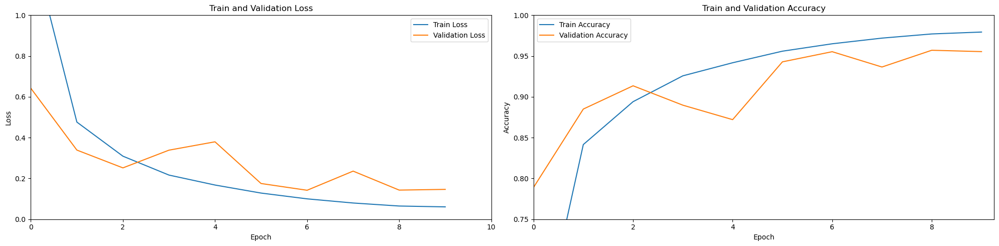

In [15]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.title("Train and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(history.history['loss'],label="Train Loss")
plt.plot(history.history['val_loss'], label="Validation Loss")
plt.xlim(0, 10)
plt.ylim(0.0,1.0)
plt.savefig("./Output1")
plt.legend()

plt.subplot(1,2,2)
plt.title("Train and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(history.history['accuracy'], label="Train Accuracy")
plt.plot(history.history['val_accuracy'], label="Validation Accuracy")
plt.xlim(0, 9.25)
plt.ylim(0.75,1.0)
plt.savefig("./Output2")
plt.legend()
plt.tight_layout()

In [10]:
labels = []
predictions = []
for x,y in test_gen:
    labels.append(list(y.numpy()))
    predictions.append(tf.argmax(model.predict(x),1).numpy())

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executin

2024-12-22 20:52:18.512902: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512930: I tensorflow/core/common_runtime/placer.cc:125] args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512942: I tensorflow/core/common_runtime/placer.cc:125] ReadFile: (ReadFile): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512950: I tensorflow/core/common_runtime/placer.cc:125] decode_image/DecodeImage: (DecodeImage): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512958: I tensorflow/core/common_runtime/placer.cc:125] resize/ExpandDims: (ExpandDims): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512965: I tensorflow/core/common_runtime/placer.cc:125] resize/ResizeBilinear: (ResizeBilinear): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.512973: I tensorflow/core/common_runtime/placer.cc:125] resize/Squeeze: (Squeeze): /j

Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
device:CPU:0
resize/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
rescaling_1/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
rescaling_1/add: (AddV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
identity_1_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
rescaling_1/Cast/x: (Const): /job:localhost/replica:0/task:0/device:CPU:0

sequential_1_conv2d_1_2_reshape_rExecuting op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


2024-12-22 20:52:18.716303: I tensorflow/core/common_runtime/placer.cc:125] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716316: I tensorflow/core/common_runtime/placer.cc:125] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716318: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716320: I tensorflow/core/common_runtime/placer.cc:125] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716322: I tensorflow/core/common_runtime/placer.cc:125] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716324: I tensorflow/core/common_runtime/placer.cc:125] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:18.716326: I tensorflow/core/common_runtime/placer.cc:125] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2024-

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDa

b:localhost/replica:0/task:0/device:GPU:0
sequential_1/conv2d_9_1/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/conv2d_9_1/add: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/conv2d_9_1/Relu: (Relu): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/flatten_1/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1/Cast/ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1/Add/ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1/Add: (AddV2): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1/Relu: (Relu): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1_2/Cast/ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
sequential_1/dense_1_2/MatMul: (MatMul): /job:localhost

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


2024-12-22 20:52:19.163082: I tensorflow/core/common_runtime/placer.cc:125] input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.163092: I tensorflow/core/common_runtime/placer.cc:125] dimension: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.163095: I tensorflow/core/common_runtime/placer.cc:125] ArgMax: (ArgMax): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.163097: I tensorflow/core/common_runtime/placer.cc:125] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.166678: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.166687: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.166689: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.166694

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:19.444002: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.444023: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.444028: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.444036: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.444041: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.451740: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.451763: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

alhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localh

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:19.738046: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.738063: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.738067: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.738074: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.738079: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.744389: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:19.744398: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:20.002230: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.002242: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.002244: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.002249: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.002251: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.007552: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.007562: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in devic

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:20.315061: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.315073: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.315075: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.315079: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.315082: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.321735: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.321745: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:20.589376: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.589426: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.589435: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.589509: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.589517: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.597146: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.597158: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
a: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Re

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset

2024-12-22 20:52:20.861930: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.861967: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.861974: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.861986: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.861991: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.867532: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:20.867545: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:21.147074: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.147083: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.147086: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.147090: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.147093: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.150095: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.150104: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
lhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/repl

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing o

2024-12-22 20:52:21.433190: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.433213: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.433217: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.433226: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.433230: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.440453: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.440464: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


2024-12-22 20:52:21.717626: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.717654: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.717659: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.717670: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.717675: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.724988: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:21.725001: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:22.002399: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.002412: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.002414: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.002420: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.002423: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.007426: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.007436: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Exe

2024-12-22 20:52:22.204272: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.204283: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.204285: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.205333: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.205340: I tensorflow/core/common_runtime/placer.cc:125] buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.205344: I tensorflow/core/common_runtime/placer.cc:125] PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.205353: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


2024-12-22 20:52:22.415479: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.415502: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.415518: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.415528: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.415533: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.423760: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.423772: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:22.706948: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.706973: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.706978: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.706988: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.706993: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.712973: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:22.712985: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


2024-12-22 20:52:23.008390: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.008399: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.008401: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.008405: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.008408: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.016270: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.016281: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:23.292787: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.292797: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.292799: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.292822: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.292824: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.298539: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.298550: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:23.569703: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.569718: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.569721: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.569726: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.569728: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.575649: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.575659: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:23.842115: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.842150: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.842171: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.842176: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.842179: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.847822: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:23.847830: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:24.108595: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.108619: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.108624: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.108634: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.108638: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.114487: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.114503: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:24.402433: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.402454: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.402458: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.402467: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.402472: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.409567: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.409578: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

t/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/

Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in devic

2024-12-22 20:52:24.698544: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.698560: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.698563: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.698567: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.698570: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.706432: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.706445: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:24.985359: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.985385: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.985389: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.985400: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.985405: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.991577: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:24.991588: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ice:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
i

Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ra

2024-12-22 20:52:25.264294: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.264304: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.264306: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.264311: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.264313: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.269148: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.269157: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:25.529787: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.529797: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.529800: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.529804: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.529806: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.535932: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.535941: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
evice:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Options

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:25.798406: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.798422: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.798425: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.798429: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.798432: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.803997: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:25.804006: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:26.068375: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.068400: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.068406: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.068415: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.068420: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.075369: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.075379: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:26.334225: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.334250: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.334256: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.334265: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.334269: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.339261: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.339271: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:26.611251: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.611274: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.611279: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.611291: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.611296: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.617891: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.617902: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:26.896825: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.896838: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.896840: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.896845: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.896847: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.903045: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:26.903060: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhos

2024-12-22 20:52:27.177004: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.177028: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.177033: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.177043: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.177047: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.183316: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.183327: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:27.458734: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.458758: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.458763: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.458776: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.458781: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.465559: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.465571: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:27.742091: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.742111: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.742116: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.742125: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.742129: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.748322: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:27.748334: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:28.019429: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.019440: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.019442: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.019446: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.019449: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.026206: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.026216: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:28.307893: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.307914: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.307919: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.307928: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.307932: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.315749: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.315762: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:28.600914: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.600951: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.600956: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.600965: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.600969: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.606722: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.606737: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ca:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0

GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/re

2024-12-22 20:52:28.879048: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.879059: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.879061: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.879065: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.879068: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.886115: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:28.886125: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:29.152058: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.152072: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.152074: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.152079: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.152082: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.157139: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.157155: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
U:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer

range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/devic

2024-12-22 20:52:29.414500: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.414510: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.414513: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.414517: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.414519: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.420904: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.420914: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


2024-12-22 20:52:29.702139: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.702164: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.702169: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.702179: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.702183: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.710481: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.710493: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:29.992238: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.992259: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.992263: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.992272: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.992276: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.998347: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:29.998358: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:30.275431: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.275448: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.275453: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.275461: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.275465: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.281319: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.281331: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:30.556493: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.556515: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.556520: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.556529: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.556534: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.562117: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.562128: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapData

2024-12-22 20:52:30.824236: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.824250: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.824253: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.824260: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.824263: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.829268: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:30.829300: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:31.090087: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.090113: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.090118: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.090128: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.090133: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.095383: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.095393: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/devic

2024-12-22 20:52:31.359727: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.359737: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.359740: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.359744: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.359747: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.363970: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.363981: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:31.636661: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.636674: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.636676: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.636682: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.636684: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.642374: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.642384: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:31.901298: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.901322: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.901325: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.901329: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.901332: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.906462: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:31.906472: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:32.167371: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.167383: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.167385: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.167390: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.167392: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.172193: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.172203: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


2024-12-22 20:52:32.442287: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.442316: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.442321: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.442332: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.442337: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.448528: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.448539: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:32.720191: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.720213: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.720217: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.720231: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.720236: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.728114: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.728125: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
etchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identit

Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:32.996849: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.996878: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.996883: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.996893: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:32.996897: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.002333: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.002343: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:33.269584: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.269598: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.269600: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.269605: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.269608: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.275389: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.275399: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:

identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
inp

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:33.539332: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.539357: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.539362: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.539372: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.539377: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.544978: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.544988: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:33.809880: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.809892: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.809894: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.809898: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.809901: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.815719: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:33.815727: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:34.081636: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.081649: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.081651: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.081657: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.081659: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.087512: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.087523: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


2024-12-22 20:52:34.370256: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.370281: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.370286: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.370295: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.370300: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.376479: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.376492: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:34.642412: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.642437: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.642442: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.642452: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.642457: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.647770: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.647781: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:34.905473: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.905486: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.905489: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.905493: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.905496: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.911179: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:34.911188: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:35.167446: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.167475: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.167481: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.167492: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.167496: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.173267: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.173277: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:35.429760: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.429785: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.429790: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.429800: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.429805: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.435126: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.435137: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:35.693640: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.693654: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.693656: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.693662: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.693664: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.699464: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.699473: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:35.962829: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.962841: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.962844: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.962848: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.962851: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.968502: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:35.968512: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:36.228619: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.228645: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.228653: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.228662: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.228667: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.234263: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.234272: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
 (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/

task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/re

Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:36.494021: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.494043: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.494047: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.494056: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.494061: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.501504: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.501518: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:36.763033: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.763043: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.763045: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.763049: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.763051: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.768637: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:36.768647: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/r

lhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Sl

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/t

2024-12-22 20:52:37.028048: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.028059: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.028061: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.028065: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.028067: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.034521: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.034533: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:37.300866: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.300892: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.300896: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.300907: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.300912: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.306200: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.306209: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:37.567842: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.567867: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.567873: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.567883: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.567900: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.574418: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.574430: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:37.833615: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.833642: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.833646: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.833663: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.833667: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.840248: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:37.840258: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:38.100985: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.100999: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.101001: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.101009: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.101012: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.106848: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.106856: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:38.365458: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.365474: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.365476: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.365483: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.365485: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.371381: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.371390: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:38.629100: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.629116: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.629119: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.629125: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.629128: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.634400: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.634409: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


2024-12-22 20:52:38.895859: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.895871: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.895873: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.895878: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.895880: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.902199: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:38.902210: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:39.166391: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.166415: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.166419: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.166429: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.166434: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.171684: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.171695: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:39.436218: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.436230: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.436232: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.436237: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.436239: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.442579: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.442589: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:39.704175: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.704202: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.704207: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.704215: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.704220: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.710120: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.710131: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

host/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localho

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:39.966298: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.966312: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.966314: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.966318: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.966320: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.970147: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:39.970158: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:40.236569: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.236584: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.236587: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.236594: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.236596: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.241729: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.241738: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
lica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/tas

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset

2024-12-22 20:52:40.507347: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.507357: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.507359: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.507363: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.507365: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.515522: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.515535: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:40.780669: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.780680: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.780682: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.780687: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.780689: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.786257: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:40.786268: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/devic

ataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:

2024-12-22 20:52:41.047849: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.047859: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.047861: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.047865: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.047868: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.054422: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.054435: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:41.314952: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.314967: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.314969: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.314974: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.314976: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.320290: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.320299: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:41.594409: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.594419: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.594421: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.594425: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.594427: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.600537: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.600546: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Val: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetV

2024-12-22 20:52:41.863479: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.863495: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.863497: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.863504: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.863506: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.869702: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:41.869715: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:42.132840: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.132852: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.132854: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.132859: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.132861: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.139357: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.139368: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:42.416630: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.416651: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.416656: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.416664: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.416669: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.424498: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.424511: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:42.691509: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.691522: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.691524: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.691530: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.691532: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.699356: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.699366: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/

Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:42.971700: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.971721: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.971726: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.971735: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.971741: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.977954: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:42.977966: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:43.237496: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.237529: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.237534: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.237544: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.237549: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.242117: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.242129: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:43.502803: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.502812: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.502814: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.502818: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.502820: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.507887: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.507898: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:43.767498: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.767533: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.767537: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.767550: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.767556: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.772541: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:43.772551: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape):

it: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (

2024-12-22 20:52:44.033071: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.033095: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.033100: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.033110: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.033115: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.038211: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.038221: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:44.299929: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.299939: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.299941: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.299946: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.299948: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.305459: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.305468: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ce:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Pre

Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task

2024-12-22 20:52:44.566400: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.566423: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.566427: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.566437: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.566442: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.571579: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.571591: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


2024-12-22 20:52:44.838550: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.838566: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.838568: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.838574: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.838576: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.844754: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:44.844764: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:45.111893: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.111903: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.111905: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.111909: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.111911: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.118418: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.118430: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:45.379773: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.379783: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.379785: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.379790: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.379792: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.385283: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.385293: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:45.646401: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.646429: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.646434: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.646444: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.646449: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.652218: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.652231: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
h

2024-12-22 20:52:45.915582: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.915608: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.915613: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.915623: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.915628: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.920758: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:45.920771: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:46.184038: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.184063: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.184067: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.184078: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.184083: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.189906: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.189918: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


2024-12-22 20:52:46.453767: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.453791: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.453796: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.453806: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.453811: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.459027: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.459039: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:46.715646: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.715674: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.715679: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.715688: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.715693: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.721767: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.721777: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:46.986059: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.986069: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.986071: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.986075: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.986077: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.991592: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:46.991613: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:47.252829: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.252849: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.252854: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.252879: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.252886: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.258739: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.258749: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

t: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (

2024-12-22 20:52:47.526308: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.526321: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.526323: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.526352: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.526367: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.532511: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.532521: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/t

2024-12-22 20:52:47.830672: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.830682: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.830684: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.830689: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.830691: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.835922: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:47.835932: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
e_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset

2024-12-22 20:52:48.094868: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.094879: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.094881: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.094885: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.094887: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.100124: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.100133: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:48.361113: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.361129: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.361131: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.361138: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.361141: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.366386: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.366395: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval)

Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localh

2024-12-22 20:52:48.627816: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.627842: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.627846: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.627855: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.627860: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.633371: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.633386: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:48.891702: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.891729: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.891734: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.891753: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.891767: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.897071: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:48.897080: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:49.157625: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.157637: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.157639: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.157646: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.157648: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.162207: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.162216: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Ar

2024-12-22 20:52:49.430219: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.430230: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.430232: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.430237: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.430240: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.436820: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.436829: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:49.704894: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.704907: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.704909: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.704914: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.704916: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.709979: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.709989: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

ica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:49.968404: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.968416: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.968418: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.968423: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.968426: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.974320: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:49.974331: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:50.233164: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.233178: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.233181: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.233186: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.233188: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.237564: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.237572: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:50.500332: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.500340: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.500342: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.500346: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.500348: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.504482: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.504491: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:50.764833: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.764857: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.764861: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.764870: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.764875: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.769922: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:50.769933: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:51.029386: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.029411: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.029416: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.029425: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.029430: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.033848: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.033858: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:51.292809: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.292820: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.292822: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.292826: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.292828: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.297284: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.297292: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
ice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0

Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhos

2024-12-22 20:52:51.556959: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.556973: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.556975: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.556980: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.556983: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.561549: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.561558: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:51.822886: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.822902: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.822904: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.822910: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.822912: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.827934: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:51.827942: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
sDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Iterato

2024-12-22 20:52:52.087367: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.087378: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.087380: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.087384: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.087387: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.092304: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.092314: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:52.351614: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.351624: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.351626: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.351630: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.351632: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.356841: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.356849: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:52.620356: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.620386: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.620392: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.620404: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.620409: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.625408: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.625418: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:52.884044: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.884068: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.884072: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.884082: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.884086: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.889699: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:52.889709: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:53.149209: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.149235: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.149239: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.149266: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.149289: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.154864: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.154876: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/t

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:53.416452: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.416512: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.416526: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.416535: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.416552: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.421443: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.421454: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:53.681972: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.681991: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.681993: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.682001: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.682005: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.687743: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.687751: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


2024-12-22 20:52:53.949542: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.949560: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.949564: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.949572: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.949577: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.954742: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:53.954752: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:54.217951: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.217976: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.217980: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.217990: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.217994: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.223290: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.223300: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:54.481040: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.481061: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.481065: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.481074: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.481078: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.486535: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.486547: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:54.745742: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.745769: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.745774: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.745783: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.745789: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.751068: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:54.751077: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

calhost/replica:0/task:0/device:CPU:0
range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:loca

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:55.012273: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.012286: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.012288: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.012293: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.012295: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.016760: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.016771: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:55.274873: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.274885: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.274887: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.274892: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.274894: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.280282: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.280291: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/repl

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset

2024-12-22 20:52:55.541211: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.541238: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.541243: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.541255: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.541260: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.546021: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.546033: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:55.805687: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.805697: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.805699: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.805703: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.805705: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.811957: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:55.811967: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
plica:0/task:0/device:CPU:0
ZipDataset: (ZipDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
num__parallel__calls: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ParallelMapDatasetV2: (ParallelMapDatasetV2): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:

l): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval

2024-12-22 20:52:56.070146: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.070173: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.070177: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.070188: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.070192: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.075778: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.075788: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


2024-12-22 20:52:56.335270: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.335295: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.335300: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.335310: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.335316: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.340655: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.340665: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:56.601922: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.601947: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.601952: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.601962: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.601967: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.606324: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.606336: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

ut__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
inpu

2024-12-22 20:52:56.865237: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.865248: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.865250: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.865254: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.865257: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.871074: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:56.871084: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:57.151057: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.151069: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.151071: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.151076: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.151079: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.155747: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.155760: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


2024-12-22 20:52:57.434526: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.434543: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.434546: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.434552: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.434555: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.440597: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.440608: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:57.718225: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.718249: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.718254: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.718271: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.718276: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.726475: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:57.726488: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:

Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:

2024-12-22 20:52:58.011511: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.011533: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.011537: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.011561: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.011608: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.019042: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.019056: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:58.307784: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.307808: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.307812: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.307822: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.307827: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.313943: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.313955: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:52:58.595343: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.595355: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.595357: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.595361: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.595364: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.602582: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.602592: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:58.870287: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.870300: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.870319: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.870325: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.870328: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.877610: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:58.877622: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
ask:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset

range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
Slice: (Slice): /job:localhost/replica:0/task:0/device:CPU:0
Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Slice/begin: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Slice/size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
id

2024-12-22 20:52:59.143879: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.143908: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.143913: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.143922: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.143927: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.147863: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.147874: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:59.419699: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.419714: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.419716: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.419722: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.419724: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.424412: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.424424: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ra

Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


2024-12-22 20:52:59.622071: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.622080: I tensorflow/core/common_runtime/placer.cc:125] OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.622083: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.623398: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.623406: I tensorflow/core/common_runtime/placer.cc:125] OptionsDataset: (OptionsDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.623408: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.624524: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:l

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

2024-12-22 20:52:59.905815: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.905826: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.905828: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.905837: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.905840: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.909400: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:52:59.909410: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Option

Executing op __inference_one_step_on_data_distributed_180044 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in 

2024-12-22 20:53:00.202930: I tensorflow/core/common_runtime/placer.cc:125] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.202944: I tensorflow/core/common_runtime/placer.cc:125] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.202946: I tensorflow/core/common_runtime/placer.cc:125] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.202950: I tensorflow/core/common_runtime/placer.cc:125] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.202952: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.206290: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.206303: I tensorflow/core/common_runtime/placer.cc:125] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024

Executing op __inference_one_step_on_data_distributed_195513 in device /job:localhost/replica:0/task:0/device:GPU:0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ArgMax in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0


2024-12-22 20:53:00.417801: I tensorflow/core/common_runtime/placer.cc:125] data: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 20:53:00.417811: I tensorflow/core/common_runtime/placer.cc:125] sequential_1_conv2d_1_convolution_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 20:53:00.417814: I tensorflow/core/common_runtime/placer.cc:125] sequential_1_conv2d_1_reshape_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 20:53:00.417816: I tensorflow/core/common_runtime/placer.cc:125] sequential_1_conv2d_1_2_convolution_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 20:53:00.417819: I tensorflow/core/common_runtime/placer.cc:125] sequential_1_conv2d_1_2_reshape_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 20:53:00.417821: I tensorflow/core/common_runtime/placer.cc:125] sequential_1_conv2d_2_1_convolution_readv

In [12]:
import itertools
predictions = list(itertools.chain.from_iterable(predictions))
labels = list(itertools.chain.from_iterable(labels))

In [13]:
print("Train Accuracy  : {:.2f} %".format(history.history['accuracy'][-1]*100))
print("Test Accuracy   : {:.2f} %".format(accuracy_score(labels, predictions) * 100))
print("Precision Score : {:.2f} %".format(precision_score(labels, predictions, average='micro') * 100))
print("Recall Score    : {:.2f} %".format(recall_score(labels, predictions, average='micro') * 100))

Train Accuracy  : 97.94 %
Test Accuracy   : 95.54 %
Precision Score : 95.54 %
Recall Score    : 95.54 %
